In [91]:
import json
import numpy as np
import cv2
import heapq
import os
import networkx as nx
import time
from sklearn.neighbors import KDTree, BallTree
import torchvision
from PIL import Image
import torch
import yaml
import shapely.geometry as geom
import scipy
import matplotlib.pyplot as plt
from pos_regression_control import PosRegModel
import matplotlib.pyplot as plt
from descartes import PolygonPatch
import pickle, random
from sklearn.metrics import pairwise_distances

In [92]:
# Load keypoints from JSON files in a given directory
def load_keypoints_from_json(directory):
    configurations = []
    configuration_ids = []
    for filename in os.listdir(directory):
        if filename.endswith('.json') and not filename.endswith('_joint_angles.json') and not filename.endswith('_vel.json'):
            with open(os.path.join(directory, filename), 'r') as file:
                data = json.load(file)
                keypoints = [np.array(point[0][:2], dtype=int) for point in data['keypoints']]  # Extracting x, y coordinates
                
                configurations.append(np.array(keypoints))
                configuration_ids.append(data['id'])  # Store the configuration ID

    print("length of configurations", len(configurations))
    return configurations, configuration_ids

def load_joint_angles_from_json(directory):
    joint_angles_dict = {}
    for filename in os.listdir(directory):
        if filename.endswith('_joint_angles.json'):
            with open(os.path.join(directory, filename), 'r') as file:
                data = json.load(file)
                joint_angles_dict[data['id']] = np.array(data['joint_angles'])
    return joint_angles_dict

def load_keypoints_from_truncated_json(directory):
    configurations = []
    for filename in os.listdir(directory):
        # if filename.endswith('.json'):
        if filename.endswith('.json') and not filename.endswith('_joint_angles.json') and not filename.endswith('_vel.json'):
            file_index = int(filename.split('.')[0])
            if file_index >= 10000:
                file_path = os.path.join(directory, filename)
                with open(file_path, 'r') as file:
                    data = json.load(file)
                    # Convert keypoints to integers
                    keypoints = [np.array(point[0][:2], dtype=int) for point in data['keypoints']]  # Extracting x, y coordinates
                    configurations.append(np.array(keypoints))

    return configurations

def load_and_sample_configurations(directory, num_samples):
    # Load configurations from JSON files
    configurations = load_keypoints_from_json(directory)

    # If there are more configurations than needed, sample a subset
    if len(configurations) > num_samples:
        sampled_indices = np.random.choice(len(configurations), size=num_samples, replace=False)
        sampled_configurations = [configurations[i] for i in sampled_indices]
    else:
        sampled_configurations = configurations

    return sampled_configurations

def save_graph(custom_graph, custom_tree, euclidean_graph, euclidean_tree, \
                gt_graph, gt_tree, custom_graph_path, custom_tree_path, \
                euclidean_g_path, euclidean_tree_path, gt_graph_path, gt_tree_path):
    
    with open(custom_graph_path, 'wb') as f:
        pickle.dump(custom_graph, f)
    with open(custom_tree_path, 'wb') as f:
        pickle.dump(custom_tree, f)
    print(f"Graph saved to {custom_graph_path}")
    print(f"BallTree saved to {custom_tree_path}")

    with open(euclidean_g_path, 'wb') as f:
        pickle.dump(euclidean_graph, f)
    with open(euclidean_tree_path, 'wb') as f:
        pickle.dump(euclidean_tree, f)
    print(f"Graph saved to {euclidean_g_path}")
    print(f"KDTree saved to {euclidean_tree_path}")

    with open(gt_graph_path, 'wb') as f:
        pickle.dump(gt_graph, f)
    with open(gt_tree_path, 'wb') as f:
        pickle.dump(gt_tree, f)
    print(f"Graph saved to {gt_graph_path}")
    print(f"KDTree with joint distance saved to {gt_tree_path}")

In [93]:
def skip_configurations(configurations, configuration_ids, skip_step, start, end):
    # Skip the configurations based on the step, start, and end parameters
    skipped_configs = configurations[start:end:skip_step]
    skipped_ids = configuration_ids[start:end:skip_step]
    
    return skipped_configs, skipped_ids
    
#     # Pair the skipped configurations with their IDs for consistent shuffling
#     paired_configs = list(zip(skipped_configs, skipped_ids))
    
#     # Shuffle the paired configurations and IDs
#     random.shuffle(paired_configs)
    
#     # Unzip the shuffled pairs back into configurations and IDs
#     shuffled_configs, shuffled_ids = zip(*paired_configs)

#     print("length of shuffled configurations", len(shuffled_configs))
    
#     return list(shuffled_configs), list(shuffled_ids)

def load_model_for_inference(model_path):    
    model = PosRegModel(18)
    model.load_state_dict(torch.load(model_path))
    model.eval()  # Set the model to inference mode
    return model

def predict_custom_distance(current_config, next_config, model):
    # Convert to 2D tensors if necessary
    start_kp_flat = torch.tensor(current_config.flatten(), dtype=torch.float).unsqueeze(0)  # Add batch dimension
    next_kp_flat = torch.tensor(next_config.flatten(), dtype=torch.float).unsqueeze(0)  # Add batch dimension

    # Predict the next configuration
    with torch.no_grad():
        output = model(start_kp_flat, next_kp_flat).squeeze(0).numpy()  # Remove batch dimension for output

    distance = np.linalg.norm(output)
    return float(distance)  # Reshape to the original configuration format

def custom_distance(x, y):
    # Ensure x and y are in the format the model expects (flattened arrays)
    return predict_custom_distance(x, y, model)

def compute_max_min_distances(flattened_configs):
    # Compute pairwise Euclidean distances for all configurations
    distance_matrix = pairwise_distances(flattened_configs)    
    # Extract the max and min distances
    max_distance = np.max(distance_matrix)
    min_distance = np.min(distance_matrix)
    
    return max_distance, min_distance

In [94]:
# configurations, configuration_ids = load_keypoints_from_json(directory)
# skip_step = 2500
# start_index = 1
# end_index = 25000

# skipped_configs, skipped_ids = skip_configurations(configurations, configuration_ids, \
#                                                        skip_step, start_index, end_index)

# flattened_configs = np.vstack([config.flatten() for config in skipped_configs])
# print(flattened_configs)

# compute_max_min_distances(flattened_configs)



In [95]:
def build_lazy_roadmap_with_knn(configurations, configuration_ids, joint_angles_dict, model, k_neighbors):
    """
    Build a LazyPRM roadmap using a KDTree for efficient nearest neighbor search.
    
    Args:
    - configurations: List[np.array], a list of configurations (keypoints flattened).
    - k_neighbors: int, the number of neighbors to connect to each node.
    
    Returns:
    - G: nx.Graph, the constructed roadmap.
    """

    flattened_configs = np.vstack([config.flatten() for config in configurations])
    flattened_config_ids = np.vstack([config_id for config_id in configuration_ids])
    # Extract joint angles using the configuration IDs
    joint_angles_list = [joint_angles_dict[config_id] for config_id in configuration_ids]
    joint_angles_array = np.vstack(joint_angles_list)

    custom_tree = BallTree(flattened_configs, metric=custom_distance)
    euclidean_tree = KDTree(flattened_configs)
    gt_tree = KDTree(joint_angles_array)

    custom_G = nx.Graph()
    euclidean_G = nx.Graph()
    gt_G = nx.Graph()        

    # Add nodes in the graph from the configurations and 
    for i, (config, config_id) in enumerate(zip(configurations, configuration_ids)):
        custom_G.add_node(i, configuration=config, joint_angles=joint_angles_dict[config_id])
        euclidean_G.add_node(i, configuration=config, joint_angles=joint_angles_dict[config_id])
        gt_G.add_node(i, configuration=config, joint_angles=joint_angles_dict[config_id])        

    # generate nearest neighbors with custom joint distance
    for i, (config, config_id, joint) in enumerate(zip(flattened_configs, flattened_config_ids, joint_angles_array)):
        print(f"Id {config_id} for configuration {config} and angles {joint}" )
        print('node_i', i)
        distances, indices = custom_tree.query([config], k=k_neighbors + 1)  # +1 to include self in results
        print(indices, distances)
        for j, d in zip(indices[0], distances[0]):  # Skip self
            print('node_j', j)
            if j != i:
                custom_G.add_edge(i, j, weight=d)
    print("Edges Custom", custom_G.edges)

    # generate nearest neighbors with default euclidean distances between configs in image space
    for i, (config, config_id, joint) in enumerate(zip(flattened_configs, flattened_config_ids, joint_angles_array)):
        print(f"Id {config_id} for configuration {config} and angles {joint}" )
        print('node_i', i)
        distances, indices = euclidean_tree.query([config], k=k_neighbors + 1)  # +1 to include self in results
        print(indices, distances)
        for j, d in zip(indices[0], distances[0]):  # Skip self
            print('node_j', j)
            if j != i:
                euclidean_G.add_edge(i, j, weight=d)
    print("Edges Euclidean", euclidean_G.edges)

    # generate nearest neighbors with actual joint distances between configs in configuration space
    for i, (config, config_id, joint) in enumerate(zip(flattened_configs, flattened_config_ids, joint_angles_array)):
        print(f"Id {config_id} for configuration {config} and angles {joint}" )
        print('node_i', i)
        distances, indices = gt_tree.query([joint], k=k_neighbors + 1)  # +1 to include the node itself        
        print(indices, distances)
        for d, j in zip(distances[0], indices[0]):
            print('node_j', j)
            if i != j:  # Avoid self-loops
                gt_G.add_edge(i, j, weight=d)  
    print("Edges GT", gt_G.edges)

    return custom_G, custom_tree, euclidean_G, euclidean_tree, gt_G, gt_tree

In [89]:
def build_lazy_roadmap_with_radius(configurations, configuration_ids, joint_angles_dict, model, radius):
    """
    Build a LazyPRM roadmap using a KDTree for efficient radius nearest neighbor search.
    
    Args:
    - configurations: List[np.array], a list of configurations (keypoints flattened).
    - radius: float, the search radius for connecting nodes to their neighbors.
    
    Returns:
    - G: nx.Graph, the constructed roadmap.
    """

    flattened_configs = np.vstack([config.flatten() for config in configurations])
    flattened_config_ids = np.vstack([config_id for config_id in configuration_ids])
    # Extract joint angles using the configuration IDs
    joint_angles_list = [joint_angles_dict[config_id] for config_id in configuration_ids]
    joint_angles_array = np.vstack(joint_angles_list)

    custom_tree = BallTree(flattened_configs, metric=custom_distance)
    euclidean_tree = KDTree(flattened_configs)
    gt_tree = KDTree(joint_angles_array)

    custom_G = nx.Graph()
    euclidean_G = nx.Graph()
    gt_G = nx.Graph() 
    
    max_distance, min_distance = compute_max_min_distances(flattened_configs)

    # Add nodes in the graph from the configurations
    for i, (config, config_id) in enumerate(zip(configurations, configuration_ids)):
        custom_G.add_node(i, configuration=config, joint_angles=joint_angles_dict[config_id])
        euclidean_G.add_node(i, configuration=config, joint_angles=joint_angles_dict[config_id])
        gt_G.add_node(i, configuration=config, joint_angles=joint_angles_dict[config_id])        

    # Generate nearest neighbors within the given radius for custom joint distance
    for i, (config, config_id, joint) in enumerate(zip(flattened_configs, flattened_config_ids, joint_angles_array)):
        print(f"Id {config_id} for configuration {config} and angles {joint}" )
        print('node_i', i)
        indices = custom_tree.query_radius([config], r=radius)
        print(indices)
        for j in indices[0]:
            print('node_j', j)
            if j != i:
                d = custom_distance(config, flattened_configs[j])
                custom_G.add_edge(i, j, weight=d)
    print("Edges Custom", custom_G.edges)
    
    print(flattened_configs)

    # Generate nearest neighbors within the given radius for Euclidean distance in image space
    for i, (config, config_id, joint) in enumerate(zip(flattened_configs, flattened_config_ids, joint_angles_array)):
        print(f"Id {config_id} for configuration {config} and angles {joint}" )
        print('node_i', i)
#         indices = euclidean_tree.query_radius([config], r=radius)
        distances, indices = euclidean_tree.query_radius([config], r=100, return_distance=True)
        print("distances in euclidean", distances[0])
        print(indices)
        for j in indices[0]:
            print('node_j', j)
            if j != i:
                d = np.linalg.norm(config - flattened_configs[j])
                euclidean_G.add_edge(i, j, weight=d)
    print("Edges Euclidean", euclidean_G.edges)

    # Generate nearest neighbors within the given radius for joint distances in configuration space
    for i, (config, config_id, joint) in enumerate(zip(flattened_configs, flattened_config_ids, joint_angles_array)):
        print(f"Id {config_id} for configuration {config} and angles {joint}" )
        print('node_i', i)
        indices = gt_tree.query_radius([joint], r=radius)
        print(indices)
        for j in indices[0]:
            print('node_j', j)
            if i != j:  # Avoid self-loops
                d = np.linalg.norm(joint - joint_angles_array[j])
                gt_G.add_edge(i, j, weight=d)
    print("Edges GT", gt_G.edges)

    return custom_G, custom_tree, euclidean_G, euclidean_tree, gt_G, gt_tree

In [90]:
# custom_roadmap, custom_tree, euclidean_roadmap, euclidean_tree, gt_roadmap, gt_tree = \
#                             build_lazy_roadmap_with_radius(skipped_configs, skipped_ids, joint_angles_dict, \
#                                                            model, 0.5)

Id [6858] for configuration [250 442 252 311 210 271 167 231 188 209 248 167 309 125 330 101 361 128] and angles [-0.83294619 -2.01598498  2.02816894]
node_i 0
[array([0, 1, 3, 5])]
node_j 0
node_j 1
node_j 3
node_j 5
Id [15685] for configuration [250 442 252 311 199 287 146 263 159 235 212 185 266 135 264 103 304 101] and angles [-1.15331764 -2.17701028  2.66488246]
node_i 1
[array([0, 1, 3, 5])]
node_j 0
node_j 1
node_j 3
node_j 5
Id [4287] for configuration [250 442 252 311 278 257 303 203 331 215 372 154 414  92 442  75 464 111] and angles [ 0.43157627 -0.36695107  1.33246866]
node_i 2
[array([0, 2, 3, 5, 9])]
node_j 0
node_j 2
node_j 3
node_j 5
node_j 9
Id [13798] for configuration [250 442 252 311 199 287 147 262 160 234 127 174  94 113  74  92 101  66] and angles [-1.14899539 -0.83997185  2.03050691]
node_i 3
[array([0, 1, 3, 5])]
node_j 0
node_j 1
node_j 3
node_j 5
Id [12628] for configuration [250 442 252 311 293 267 334 223 357 244 435 245 512 246 517 280 474 286] and angles 

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [96]:
def plot_connected_joints_3d(roadmap, color, label, output_path):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    # Loop over edges to get the connected nodes
    for edge in roadmap.edges():
        node1, node2 = edge

        joint_angles_1 = roadmap.nodes[node1]['joint_angles']
        joint_angles_2 = roadmap.nodes[node2]['joint_angles']

        joint_1 = [joint_angles_1[0], joint_angles_2[0]]
        joint_2 = [joint_angles_1[1], joint_angles_2[1]]
        joint_3 = [joint_angles_1[2], joint_angles_2[2]]

        # Plot the line between connected nodes (configurations)
        ax.plot(joint_1, joint_2, joint_3, marker='o', color=color)

    ax.set_xlabel('Joint 1')
    ax.set_ylabel('Joint 2')
    ax.set_zlabel('Joint 3')

    plt.title(f'Connected Joints 3D Plot for {label}')
    plt.savefig(output_path)
    plt.show()
    plt.close()

# Function to plot connected joints in 3D for all roadmaps together
def plot_connected_joints_3d_all(roadmaps, labels, output_path):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    colors = ['b', 'g', 'r']  # Different colors for different roadmaps

    for roadmap, label, color in zip(roadmaps, labels, colors):
        # Loop over edges to get the connected nodes
        for edge in roadmap.edges():
            node1, node2 = edge

            joint_angles_1 = roadmap.nodes[node1]['joint_angles']
            joint_angles_2 = roadmap.nodes[node2]['joint_angles']

            joint_1 = [joint_angles_1[0], joint_angles_2[0]]
            joint_2 = [joint_angles_1[1], joint_angles_2[1]]
            joint_3 = [joint_angles_1[2], joint_angles_2[2]]

            # Plot the line between connected nodes (configurations) for this roadmap
            ax.plot(joint_1, joint_2, joint_3, marker='o', label=label if edge == list(roadmap.edges())[0] else "", color=color)

    ax.set_xlabel('Joint 1')
    ax.set_ylabel('Joint 2')
    ax.set_zlabel('Joint 3')

    plt.title('Connected Joints 3D Plot for All Roadmaps')
    ax.legend()
    plt.savefig(output_path)
    plt.show()
    plt.close()

def calculate_joint_angle_distances(graph):
    """
    Calculate joint angle distances for all edges in a graph.

    Args:
    - graph: Graph object containing nodes with joint angle data.

    Returns:
    - distances (list of float): List of joint angle distances between nodes connected by edges.
    """
    distances = []
    for u, v in graph.edges():
        if 'joint_angles' in graph.nodes[u] and 'joint_angles' in graph.nodes[v]:
            joint_angles_u = graph.nodes[u]['joint_angles']
            joint_angles_v = graph.nodes[v]['joint_angles']
            distance = np.linalg.norm(joint_angles_u - joint_angles_v)
            distances.append(distance)

    return distances

def find_common_edges(graph1, graph2):
    """
    Find edges that are common between two graphs.

    Args:
    - graph1: First graph object.
    - graph2: Second graph object.

    Returns:
    - common_edges (set of tuples): Set of edges common to both graphs.
    """
    edges1 = set(graph1.edges())
    edges2 = set(graph2.edges())
    common_edges = edges1.intersection(edges2)
    return len(common_edges)

def print_graph_statistics(graph, label):
    """
    Print detailed statistics about the graph for debugging.

    Args:
    - graph: Graph object.
    - label: Label for the graph being analyzed.

    Returns:
    - None
    """
    print(f"\n{label} - Graph Statistics:")
    print(f"Number of nodes: {graph.number_of_nodes()}")
    print(f"Number of edges: {graph.number_of_edges()}")
    
    # Print some sample edges and their weights
    edges = graph.edges(data=True)  # Print first 5 edges
    print("Edges and weights:")
    for u, v, data in edges:
        print(f"Edge ({u}, {v}) - Weight: {data.get('weight', 'N/A')}")

def plot_joint_distance_histograms(distance_list, labels, colors, output_prefix, fontsize=12):
    """
    Plot histograms of joint angle distances for multiple datasets with same x and y scaling.

    Args:
    - distance_list (list of lists): List of joint angle distances for each dataset.
    - labels (list of str): List of labels for the datasets.
    - output_prefix (str): Prefix for saving the output plot files.
    - fontsize (int): Font size for plot labels and titles.

    Returns:
    - None
    """
    plt.figure(figsize=(15, 5))  # Create a figure for the histograms

    # Determine the common x-axis and y-axis limits
    max_distance = max(max(distances) for distances in distance_list)
    max_count = max(np.histogram(distances, bins=5)[0].max() for distances in distance_list)

    # Plot histograms for the datasets
    for i, distances in enumerate(distance_list):
        plt.subplot(1, 3, i + 1)
        plt.hist(distances, bins=5, alpha=0.3, color=colors[i], label=labels[i])
        plt.title(f'{labels[i]} - Joint Angle Distances', fontsize=fontsize + 2)
        plt.xlabel('Joint Angle Distance', fontsize=fontsize)
        plt.ylabel('NUmber of Connected Edges', fontsize=fontsize)
        plt.legend(fontsize=fontsize)

        # Set the same x-axis and y-axis limits for all histograms
        plt.xlim(0, 3)
        plt.ylim(0, 8)

    plt.tight_layout()
    plt.savefig(f'{output_prefix}_joint_angle_distances.png')
    plt.show()

In [97]:
directory = '/home/jc-merlab/Pictures/panda_data/panda_sim_vel/panda_rearranged_data/path_planning_rearranged/'  # Replace with the path to your JSON files
model_path = '/home/jc-merlab/Pictures/Data/trained_models/reg_pos_b128_e500_v32.pth'
custom_graph_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/custom_roadmap_angle_rnn_10_n3.pkl'
custom_tree_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/custom_tree_angle_rnn_10_n3.pkl'
euclidean_g_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/euclidean_roadmap_rnn_10_n3.pkl'
euclidean_tree_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/euclidean_tree_rnn_10_n3.pkl'
gt_graph_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/joint_space_roadmap_angle_rnn_10_n3.pkl'
gt_tree_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/joint_space_tree_angle_rnn_10_n3.pkl'

configurations, configuration_ids = load_keypoints_from_json(directory)
model = load_model_for_inference(model_path)
joint_angles_dict = load_joint_angles_from_json(directory)

skip_step = 10
start_index = 1
end_index = 25000

skipped_configs, skipped_ids = skip_configurations(configurations, configuration_ids, \
                                                       skip_step, start_index, end_index)

skipped_log_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/skipped_config_joint_correspondence.csv'
# log_skipped_config_joint_correspondence(skipped_ids, skipped_configs, joint_angles_dict, skipped_log_path)

num_neighbors = 25

custom_roadmap, custom_tree, euclidean_roadmap, euclidean_tree, gt_roadmap, gt_tree = build_lazy_roadmap_with_kdtree(\
                                skipped_configs, skipped_ids, joint_angles_dict, model, num_neighbors)


length of configurations 24861
Id [6858] for configuration [250 442 252 311 210 271 167 231 188 209 248 167 309 125 330 101 361 128] and angles [-0.83294619 -2.01598498  2.02816894]
node_i 0
[[   0 1606  668 1219 2109  139  836 1401  551 1553 1572 2202   78 1286
   224  436 1495 1386  493 1684   91  162  132  499 2215 2350]] [[0.0107225  0.01085855 0.01255475 0.01401446 0.01422811 0.01492117
  0.01739064 0.02818183 0.03353069 0.04502425 0.05555356 0.05690277
  0.05916154 0.05957174 0.06268152 0.06411037 0.06771907 0.06812675
  0.09112303 0.09640151 0.09688662 0.09875559 0.10036583 0.10036583
  0.10460175 0.10593913]]
node_j 0
node_j 1606
node_j 668
node_j 1219
node_j 2109
node_j 139
node_j 836
node_j 1401
node_j 551
node_j 1553
node_j 1572
node_j 2202
node_j 78
node_j 1286
node_j 224
node_j 436
node_j 1495
node_j 1386
node_j 493
node_j 1684
node_j 91
node_j 162
node_j 132
node_j 499
node_j 2215
node_j 2350
Id [22623] for configuration [250 442 252 311 215 266 178 221 201 201 218 130 23

[[2064    9 1032 2144 1439 1617 2019 2199  983  143  871  588 1668   54
  2409 2166  844  424 2024 2455 1157 2132 2194  620  155  447]] [[0.00972819 0.01019089 0.01054494 0.01402861 0.01437485 0.014487
  0.01692414 0.02050156 0.03925144 0.0543888  0.06309079 0.0645463
  0.07280744 0.09894708 0.12963089 0.13510413 0.14144614 0.14272864
  0.14272864 0.14673245 0.148123   0.15129575 0.15339725 0.15707381
  0.16006461 0.16118692]]
node_j 2064
node_j 9
node_j 1032
node_j 2144
node_j 1439
node_j 1617
node_j 2019
node_j 2199
node_j 983
node_j 143
node_j 871
node_j 588
node_j 1668
node_j 54
node_j 2409
node_j 2166
node_j 844
node_j 424
node_j 2024
node_j 2455
node_j 1157
node_j 2132
node_j 2194
node_j 620
node_j 155
node_j 447
Id [21486] for configuration [250 442 252 311 249 252 245 193 276 190 324 134 372  78 377  47 416  52] and angles [-0.07306542 -1.00024621  2.36705869]
node_i 10
[[ 704 2122   10  274 1318 2097   15 1475 1741 2469 1922   83 1910  398
  1389  912 2462 1687 1649  697  151 

[[ 518  527   19 1955 1333 2205  175 1516    8 1233  201  894 2212 1330
   542  858  946  963 1458 1020 2468  206 1894 2322  349 1445]] [[0.00295835 0.00625023 0.00778444 0.01140022 0.01522326 0.01626791
  0.01761696 0.02274925 0.03572584 0.04744433 0.04744433 0.04753402
  0.04860782 0.05410377 0.06212015 0.07029442 0.07389417 0.07463809
  0.07723124 0.08096921 0.08210602 0.08406547 0.08906442 0.09102505
  0.09625202 0.10169831]]
node_j 518
node_j 527
node_j 19
node_j 1955
node_j 1333
node_j 2205
node_j 175
node_j 1516
node_j 8
node_j 1233
node_j 201
node_j 894
node_j 2212
node_j 1330
node_j 542
node_j 858
node_j 946
node_j 963
node_j 1458
node_j 1020
node_j 2468
node_j 206
node_j 1894
node_j 2322
node_j 349
node_j 1445
Id [1194] for configuration [250 442 252 311 284 261 317 210 343 226 417 249 490 271 496 306 453 313] and angles [ 0.55939409 -1.53420239  0.65865296]
node_i 20
[[ 724   20  813  847 1657  570 2077 1487 1802  948 1842 2378 1189  884
   322  577   84 2036  956 1844 1061 

[[ 838   29  660 1767  745 1322 1104  898 1065  419   40 1943 1781 2188
   492 1590 1945 1363  129 2356   90  869 2284 1040 1434   71]] [[0.00264274 0.00912759 0.01115364 0.01279013 0.01385785 0.01581347
  0.02066419 0.02304888 0.02416494 0.02731747 0.02891528 0.02928574
  0.03173691 0.03497147 0.03576598 0.03681393 0.04005014 0.04641511
  0.04641511 0.0472564  0.05096747 0.05390311 0.05606789 0.05689054
  0.06076857 0.06190559]]
node_j 838
node_j 29
node_j 660
node_j 1767
node_j 745
node_j 1322
node_j 1104
node_j 898
node_j 1065
node_j 419
node_j 40
node_j 1943
node_j 1781
node_j 2188
node_j 492
node_j 1590
node_j 1945
node_j 1363
node_j 129
node_j 2356
node_j 90
node_j 869
node_j 2284
node_j 1040
node_j 1434
node_j 71
Id [5358] for configuration [250 442 252 311 241 253 231 195 261 189 333 172 405 155 438 164 427 205] and angles [-0.20059692 -1.76778798  1.27135227]
node_i 30
[[1539   30 2103 2089  961  380  891 1771 2316 1477 1388  526 1355  935
   581 1775 1152 1372 1645 1906  541 

[[ 599   39 1253   79  834  395 1047   53  794 2076 1961 1250   92 2437
  1789 1473 1746  182  330 1077 2461 1998  833  177 1738 2197]] [[0.01360146 0.01461037 0.01828413 0.02409446 0.02611206 0.02672862
  0.03621519 0.03946283 0.04168476 0.05296872 0.0539661  0.05477433
  0.05499808 0.05499808 0.05523624 0.05523624 0.05568456 0.05700606
  0.05700606 0.05756724 0.05767474 0.06241516 0.06261754 0.06366095
  0.06480528 0.07099416]]
node_j 599
node_j 39
node_j 1253
node_j 79
node_j 834
node_j 395
node_j 1047
node_j 53
node_j 794
node_j 2076
node_j 1961
node_j 1250
node_j 92
node_j 2437
node_j 1789
node_j 1473
node_j 1746
node_j 182
node_j 330
node_j 1077
node_j 2461
node_j 1998
node_j 833
node_j 177
node_j 1738
node_j 2197
Id [20043] for configuration [250 442 252 311 267 253 282 196 312 203 385 181 457 159 481 184 450 213] and angles [ 0.24323502 -1.2599111   0.656915  ]
node_i 40
[[  40  898 1781 1590 1943 2356   90 1945  932 1104  235 1653 2310  386
  2017  745  147 1650  645  660 2072

[[  49  969  505 1861  159 1962  579   55  544 1290 1423 2364 1502  118
  2116 1086 1038  519   97 2325 2323 2332  467 1174 2436  296]] [[0.01238717 0.05323313 0.07052077 0.07819445 0.08259964 0.08439005
  0.08562612 0.08946445 0.09017882 0.10111661 0.10473676 0.10669506
  0.10693564 0.11046665 0.11209685 0.11414645 0.11468327 0.11483446
  0.11703272 0.12075764 0.13275921 0.13734026 0.14052838 0.14136866
  0.14180827 0.14893065]]
node_j 49
node_j 969
node_j 505
node_j 1861
node_j 159
node_j 1962
node_j 579
node_j 55
node_j 544
node_j 1290
node_j 1423
node_j 2364
node_j 1502
node_j 118
node_j 2116
node_j 1086
node_j 1038
node_j 519
node_j 97
node_j 2325
node_j 2323
node_j 2332
node_j 467
node_j 1174
node_j 2436
node_j 296
Id [482] for configuration [250 442 252 311 267 253 282 196 312 203 385 224 457 246 463 280 421 287] and angles [ 0.24344858 -1.84512527  0.65787168]
node_i 50
[[1209  463   50 2036  956  322 1559  346 1842  212 1231 1834 2127   85
   948 1932 1247 1580  821 2303 1782 

[[  59 1222 1091  612 1790  474 2443 1280  679   65 1664  820 1992 1344
  1680 2357  196 2220  824 2164  683 1003 2131  907  780  613]] [[0.01158729 0.02128187 0.02197248 0.02197248 0.02201871 0.02693557
  0.02715373 0.04154597 0.05147516 0.05745244 0.06445107 0.07587232
  0.07665956 0.09361719 0.10813689 0.1098556  0.11811227 0.12268567
  0.12447336 0.12628044 0.13391034 0.1414438  0.1428532  0.14311706
  0.14373003 0.14510575]]
node_j 59
node_j 1222
node_j 1091
node_j 612
node_j 1790
node_j 474
node_j 2443
node_j 1280
node_j 679
node_j 65
node_j 1664
node_j 820
node_j 1992
node_j 1344
node_j 1680
node_j 2357
node_j 196
node_j 2220
node_j 824
node_j 2164
node_j 683
node_j 1003
node_j 2131
node_j 907
node_j 780
node_j 613
Id [16058] for configuration [250 442 252 311 209 271 166 232 187 209 215 142 242  75 272  63 287 101] and angles [-0.83743392 -1.42240306  0.95770167]
node_i 60
[[  60 1845  503 2069 1683 1766 1214 2080 1803  458 2119 1977 1037  370
   940    1 2354 1515  563  560 16

[[  69 1897 1211   38 1426  901  733  585  277 1673  540  996 2200 1526
  1118  920 2363 1254 1304 1268 1784 1884 1808  432 1598 2417]] [[0.00466904 0.02934244 0.03096331 0.03541416 0.03942079 0.04413482
  0.04569615 0.04640944 0.04781767 0.05238904 0.05743827 0.05743827
  0.06109475 0.0629748  0.06472921 0.06694907 0.07253536 0.07425618
  0.07433181 0.07575814 0.09608813 0.09813217 0.10205872 0.10341045
  0.11134349 0.11345547]]
node_j 69
node_j 1897
node_j 1211
node_j 38
node_j 1426
node_j 901
node_j 733
node_j 585
node_j 277
node_j 1673
node_j 540
node_j 996
node_j 2200
node_j 1526
node_j 1118
node_j 920
node_j 2363
node_j 1254
node_j 1304
node_j 1268
node_j 1784
node_j 1884
node_j 1808
node_j 432
node_j 1598
node_j 2417
Id [12389] for configuration [250 442 252 311 293 267 334 223 357 244 430 220 503 196 519 227 480 246] and angles [ 0.74732924 -0.72179587  0.32162711]
node_i 70
[[  70  677  130  589 1916 1986  134 2343 1570 2353  751 2163 1158 1171
   872 1982 1732 1483  475   63 

[[ 834   79  395  599 1047  794  711 1961 1250   92 2437 1789 1473 1746
   182  330 2461 1253   53 1726 2450  908 1232 1530 2034 2149]] [[0.0106558  0.01368156 0.01673653 0.02447355 0.02544023 0.0387591
  0.04411793 0.04884779 0.05033619 0.05154692 0.05154692 0.05307122
  0.05307122 0.05426053 0.0584339  0.0584339  0.06058159 0.06346553
  0.0708412  0.07101742 0.0820436  0.08308683 0.08396496 0.08467171
  0.08485706 0.08553363]]
node_j 834
node_j 79
node_j 395
node_j 599
node_j 1047
node_j 794
node_j 711
node_j 1961
node_j 1250
node_j 92
node_j 2437
node_j 1789
node_j 1473
node_j 1746
node_j 182
node_j 330
node_j 2461
node_j 1253
node_j 53
node_j 1726
node_j 2450
node_j 908
node_j 1232
node_j 1530
node_j 2034
node_j 2149
Id [15656] for configuration [250 442 252 311 199 287 146 263 159 235 219 192 279 150 282 118 322 122] and angles [-1.15319432 -2.32307675  2.6648576 ]
node_i 80
[[  80  710  307 1862  269  250   11 2051  373  165 1532  978 1936 1665
  1206  528 1591  255 2264  667 173

[[  89  131 1099 1613 1142 1452 2458 1529 1192 1347  298 1448  105 1619
  1751 2260 1521  378   24 2435  152  282  366 2094 1019 1387]] [[0.00904449 0.03490607 0.03959585 0.0463604  0.05283726 0.05435959
  0.05451991 0.06104933 0.06214819 0.06229807 0.06300323 0.06386019
  0.06750163 0.06850691 0.07076515 0.07601705 0.07955996 0.08453042
  0.09471791 0.09471791 0.09726608 0.09726608 0.09726608 0.10630263
  0.11024291 0.11716748]]
node_j 89
node_j 131
node_j 1099
node_j 1613
node_j 1142
node_j 1452
node_j 2458
node_j 1529
node_j 1192
node_j 1347
node_j 298
node_j 1448
node_j 105
node_j 1619
node_j 1751
node_j 2260
node_j 1521
node_j 378
node_j 24
node_j 2435
node_j 152
node_j 282
node_j 366
node_j 2094
node_j 1019
node_j 1387
Id [20052] for configuration [250 442 252 311 267 253 282 196 312 203 384 178 455 153 480 177 450 208] and angles [ 0.24321248 -1.21700184  0.65690433]
node_i 90
[[  90 1590 2356  235 1653 1945  932 2310 1781  386 1943   40  147 1650
   645  898 2072 1104 2017  745

[[  99 1465 1445  469  625  362 2459 1652    8 2373   26  859  192 1459
   851  829  626  566 1894 1507  187 1011 1836 1516 2367 2234]] [[0.01334414 0.02457291 0.0267143  0.0329928  0.06347848 0.07725315
  0.08663063 0.08886117 0.09118918 0.10134476 0.10530425 0.10582197
  0.10839555 0.10934316 0.11088854 0.11089203 0.1131816  0.11662196
  0.12090683 0.12257738 0.12264781 0.12566744 0.13444614 0.13969584
  0.14473137 0.14489929]]
node_j 99
node_j 1465
node_j 1445
node_j 469
node_j 625
node_j 362
node_j 2459
node_j 1652
node_j 8
node_j 2373
node_j 26
node_j 859
node_j 192
node_j 1459
node_j 851
node_j 829
node_j 626
node_j 566
node_j 1894
node_j 1507
node_j 187
node_j 1011
node_j 1836
node_j 1516
node_j 2367
node_j 2234
Id [12525] for configuration [250 442 252 311 293 267 334 223 357 244 434 234 510 225 543 212 559 253] and angles [ 0.74732559 -0.91613055  2.02906062]
node_i 100
[[ 100  619  819  271  979 1764 2047 1849 1281  587  798   87  850  759
  1182 1621 1935  640  610  678 2074

[[1964  109 1234 1517 1592 1451 2362  391 1195 1731  383 2095 2412 2288
   968 1096 1389 2462  398 1813 1994 1922  197 2033  402 2469]] [[0.01123694 0.01202823 0.01263928 0.03965776 0.04366993 0.04656405
  0.05452421 0.05746764 0.06732666 0.06863521 0.07274888 0.07822623
  0.08239348 0.08701891 0.08802926 0.0890368  0.10421413 0.11809605
  0.11872598 0.11887108 0.12305912 0.12574111 0.13008353 0.13424882
  0.13571095 0.13693003]]
node_j 1964
node_j 109
node_j 1234
node_j 1517
node_j 1592
node_j 1451
node_j 2362
node_j 391
node_j 1195
node_j 1731
node_j 383
node_j 2095
node_j 2412
node_j 2288
node_j 968
node_j 1096
node_j 1389
node_j 2462
node_j 398
node_j 1813
node_j 1994
node_j 1922
node_j 197
node_j 2033
node_j 402
node_j 2469
Id [6046] for configuration [250 442 252 311 278 257 303 203 331 215 405 237 478 259 472 293 430 285] and angles [ 0.43168998 -1.65290176  0.32028394]
node_i 110
[[ 110 1010  217  425 1981 1202 1949 1628  953 1102  473 2368  811 2396
  2236 2151 1265 1584  596 

[[2085  119  923  800  331 1755  806  516 1858 2228  922 1083 1127   17
   371 2068  572  167  323   81 2111 2168   22  992  489 2262]] [[0.00331487 0.00752433 0.01067055 0.02106895 0.0223984  0.03193115
  0.03690615 0.04960315 0.06355612 0.06524086 0.06536143 0.06728176
  0.07193536 0.07851032 0.09083252 0.0956953  0.09685867 0.10551874
  0.11219953 0.11601084 0.1179353  0.11951715 0.12406282 0.12420748
  0.1249483  0.1254461 ]]
node_j 2085
node_j 119
node_j 923
node_j 800
node_j 331
node_j 1755
node_j 806
node_j 516
node_j 1858
node_j 2228
node_j 922
node_j 1083
node_j 1127
node_j 17
node_j 371
node_j 2068
node_j 572
node_j 167
node_j 323
node_j 81
node_j 2111
node_j 2168
node_j 22
node_j 992
node_j 489
node_j 2262
Id [12444] for configuration [250 442 252 311 293 267 334 223 357 244 432 225 507 207 536 226 512 263] and angles [ 0.74737343 -0.79479265  0.94794018]
node_i 120
[[ 120  304 1656 1660 2307  984 1537 1951 2044  870 2282    5 2439 1379
   672 1159 2425  818 2259 1727  344 2

[[ 869  129 1363 2261  879 1040 1434 1061 2017  745 1189 1104  577 1802
   898 1494   40 1943 1781  838 2169  660 1590 1945 2356   90]] [[0.00956447 0.01096702 0.01096702 0.02535246 0.02609135 0.03817037
  0.03993438 0.05030126 0.05304656 0.06312171 0.06703728 0.07570612
  0.07822143 0.08089567 0.08240759 0.08410516 0.0864671  0.08731943
  0.08874272 0.08926398 0.09047168 0.09126709 0.09190003 0.09475105
  0.09538545 0.0968746 ]]
node_j 869
node_j 129
node_j 1363
node_j 2261
node_j 879
node_j 1040
node_j 1434
node_j 1061
node_j 2017
node_j 745
node_j 1189
node_j 1104
node_j 577
node_j 1802
node_j 898
node_j 1494
node_j 40
node_j 1943
node_j 1781
node_j 838
node_j 2169
node_j 660
node_j 1590
node_j 1945
node_j 2356
node_j 90
Id [4054] for configuration [250 442 252 311 278 257 303 203 331 215 399 182 467 149 486 176 451 200] and angles [ 0.43166361 -0.89854144  0.31856689]
node_i 130
[[ 130  134 2353 2163 1158 1483 2476  872 1124 1950 1982 1732 2059  475
  2407 1241  632  258 1984 1260 

[[1606 2109  139    0 1219  836  668 1401  551 1553 2202   78 1286  224
  1572  436 1495 1386  493 1684   91  162  499  132 2215 2350]] [[0.00974064 0.00992653 0.01090624 0.011204   0.01212226 0.01293031
  0.01855795 0.02125467 0.02666628 0.04931495 0.05248639 0.05476514
  0.05578394 0.05877554 0.0592453  0.06041573 0.06523575 0.0655698
  0.08970837 0.09534018 0.09573708 0.10072486 0.10249817 0.10249817
  0.10656559 0.10725808]]
node_j 1606
node_j 2109
node_j 139
node_j 0
node_j 1219
node_j 836
node_j 668
node_j 1401
node_j 551
node_j 1553
node_j 2202
node_j 78
node_j 1286
node_j 224
node_j 1572
node_j 436
node_j 1495
node_j 1386
node_j 493
node_j 1684
node_j 91
node_j 162
node_j 499
node_j 132
node_j 2215
node_j 2350
Id [10612] for configuration [250 442 252 311 260 252 267 193 298 196 364 161 430 125 455 103 483 134] and angles [ 0.11519429 -1.18135174  2.02848169]
node_i 140
[[2457  140 1794 1368  741 2405 1638   43 1267 2013  214 2131  907 2146
    44 1405 1632 1543 1670  185 2421 

[[ 149 1644 1454 1722 1846 1359  364 1769 1161 2320 1221 1840  698 1880
  1377  975 1501 2346  278 1857 1819  127  968  101  767  163]] [[0.01383933 0.01409876 0.01840283 0.03866462 0.06041708 0.06273036
  0.0745056  0.07622425 0.07793312 0.08786845 0.08817004 0.09126884
  0.09278452 0.09482186 0.09891213 0.09935135 0.10660804 0.10913184
  0.11174873 0.11259806 0.11661275 0.11851026 0.11935726 0.11998809
  0.12021181 0.12353756]]
node_j 149
node_j 1644
node_j 1454
node_j 1722
node_j 1846
node_j 1359
node_j 364
node_j 1769
node_j 1161
node_j 2320
node_j 1221
node_j 1840
node_j 698
node_j 1880
node_j 1377
node_j 975
node_j 1501
node_j 2346
node_j 278
node_j 1857
node_j 1819
node_j 127
node_j 968
node_j 101
node_j 767
node_j 163
Id [23316] for configuration [250 442 252 311 203 280 153 249 169 223 208 160 247  98 273  78 299 110] and angles [-1.02106329 -1.7906507   1.45695768]
node_i 150
[[ 150  296 2325 1086  519 1582 1016 1001  909 1145  743  862 1913 1478
  1901 2040 1325 2436  437 16

[[ 159 1086  519 2325 1962  579 1016 2436 1582  909  296  544  743 2387
   422 1188  580  539 1748  318 2048 2248  467   49  969   55]] [[0.01368745 0.03126526 0.03371334 0.0367366  0.0437072  0.08233785
  0.0850202  0.08669916 0.08935373 0.08947978 0.093237   0.09852912
  0.10266144 0.10762286 0.1086809  0.10959844 0.12687849 0.13035007
  0.13137771 0.13387145 0.13512161 0.13774279 0.13923505 0.14072575
  0.14108205 0.1423986 ]]
node_j 159
node_j 1086
node_j 519
node_j 2325
node_j 1962
node_j 579
node_j 1016
node_j 2436
node_j 1582
node_j 909
node_j 296
node_j 544
node_j 743
node_j 2387
node_j 422
node_j 1188
node_j 580
node_j 539
node_j 1748
node_j 318
node_j 2048
node_j 2248
node_j 467
node_j 49
node_j 969
node_j 55
Id [19194] for configuration [250 442 252 311 193 305 135 299 139 268 146 196 153 124 179 104 204 136] and angles [-1.46964888 -1.75520142  0.96231459]
node_i 160
[[ 160  641 2374  942 1050 1996  914  458 2083 1289 2339  893 2119 1979
  2067  694  107 1292 2010 1568 1737

[[ 169 1723 1793  216 2022 2336  206 1894 2208 2179 2367 2275 1991 2186
   478  533 1870  464 2205  524  858 1201 2422 2322 1245  769]] [[0.01078535 0.01197403 0.0210358  0.02130469 0.0225034  0.0230055
  0.02311843 0.02463644 0.02690114 0.02830174 0.03250919 0.03527585
  0.03701275 0.04029048 0.04047634 0.04147121 0.04285234 0.04317316
  0.04922989 0.04929084 0.05415092 0.0666282  0.07177481 0.07389493
  0.07883527 0.08245482]]
node_j 169
node_j 1723
node_j 1793
node_j 216
node_j 2022
node_j 2336
node_j 206
node_j 1894
node_j 2208
node_j 2179
node_j 2367
node_j 2275
node_j 1991
node_j 2186
node_j 478
node_j 533
node_j 1870
node_j 464
node_j 2205
node_j 524
node_j 858
node_j 1201
node_j 2422
node_j 2322
node_j 1245
node_j 769
Id [8686] for configuration [250 442 252 311 224 260 196 208 223 193 261 131 300  70 332  74 326 114] and angles [-0.51703986 -1.28088076  0.58516277]
node_i 170
[[ 170 1374 1772 2301 1721  122 1820 1647 1740  888  391 1977 1472  356
  2400 1911 1811 1300 1719 200

[[ 179 2016  336 2289   68  617 1908 2326   13  176  885 1154  675   51
  1197 1134 1372   31 1441  827 2121  348 1605 1850  860 2384]] [[0.01577117 0.02054596 0.03775606 0.05596496 0.07526774 0.0836888
  0.08640083 0.08712843 0.09024414 0.10102373 0.10251315 0.10280613
  0.11175134 0.12100489 0.12540418 0.12580343 0.1373191  0.14118877
  0.14185716 0.14205323 0.14458106 0.14740799 0.151338   0.1515106
  0.15324114 0.15372123]]
node_j 179
node_j 2016
node_j 336
node_j 2289
node_j 68
node_j 617
node_j 1908
node_j 2326
node_j 13
node_j 176
node_j 885
node_j 1154
node_j 675
node_j 51
node_j 1197
node_j 1134
node_j 1372
node_j 31
node_j 1441
node_j 827
node_j 2121
node_j 348
node_j 1605
node_j 1850
node_j 860
node_j 2384
Id [7192] for configuration [250 442 252 311 210 271 167 231 188 209 260 193 331 178 365 177 366 218] and angles [-0.83288739 -2.41603219  1.60600475]
node_i 180
[[ 180 1306 2272 1562 1373 1504  403 2006  294  584 1174 1290 1907  670
   620  541  467  749 1861 2364 2455 15

[[ 189  934 2215  499  132  162 1311  393 1742 1068  742  638 1488 1684
    91  857 1038  118 1753  706 1437 1170 2014  365  583  535]] [[0.01508834 0.03890225 0.04222593 0.04241975 0.04241975 0.04599672
  0.04614663 0.04640027 0.05078309 0.05240463 0.05375278 0.05848794
  0.06300113 0.06755605 0.06807412 0.09068757 0.09995018 0.11018149
  0.12122494 0.12159048 0.12879686 0.13042441 0.13168027 0.13290574
  0.13659692 0.13662153]]
node_j 189
node_j 934
node_j 2215
node_j 499
node_j 132
node_j 162
node_j 1311
node_j 393
node_j 1742
node_j 1068
node_j 742
node_j 638
node_j 1488
node_j 1684
node_j 91
node_j 857
node_j 1038
node_j 118
node_j 1753
node_j 706
node_j 1437
node_j 1170
node_j 2014
node_j 365
node_j 583
node_j 535
Id [20833] for configuration [250 442 252 311 267 253 282 196 312 203 349 268 386 334 388 369 344 372] and angles [ 0.24334065 -2.60199978  1.30489175]
node_i 190
[[ 873  190  943  111 2267 1734 2219  359 1115 1103 2156 2203 2026  460
  1883 1763 2023 1588  842 2167 169

[[ 199  531 2406 2030  971 1864  449  604 1485 1230 1048 1203   72 1366
  2308 1296  665 1744 1094 1685 2333  102  125  825 1626 1059]] [[0.00566575 0.03967635 0.04401633 0.04563728 0.06708377 0.08778179
  0.09322572 0.10646005 0.11434332 0.13251127 0.14673395 0.16593832
  0.1691943  0.17077079 0.17080288 0.1718114  0.17233919 0.17278457
  0.17358755 0.17364389 0.17398871 0.17411779 0.1742802  0.17541094
  0.17590608 0.17654467]]
node_j 199
node_j 531
node_j 2406
node_j 2030
node_j 971
node_j 1864
node_j 449
node_j 604
node_j 1485
node_j 1230
node_j 1048
node_j 1203
node_j 72
node_j 1366
node_j 2308
node_j 1296
node_j 665
node_j 1744
node_j 1094
node_j 1685
node_j 2333
node_j 102
node_j 125
node_j 825
node_j 1626
node_j 1059
Id [8331] for configuration [250 442 252 311 218 264 185 216 210 198 186 133 162  68 189  52 209  87] and angles [-0.63120474 -0.47047028  0.32032567]
node_i 200
[[ 999  200 1416  468 2079 1710 1575 2210 2086 1196 2283  270 2175 1640
    57  776  947 2176  644  802

[[2330  209 2295 2296 2480  412 1295  112 2206  614  711  316 1637 1444
  1463 2201 2165  255 1909  565  667 1847  354  408 1069  454]] [[0.00692655 0.00963796 0.00974128 0.01059272 0.02030777 0.04242774
  0.06262982 0.06838637 0.07350668 0.07933865 0.08107476 0.08122069
  0.08151692 0.08597761 0.08702821 0.08769955 0.08779164 0.08802032
  0.08826873 0.09320671 0.09618243 0.09844141 0.09878801 0.09910937
  0.09965304 0.10036798]]
node_j 2330
node_j 209
node_j 2295
node_j 2296
node_j 2480
node_j 412
node_j 1295
node_j 112
node_j 2206
node_j 614
node_j 711
node_j 316
node_j 1637
node_j 1444
node_j 1463
node_j 2201
node_j 2165
node_j 255
node_j 1909
node_j 565
node_j 667
node_j 1847
node_j 354
node_j 408
node_j 1069
node_j 454
Id [10310] for configuration [250 442 252 311 260 252 267 193 298 196 345 140 393  83 425  73 438 113] and angles [ 0.11516421 -0.79448621  1.21846059]
node_i 210
[[   4  210 1470   56 2395 1190  266 1079 1830  511 1172  515  656  915
    31 1100  383 2278  441 2204

[[1025  245 2313  219 1272 1430  957 1227 1941 2054  919  918    3 1015
  2223  687  753  688  270 1519  928  205  708 1629  815  390]] [[0.01114159 0.01116929 0.01131046 0.01131046 0.01397683 0.02034968
  0.02357669 0.02471794 0.02604195 0.02785112 0.02948855 0.03044196
  0.03490741 0.04339222 0.04396337 0.04514112 0.04723681 0.0528237
  0.05386363 0.05489446 0.05651672 0.05866538 0.05955786 0.0602113
  0.06793302 0.07463943]]
node_j 1025
node_j 245
node_j 2313
node_j 219
node_j 1272
node_j 1430
node_j 957
node_j 1227
node_j 1941
node_j 2054
node_j 919
node_j 918
node_j 3
node_j 1015
node_j 2223
node_j 687
node_j 753
node_j 688
node_j 270
node_j 1519
node_j 928
node_j 205
node_j 708
node_j 1629
node_j 815
node_j 390
Id [5265] for configuration [250 442 252 311 241 253 231 195 261 189 309 133 357  78 372  49 408  68] and angles [-0.20077596 -1.12878779  2.02725752]
node_i 220
[[1338  220  444  791  774  673  684 1442  350  740 1694  874 1199  204
    93  253  808 1910 1929 1963  325  2

[[ 229 1701  571 1170  137 1924 1765 2392  136  881 1421 1045 2466  535
  1437 2014 1753 1636 1848  482   46 1357  638 2430  711  742]] [[0.01086049 0.01127077 0.03986905 0.05053377 0.05213486 0.05572635
  0.05656916 0.05972534 0.06478133 0.06530161 0.06864928 0.07124221
  0.07326232 0.07468322 0.07594173 0.07599163 0.07855389 0.08028438
  0.08634554 0.08938137 0.10456831 0.11173357 0.12523752 0.12970024
  0.13134769 0.13479534]]
node_j 229
node_j 1701
node_j 571
node_j 1170
node_j 137
node_j 1924
node_j 1765
node_j 2392
node_j 136
node_j 881
node_j 1421
node_j 1045
node_j 2466
node_j 535
node_j 1437
node_j 2014
node_j 1753
node_j 1636
node_j 1848
node_j 482
node_j 46
node_j 1357
node_j 638
node_j 2430
node_j 711
node_j 742
Id [19895] for configuration [250 442 252 311 267 253 282 196 312 203 388 208 463 214 481 244 443 265] and angles [ 0.24321588 -1.62976193  0.75558065]
node_i 230
[[ 230  577 1802 1189   85 1597 2127 1920 2408  346  212 1061 1559 1434
   481 1040 1487 1146 2261  879

[[ 239  809 2057  547 2173 2222  242  385 1890 2046  651 1088 1337 2071
   166 1121  803  613 1234  704 1964   83 1309  882  109  877]] [[0.00661159 0.01062438 0.02312917 0.02709527 0.02709527 0.03501715
  0.04859204 0.0609137  0.06913895 0.10087079 0.1026919  0.10374396
  0.10397597 0.104561   0.10492517 0.10687142 0.10729776 0.10966341
  0.11834256 0.12397692 0.12399051 0.12442619 0.1303958  0.13122617
  0.13199319 0.13258831]]
node_j 239
node_j 809
node_j 2057
node_j 547
node_j 2173
node_j 2222
node_j 242
node_j 385
node_j 1890
node_j 2046
node_j 651
node_j 1088
node_j 1337
node_j 2071
node_j 166
node_j 1121
node_j 803
node_j 613
node_j 1234
node_j 704
node_j 1964
node_j 83
node_j 1309
node_j 882
node_j 109
node_j 877
Id [356] for configuration [250 442 252 311 267 253 282 196 312 203 377 242 441 282 441 317 398 317] and angles [ 0.24342238 -2.10315327  0.76770421]
node_i 240
[[ 240 1892 1167  329 2124 2052 1623  496 1462 1500  777  545 1690 2415
   479 1431  592 1499 1669 2474 2303

[[2180  249 2237 1244 1603 1229   53 1232 1253  599 2257  834 2450   79
  2034 1530  395  908 1047 2149  794 1856 1961 1250 2437   92]] [[0.007559   0.01229449 0.01246712 0.01269391 0.01313546 0.02401858
  0.03078885 0.04207292 0.04449027 0.04814472 0.04902818 0.04958756
  0.05055832 0.05215653 0.05269381 0.05410414 0.05481319 0.05687748
  0.05816522 0.06003824 0.06012105 0.06264497 0.06380942 0.0641935
  0.06483536 0.06483536]]
node_j 2180
node_j 249
node_j 2237
node_j 1244
node_j 1603
node_j 1229
node_j 53
node_j 1232
node_j 1253
node_j 599
node_j 2257
node_j 834
node_j 2450
node_j 79
node_j 2034
node_j 1530
node_j 395
node_j 908
node_j 1047
node_j 2149
node_j 794
node_j 1856
node_j 1961
node_j 1250
node_j 2437
node_j 92
Id [15685] for configuration [250 442 252 311 199 287 146 263 159 235 212 185 266 135 264 103 304 101] and angles [-1.15331764 -2.17701028  2.66488246]
node_i 250
[[ 250  269 1862  710  373  165 1532 1665   80  255  667 1444  387 1777
  2444  228  905  864 2051 1671 

[[ 259  291 2091 1980 1413  771  411 1774  372  476  470  643  353 1371
  1460  691 1870 1991 1062 2184 2336 2227 2022  924 1972 1422]] [[0.01125719 0.07394186 0.08194777 0.08313056 0.09825519 0.10415032
  0.1215312  0.12973888 0.13571456 0.13951997 0.1400287  0.14097853
  0.14269812 0.15012296 0.150848   0.15388209 0.15752998 0.15908639
  0.16035332 0.16107401 0.16336222 0.16625813 0.16767813 0.1704638
  0.17092361 0.17249309]]
node_j 259
node_j 291
node_j 2091
node_j 1980
node_j 1413
node_j 771
node_j 411
node_j 1774
node_j 372
node_j 476
node_j 470
node_j 643
node_j 353
node_j 1371
node_j 1460
node_j 691
node_j 1870
node_j 1991
node_j 1062
node_j 2184
node_j 2336
node_j 2227
node_j 2022
node_j 924
node_j 1972
node_j 1422
Id [3644] for configuration [250 442 252 311 260 252 267 193 298 196 373 203 448 209 474 232 445 264] and angles [ 0.11566675 -1.76788371  1.12435529]
node_i 260
[[ 260 1476 1708 1695 1869 2238 1920 1645  146  381 2280  215 1821 2161
   113  172  602  526 2471 1274 

[[1862  269  250  710  373  165 1532   80 1665  255  387  667 1444 1777
  2444 2051 1671  228  905  864 1733  307  148   11 2138  895]] [[0.01070579 0.01151272 0.01331286 0.02492635 0.06929094 0.06943081
  0.07602994 0.07779296 0.08084208 0.08654749 0.09101327 0.09226699
  0.09667742 0.11338512 0.11348924 0.11941473 0.12742162 0.1290592
  0.12931992 0.13090135 0.13525072 0.13643025 0.14002162 0.14234696
  0.15047628 0.15055424]]
node_j 1862
node_j 269
node_j 250
node_j 710
node_j 373
node_j 165
node_j 1532
node_j 80
node_j 1665
node_j 255
node_j 387
node_j 667
node_j 1444
node_j 1777
node_j 2444
node_j 2051
node_j 1671
node_j 228
node_j 905
node_j 864
node_j 1733
node_j 307
node_j 148
node_j 11
node_j 2138
node_j 895
Id [2025] for configuration [250 442 252 311 210 271 167 231 188 209 146 155 104 101 123  75 155  99] and angles [-0.8327662  -0.36639813  0.46749881]
node_i 270
[[ 270 1710 1831  776  468 1640   57 2283 1370 1810 1778  802 1575  435
  1629  138  158  622 1760  510 2279  7

[[ 279 1308 1482  749  603  584 1725 1279 1064  294  352  485  938 1552
   735  773  795 1290 2189 2048 2006 1373 2244 1419 2270 1321]] [[0.01622402 0.02864704 0.03916202 0.09101759 0.09368908 0.11728271
  0.12794442 0.13252856 0.13621604 0.13675502 0.14292996 0.14678623
  0.14693825 0.14818984 0.14949316 0.1539931  0.15586704 0.15705752
  0.15750188 0.15950622 0.16182746 0.16244829 0.16548127 0.16725336
  0.1702476  0.17252558]]
node_j 279
node_j 1308
node_j 1482
node_j 749
node_j 603
node_j 584
node_j 1725
node_j 1279
node_j 1064
node_j 294
node_j 352
node_j 485
node_j 938
node_j 1552
node_j 735
node_j 773
node_j 795
node_j 1290
node_j 2189
node_j 2048
node_j 2006
node_j 1373
node_j 2244
node_j 1419
node_j 2270
node_j 1321
Id [24114] for configuration [250 442 252 311 195 297 138 283 146 253 175 186 205 119 200  87 239  81] and angles [-1.33702631 -1.95909905  2.36219219]
node_i 280
[[2217  280 2093  721   94  618 1255 1637 1455   32  906 2427 2041  865
  1069  989  967 1320 1923 233

[[ 966  289 1110 1610 1510  555   64  866 1114 2337 1633 2319 2389 1490
  1833  390 2321 1237 1629 1075 1720 2386 1074 1995 1838  654]] [[0.00924802 0.01026866 0.01062658 0.01187335 0.01623787 0.01752998
  0.02492969 0.02837062 0.02849999 0.03731556 0.03948069 0.04223322
  0.04864669 0.04924059 0.05266733 0.05657827 0.05778304 0.07156901
  0.07738794 0.08023709 0.08852457 0.09616772 0.09616772 0.10385759
  0.10597731 0.10844593]]
node_j 966
node_j 289
node_j 1110
node_j 1610
node_j 1510
node_j 555
node_j 64
node_j 866
node_j 1114
node_j 2337
node_j 1633
node_j 2319
node_j 2389
node_j 1490
node_j 1833
node_j 390
node_j 2321
node_j 1237
node_j 1629
node_j 1075
node_j 1720
node_j 2386
node_j 1074
node_j 1995
node_j 1838
node_j 654
Id [8947] for configuration [250 442 252 311 224 260 196 208 223 193 281 148 339 103 362 126 334 154] and angles [-0.51690157 -1.64659698  0.32392141]
node_i 290
[[ 290 1511 1284  892  799  911 2268  987 1911 1300  198 2002 1809 1811
   477 2411 1472  311 1469  

[[ 299 1326 2001 1060  226  746  629 1398 1587 1977  455 2080  888  913
   122  597 2301 1772 1910 1803 2449  951 1552  320 2361 1970]] [[0.01967868 0.0249445  0.026745   0.05212735 0.0691699  0.07950757
  0.0864947  0.11511709 0.11636624 0.12252968 0.12391719 0.13068745
  0.13139997 0.13400392 0.13756427 0.13771386 0.14010774 0.14172195
  0.14551069 0.14658813 0.14678988 0.14814393 0.14838073 0.14981939
  0.15727493 0.15885092]]
node_j 299
node_j 1326
node_j 2001
node_j 1060
node_j 226
node_j 746
node_j 629
node_j 1398
node_j 1587
node_j 1977
node_j 455
node_j 2080
node_j 888
node_j 913
node_j 122
node_j 597
node_j 2301
node_j 1772
node_j 1910
node_j 1803
node_j 2449
node_j 951
node_j 1552
node_j 320
node_j 2361
node_j 1970
Id [3833] for configuration [250 442 252 311 278 257 303 203 331 215 408 222 484 228 518 222 525 266] and angles [ 0.43176892 -1.44550377  2.02632407]
node_i 300
[[2445  300   66 1276  123 1975 2434 2348 1944 2225  445  379 2464 1536
    98 1730 2015 1090 1182 2154

[[2294  309  801 1471 1787 1369 2101 2287 1396 1550  748 2371 1816  543
  1635 2243 1677  133 1416  200  999 2210 2086 2079 2176 2175]] [[0.01127601 0.01214817 0.01235335 0.01306997 0.01524794 0.01934845
  0.01934845 0.02255231 0.02587018 0.03072798 0.0311702  0.03234459
  0.03550689 0.03815253 0.0385954  0.04122289 0.04252861 0.04364712
  0.05488668 0.05540948 0.05693492 0.05963321 0.06266782 0.06695543
  0.07389963 0.07940144]]
node_j 2294
node_j 309
node_j 801
node_j 1471
node_j 1787
node_j 1369
node_j 2101
node_j 2287
node_j 1396
node_j 1550
node_j 748
node_j 2371
node_j 1816
node_j 543
node_j 1635
node_j 2243
node_j 1677
node_j 133
node_j 1416
node_j 200
node_j 999
node_j 2210
node_j 2086
node_j 2079
node_j 2176
node_j 2175
Id [18396] for configuration [250 442 252 311 266 253 280 195 310 202 384 186 457 171 473 142 509 162] and angles [ 0.22588079 -1.36165499  2.66085536]
node_i 310
[[ 310 2181  854  154 2308   72 2068  167 2168 2111   81  119  489  371
  2241  695 1823  923 1933

[[ 319 2423 1646 1931 1082  915  394 1348  656 1522 2121  453 2352 1841
   532 1855 1079  853  344   31  266 1078 1830 2425 2278  500]] [[0.01641187 0.02131029 0.0519034  0.05499248 0.08049039 0.10562058
  0.10991007 0.11046734 0.11161133 0.11576233 0.12357517 0.12470723
  0.132155   0.14683698 0.14713433 0.14724763 0.15063117 0.15265363
  0.15435317 0.15449169 0.15610725 0.15968119 0.16071504 0.16717552
  0.16808438 0.16975708]]
node_j 319
node_j 2423
node_j 1646
node_j 1931
node_j 1082
node_j 915
node_j 394
node_j 1348
node_j 656
node_j 1522
node_j 2121
node_j 453
node_j 2352
node_j 1841
node_j 532
node_j 1855
node_j 1079
node_j 853
node_j 344
node_j 31
node_j 266
node_j 1078
node_j 1830
node_j 2425
node_j 2278
node_j 500
Id [9653] for configuration [250 442 252 311 241 253 231 195 260 189 308 133 356  77 389  75 392 116] and angles [-0.20099661 -1.11880444  0.9569484 ]
node_i 320
[[ 913  320  455 2460 1853  696  515 2196 2007  939 1475  446 2361  621
  1162 1172  951   15 1758 1594 

[[2124  329 1623 1167  545  496 1892 1462 1500 2052 2415 1690  240  479
    58 2334 1271  766  685  184  157  414  592  221 1669 1499]] [[0.00281333 0.00463932 0.00732129 0.00738528 0.01000222 0.01046528
  0.01357585 0.01519684 0.01733753 0.01891771 0.02790115 0.02790115
  0.03132091 0.03971802 0.06169055 0.0687581  0.07249763 0.07459734
  0.074872   0.07518678 0.0755645  0.0755645  0.07757492 0.07787408
  0.07842556 0.07842556]]
node_j 2124
node_j 329
node_j 1623
node_j 1167
node_j 545
node_j 496
node_j 1892
node_j 1462
node_j 1500
node_j 2052
node_j 2415
node_j 1690
node_j 240
node_j 479
node_j 58
node_j 2334
node_j 1271
node_j 766
node_j 685
node_j 184
node_j 157
node_j 414
node_j 592
node_j 221
node_j 1669
node_j 1499
Id [7937] for configuration [250 442 252 311 210 271 167 232 188 209 196 138 204  68 200  37 238  32] and angles [-0.83319041 -1.13644136  2.03074888]
node_i 330
[[1746  182  330 2461   92 2437 1789 1473 1250 1726 1961  794 1047  395
   711   79  834  599 1253   53 17

[[ 339 2370  368 1125 1217  195  406  356 1268 2463  598  251 1641  327
   207  233 1393  586  757 1023 1600 2299  726  607  170  812]] [[0.00985312 0.0616135  0.06240591 0.0629269  0.07953347 0.09333207
  0.09344812 0.1139544  0.1141184  0.11536823 0.11693516 0.12182796
  0.127185   0.13065708 0.13576895 0.13765718 0.13887145 0.13914865
  0.13988894 0.14086567 0.14150786 0.14429055 0.14481832 0.14545082
  0.14563383 0.14575686]]
node_j 339
node_j 2370
node_j 368
node_j 1125
node_j 1217
node_j 195
node_j 406
node_j 356
node_j 1268
node_j 2463
node_j 598
node_j 251
node_j 1641
node_j 327
node_j 207
node_j 233
node_j 1393
node_j 586
node_j 757
node_j 1023
node_j 1600
node_j 2299
node_j 726
node_j 607
node_j 170
node_j 812
Id [24612] for configuration [250 442 252 311 193 316 134 321 132 290 106 223  80 156 101 131 132 159] and angles [-1.65307139 -1.46615566  0.65249344]
node_i 340
[[ 576  340 1266 1317  213 2399    2   75   14   37 2252 2067 1341  430
   337 1878 2416  606  899   33 227

[[ 349  959 1180 2212  593  175 1333  894 2390 2104  466  557 1955 1450
  2026 1516 1904  400  842 2156   19 1020  518 2373 1186  201]] [[0.00321979 0.01436373 0.01509723 0.02660999 0.03267379 0.03448587
  0.03851717 0.04830405 0.05004466 0.05393038 0.05536226 0.05664372
  0.05747415 0.06280794 0.06435756 0.06661597 0.06792593 0.06813086
  0.07232697 0.07260706 0.08278495 0.08452283 0.09256675 0.09486858
  0.09716038 0.09918024]]
node_j 349
node_j 959
node_j 1180
node_j 2212
node_j 593
node_j 175
node_j 1333
node_j 894
node_j 2390
node_j 2104
node_j 466
node_j 557
node_j 1955
node_j 1450
node_j 2026
node_j 1516
node_j 1904
node_j 400
node_j 842
node_j 2156
node_j 19
node_j 1020
node_j 518
node_j 2373
node_j 1186
node_j 201
Id [9781] for configuration [250 442 252 311 241 253 231 195 260 189 299 126 337  64 348  34 385  48] and angles [-0.20102813 -0.95670256  1.99537696]
node_i 350
[[ 350  740   93  253  808 1963 1389  265  705 1574 1687 1424 2254 1339
   684 1113 1805 1648  774  791 1

[[ 359 1734 1763  111 1588 1699 1297 1549 1353 2027 1754 1826 2167 1256
  2267  574  890  508  873  616  910 1115 1696  246 2203  624]] [[0.00431744 0.01127964 0.01430629 0.0373747  0.0624661  0.06409852
  0.06930168 0.07490642 0.07723147 0.07875425 0.07878097 0.07898002
  0.08242722 0.08274947 0.0850547  0.08863062 0.08931977 0.0925358
  0.1023563  0.10590838 0.10594252 0.10641726 0.10739698 0.10747044
  0.11128352 0.11243352]]
node_j 359
node_j 1734
node_j 1763
node_j 111
node_j 1588
node_j 1699
node_j 1297
node_j 1549
node_j 1353
node_j 2027
node_j 1754
node_j 1826
node_j 2167
node_j 1256
node_j 2267
node_j 574
node_j 890
node_j 508
node_j 873
node_j 616
node_j 910
node_j 1115
node_j 1696
node_j 246
node_j 2203
node_j 624
Id [14250] for configuration [250 442 252 311 196 297 139 283 147 253 164 183 181 113 181  82 220  82] and angles [-1.34295447 -1.76735734  2.02765505]
node_i 360
[[ 360  692 2340  404 2349 1200  764  659 2328  903  739 1229  599 1748
   834   79   53 2180  395 223

[[2293  457  369 2467 2154 2315 2074  640 1245 1935  231 2422  759  678
  1749 1116  737 2351 1182 1801  145 1599 2445 1730 2464  123]] [[0.00732469 0.00819205 0.00972178 0.01378781 0.01581977 0.03453959
  0.03624229 0.05355461 0.05800188 0.0619517  0.06316979 0.07320099
  0.07497497 0.08063281 0.08168788 0.08172076 0.08194672 0.08383977
  0.08562499 0.08685789 0.08816845 0.08919232 0.09527781 0.09567912
  0.09626067 0.09670536]]
node_j 2293
node_j 457
node_j 369
node_j 2467
node_j 2154
node_j 2315
node_j 2074
node_j 640
node_j 1245
node_j 1935
node_j 231
node_j 2422
node_j 759
node_j 678
node_j 1749
node_j 1116
node_j 737
node_j 2351
node_j 1182
node_j 1801
node_j 145
node_j 1599
node_j 2445
node_j 1730
node_j 2464
node_j 123
Id [22621] for configuration [250 442 252 311 215 266 178 221 201 201 218 130 235  60 264  47 282  83] and angles [-0.70507324 -1.14211467  0.81015186]
node_i 370
[[ 370    1 1848  482 2430  797  644 1196 1654 1292 1706  247  694 1778
  1810  107  976 1207 1361  

[[ 379 1944  308   96  626 2348 2184  608  445 2225 1422  643 1173 1774
   476 1179 1793 2275  216 1903 1276 1460  829 2336 2445 2208]] [[0.0144242  0.01980064 0.0361122  0.03826392 0.0394698  0.04441946
  0.047938   0.0540872  0.0542291  0.05738321 0.06354615 0.07881083
  0.07969867 0.0809447  0.08155046 0.08198948 0.08334634 0.08556548
  0.08581829 0.08660465 0.08740136 0.08852079 0.089177   0.08919229
  0.08973593 0.09025522]]
node_j 379
node_j 1944
node_j 308
node_j 96
node_j 626
node_j 2348
node_j 2184
node_j 608
node_j 445
node_j 2225
node_j 1422
node_j 643
node_j 1173
node_j 1774
node_j 476
node_j 1179
node_j 1793
node_j 2275
node_j 216
node_j 1903
node_j 1276
node_j 1460
node_j 829
node_j 2336
node_j 2445
node_j 2208
Id [2633] for configuration [250 442 252 311 241 253 231 195 261 189 329 160 397 131 431 133 428 175] and angles [-0.2005344  -1.59275481  1.29331038]
node_i 380
[[ 961 2089  380 1539   30 2103 1771 1072  863 1238 1791  541  891 2316
  1382  747  744 1152 1477 1190

[[ 389  462  178 1768 1067 1130 1176 2032  258   34 1241 2174  225 1000
   988 2402  475 2059  595 1567 1732  633  693 1417  991 1982]] [[0.00348163 0.00362788 0.00815578 0.02233419 0.02455078 0.03074451
  0.0328121  0.04130221 0.04236431 0.04471564 0.04610731 0.0464058
  0.04652398 0.05166126 0.05411133 0.05439188 0.05503821 0.05620944
  0.05749257 0.05779254 0.05819596 0.05866408 0.05909477 0.05969572
  0.0606412  0.06078043]]
node_j 389
node_j 462
node_j 178
node_j 1768
node_j 1067
node_j 1130
node_j 1176
node_j 2032
node_j 258
node_j 34
node_j 1241
node_j 2174
node_j 225
node_j 1000
node_j 988
node_j 2402
node_j 475
node_j 2059
node_j 595
node_j 1567
node_j 1732
node_j 633
node_j 693
node_j 1417
node_j 991
node_j 1982
Id [7808] for configuration [250 442 252 311 210 271 167 232 188 209 207 140 227  71 258  74 254 113] and angles [-0.83310843 -1.30027099  0.3182682 ]
node_i 390
[[2321  390 1833 1490 2389 1629 2319 1633 1114 1510  555 1110  966  289
  1610   64  866 2337 2223  270   

[[ 399  960  805 1933 1823  695  662  489  992 2447 2241 1990 2262   81
   798  979 1164  806 2047  167  516 1858 2228 1083  922  331]] [[0.00907472 0.00925463 0.01300085 0.02547327 0.03787208 0.04628134
  0.05196073 0.05883954 0.06112832 0.06283704 0.06596441 0.07085273
  0.09831459 0.11229872 0.114117   0.12283566 0.12314308 0.12567323
  0.12570214 0.12626682 0.12638324 0.12791596 0.12796287 0.12806037
  0.12825687 0.1284029 ]]
node_j 399
node_j 960
node_j 805
node_j 1933
node_j 1823
node_j 695
node_j 662
node_j 489
node_j 992
node_j 2447
node_j 2241
node_j 1990
node_j 2262
node_j 81
node_j 798
node_j 979
node_j 1164
node_j 806
node_j 2047
node_j 167
node_j 516
node_j 1858
node_j 2228
node_j 1083
node_j 922
node_j 331
Id [24783] for configuration [250 442 252 311 267 253 282 196 312 203 359 261 407 320 425 350 387 373] and angles [ 0.24313268 -2.439786    1.68426273]
node_i 400
[[ 400  557  842  349  959 1180  593 2212 1988 2390 2360 1904  894 1516
  2219 1137 1020 2267 1233  201 202

[[ 409 2128 1181 1207 1735 1556 1534 1795  661  981 1315  171 1261  121
   261 1689 2010  107  974 1292  797 1551 2430 2235 1578 1901]] [[0.00110374 0.00212697 0.00636309 0.04689025 0.04772646 0.05656208
  0.08232361 0.08421766 0.09804148 0.10167237 0.10191116 0.10358198
  0.10468794 0.1144487  0.11556079 0.12068376 0.12119201 0.12480205
  0.12806663 0.13237619 0.13694188 0.14012183 0.14542203 0.14813161
  0.15750025 0.16001098]]
node_j 409
node_j 2128
node_j 1181
node_j 1207
node_j 1735
node_j 1556
node_j 1534
node_j 1795
node_j 661
node_j 981
node_j 1315
node_j 171
node_j 1261
node_j 121
node_j 261
node_j 1689
node_j 2010
node_j 107
node_j 974
node_j 1292
node_j 797
node_j 1551
node_j 2430
node_j 2235
node_j 1578
node_j 1901
Id [10470] for configuration [250 442 252 311 260 252 267 193 298 196 357 151 416 105 439 128 411 158] and angles [ 0.11520634 -1.01099584  0.32013885]
node_i 410
[[ 491  410  701  681  897   82 1013 2273 1457  114 1141 1193 1052 1509
  1489 1501 1377 2216  153 1

[[2188  419 1065  745 1104 1363  129  869  898 1494  492   40 1943 1781
   660  879 2261 1040 1434 1590 1945 1061 2356   90   71   29]] [[0.00771721 0.00878134 0.01147861 0.01280717 0.01903343 0.02016778
  0.02016778 0.02310253 0.02542135 0.02543536 0.02848506 0.03116307
  0.03220483 0.03431525 0.03594072 0.03716558 0.03738687 0.04208891
  0.04364104 0.04385762 0.04810189 0.05246783 0.0546526  0.05742775
  0.05821435 0.05829606]]
node_j 2188
node_j 419
node_j 1065
node_j 745
node_j 1104
node_j 1363
node_j 129
node_j 869
node_j 898
node_j 1494
node_j 492
node_j 40
node_j 1943
node_j 1781
node_j 660
node_j 879
node_j 2261
node_j 1040
node_j 1434
node_j 1590
node_j 1945
node_j 1061
node_j 2356
node_j 90
node_j 71
node_j 29
Id [23841] for configuration [250 442 252 311 195 297 138 283 146 253 132 183 118 112  96  91 123  63] and angles [-1.33706958 -1.33121956  2.36222788]
node_i 420
[[2388  281  420 1492 1875 2118 1077  900 1548  674 1792 2076  295 1960
  2358 1136 2428 1868 2098 1160  75

[[1643  429  862 2021  437 1349 1362 1325 1498 1001  976 2250 1361 1913
  2335 2135 1497  980  804  433 2221 2309  720 1658 1131 1917]] [[0.00421368 0.01046504 0.0514022  0.05303202 0.05517974 0.05569859
  0.06463374 0.0660009  0.0679429  0.06829282 0.07285412 0.07307037
  0.07947337 0.08028726 0.08912801 0.08963802 0.09008202 0.09030924
  0.09079681 0.09211362 0.09723723 0.09893352 0.09919973 0.10181472
  0.10195573 0.10490679]]
node_j 1643
node_j 429
node_j 862
node_j 2021
node_j 437
node_j 1349
node_j 1362
node_j 1325
node_j 1498
node_j 1001
node_j 976
node_j 2250
node_j 1361
node_j 1913
node_j 2335
node_j 2135
node_j 1497
node_j 980
node_j 804
node_j 433
node_j 2221
node_j 2309
node_j 720
node_j 1658
node_j 1131
node_j 1917
Id [13761] for configuration [250 442 252 311 199 287 147 262 160 234 124 175  89 116 109  91 140 116] and angles [-1.14903943 -0.79452513  0.55870056]
node_i 430
[[ 430 1971 1033 1109 1392  575 2441 1551 1578  261  823 1887 1778 2379
  1810 1370 1315 1240 1589 

[[ 439 1459 1011 2115 2281  187 1507 2397   26 2456 2393  772 1078 1563
  2483 1966 2401 1275 2438 1886 1391 1631  562 2420  164  536]] [[0.01335989 0.01803458 0.02196599 0.03482951 0.0372051  0.03736355
  0.05279053 0.06195417 0.06242514 0.07006823 0.07029342 0.0747408
  0.07553472 0.07623413 0.0783313  0.07956536 0.07974327 0.08001634
  0.08260612 0.08309967 0.08428611 0.08458365 0.08737838 0.09244578
  0.09343291 0.09381711]]
node_j 439
node_j 1459
node_j 1011
node_j 2115
node_j 2281
node_j 187
node_j 1507
node_j 2397
node_j 26
node_j 2456
node_j 2393
node_j 772
node_j 1078
node_j 1563
node_j 2483
node_j 1966
node_j 2401
node_j 1275
node_j 2438
node_j 1886
node_j 1391
node_j 1631
node_j 562
node_j 2420
node_j 164
node_j 536
Id [22094] for configuration [250 442 252 311 231 256 209 202 238 190 311 196 385 202 397 234 357 249] and angles [-0.3888891  -2.27133576  0.65404516]
node_i 440
[[ 440 2134 1759 2130 1073  712 2127   85  346  212 1559 1269 1415 1692
   586 1564 1921  283 2398 2

[[ 449 1864 1485 1756  199 1655 1744  937  531 2406 2030  971 2097 1203
   905  465  392 1318 2012 2078 2308   72  274 1366   10 2122]] [[0.00441898 0.02117901 0.0335165  0.08730011 0.10548599 0.11812702
  0.11975408 0.12654047 0.12983368 0.13371943 0.13515985 0.15097673
  0.15242788 0.16839877 0.17170171 0.18060106 0.18294357 0.1836473
  0.18663077 0.1867841  0.18820889 0.18870704 0.18904164 0.19225095
  0.1949385  0.19676648]]
node_j 449
node_j 1864
node_j 1485
node_j 1756
node_j 199
node_j 1655
node_j 1744
node_j 937
node_j 531
node_j 2406
node_j 2030
node_j 971
node_j 2097
node_j 1203
node_j 905
node_j 465
node_j 392
node_j 1318
node_j 2012
node_j 2078
node_j 2308
node_j 72
node_j 274
node_j 1366
node_j 10
node_j 2122
Id [23210] for configuration [250 442 252 311 203 280 153 249 169 223 223 172 277 122 285  91 325 101] and angles [-1.02108167 -2.05697655  2.36119023]
node_i 450
[[ 450 1969 1923   18   11  387 1671 1733   94 1627 1080 1255 1707  954
  1002 2217  307  887 1637 1777 2

[[ 459 1600  812  484 2299 1691  285 1995 1074 2386  835 1662 1720 1252
  1075 1237 1820 2400 2337  866 1721 1740 1719 1610 1809 1811]] [[0.01283279 0.01401122 0.01664106 0.01826119 0.02848917 0.02855352
  0.02997791 0.03784259 0.04453586 0.04453586 0.04855595 0.05097615
  0.05126873 0.05585818 0.06029123 0.06845105 0.10941514 0.10944861
  0.11039188 0.11102819 0.11215696 0.11374295 0.11734575 0.11960863
  0.12599806 0.12679565]]
node_j 459
node_j 1600
node_j 812
node_j 484
node_j 2299
node_j 1691
node_j 285
node_j 1995
node_j 1074
node_j 2386
node_j 835
node_j 1662
node_j 1720
node_j 1252
node_j 1075
node_j 1237
node_j 1820
node_j 2400
node_j 2337
node_j 866
node_j 1721
node_j 1740
node_j 1719
node_j 1610
node_j 1809
node_j 1811
Id [1498] for configuration [250 442 252 311 284 261 317 210 343 226 381 292 419 359 417 394 373 392] and angles [ 0.55948761 -2.27829513  1.19778569]
node_i 460
[[ 460 1699 1826 2027 1763  359 1883 2203 1734 2005 1588 1256 2099  508
   111 1549  616 2167 1696

[[ 469 2161 2280 1465   99 1445 2459  362   26 1155  192  851 1905 2397
  2281  859 1459 1836 1652  625  772 1011 1084  187    8 1507]] [[0.01242748 0.03223373 0.04133807 0.04945973 0.05448233 0.07177696
  0.08576162 0.09421035 0.09681879 0.0991156  0.0996546  0.1051522
  0.10559313 0.10565951 0.10977475 0.11354721 0.12519166 0.13089085
  0.13211651 0.13221303 0.13251199 0.14162475 0.14276528 0.14333145
  0.14356187 0.14459622]]
node_j 469
node_j 2161
node_j 2280
node_j 1465
node_j 99
node_j 1445
node_j 2459
node_j 362
node_j 26
node_j 1155
node_j 192
node_j 851
node_j 1905
node_j 2397
node_j 2281
node_j 859
node_j 1459
node_j 1836
node_j 1652
node_j 625
node_j 772
node_j 1011
node_j 1084
node_j 187
node_j 8
node_j 1507
Id [21935] for configuration [250 442 252 311 249 252 245 193 276 190 348 208 421 226 455 234 444 277] and angles [-0.07290834 -2.11535198  1.76947821]
node_i 470
[[ 470 1371  554 1062 1980 1465 2234 2373 1450  259  840  291  626  286
  1652 1413  608 1894    8   96  30

[[ 479 1690 2415 1500 1462 2052 2124  329  545   58  496 1623 1167 2334
  1892 1271  685  414  157  221  240  568 1210  766 1829  184]] [[0.00277285 0.00701782 0.00701782 0.01605476 0.01617265 0.01905483
  0.02684302 0.02806155 0.02819587 0.02906813 0.03190158 0.03648032
  0.03848603 0.04257917 0.0427897  0.0483422  0.05248277 0.05277488
  0.05277488 0.05647422 0.06027897 0.06608814 0.074516   0.08687142
  0.08712481 0.08797249]]
node_j 479
node_j 1690
node_j 2415
node_j 1500
node_j 1462
node_j 2052
node_j 2124
node_j 329
node_j 545
node_j 58
node_j 496
node_j 1623
node_j 1167
node_j 2334
node_j 1892
node_j 1271
node_j 685
node_j 414
node_j 157
node_j 221
node_j 240
node_j 568
node_j 1210
node_j 766
node_j 1829
node_j 184
Id [7248] for configuration [250 442 252 311 210 271 167 231 188 209 260 197 332 185 341 217 301 227] and angles [-0.83282588 -2.46290683  0.3188411 ]
node_i 480
[[1598 2417 1808  483  480  432 1884 1784 1873  647 1403 1420  284 2000
  1505   35 2187  264 1108 1022  3

[[ 992  489 2241  662 1990  695 1823 2262 1933   81  167  960  399  805
  2068 2447 1449  591 2111 2168 1697 1323  117  800  798 1299]] [[0.00269972 0.00720106 0.01001311 0.01726038 0.01793674 0.02864277
  0.04307097 0.0504951  0.05359797 0.05862249 0.06860968 0.07049134
  0.07195352 0.07508963 0.08714285 0.0895355  0.10576332 0.10953904
  0.11390556 0.11923062 0.12278033 0.1233279  0.12372644 0.12891251
  0.12892075 0.12953122]]
node_j 992
node_j 489
node_j 2241
node_j 662
node_j 1990
node_j 695
node_j 1823
node_j 2262
node_j 1933
node_j 81
node_j 167
node_j 960
node_j 399
node_j 805
node_j 2068
node_j 2447
node_j 1449
node_j 591
node_j 2111
node_j 2168
node_j 1697
node_j 1323
node_j 117
node_j 800
node_j 798
node_j 1299
Id [4655] for configuration [250 442 252 311 293 267 334 223 357 244 435 246 512 248 540 270 512 305] and angles [ 0.74781807 -1.06773668  1.11194751]
node_i 490
[[2438 1332  490 1631   25  609  562 2259 1225 2393  772 2483 2044 1159
  1886  164 1966 2082 2125 1563 11

[[ 162  499  132 2215  393  934  189 1068 1311 1684   91 1488 1742  742
   638  857  365 1780   46  583 1566 1753 2100 1437 2014  686]] [[0.01196759 0.01242958 0.01242958 0.01287748 0.0147251  0.01522673
  0.02885231 0.03885382 0.04389834 0.04524461 0.04564229 0.04604387
  0.04623954 0.04874053 0.05536503 0.08038044 0.08654083 0.113131
  0.11429541 0.11470138 0.11487941 0.11630321 0.12067001 0.1226558
  0.1230919  0.12458735]]
node_j 162
node_j 499
node_j 132
node_j 2215
node_j 393
node_j 934
node_j 189
node_j 1068
node_j 1311
node_j 1684
node_j 91
node_j 1488
node_j 1742
node_j 742
node_j 638
node_j 857
node_j 365
node_j 1780
node_j 46
node_j 583
node_j 1566
node_j 1753
node_j 2100
node_j 1437
node_j 2014
node_j 686
Id [4287] for configuration [250 442 252 311 278 257 303 203 331 215 372 154 414  92 442  75 464 111] and angles [ 0.43157627 -0.36695107  1.33246866]
node_i 500
[[ 500 2440 1187 1841  719 1006  486  796 1026  877 1616  915  109 1987
  1646  715  728 1195 1964  319 2395 24

[[ 855  509  980 2342 1872 1807 1361  351 1498  976 1917  623 1602 1497
  2235 1005  138 1926   21 1700  781 2300 1624  671  787  666]] [[0.00081874 0.00866159 0.02980505 0.03927474 0.04467075 0.04766902
  0.04949603 0.05229457 0.05633114 0.06617613 0.07005095 0.07155804
  0.07296456 0.07321214 0.07695282 0.07820363 0.08277925 0.08337189
  0.08411105 0.08424807 0.08458025 0.08471333 0.08553598 0.08626512
  0.0870713  0.08748389]]
node_j 855
node_j 509
node_j 980
node_j 2342
node_j 1872
node_j 1807
node_j 1361
node_j 351
node_j 1498
node_j 976
node_j 1917
node_j 623
node_j 1602
node_j 1497
node_j 2235
node_j 1005
node_j 138
node_j 1926
node_j 21
node_j 1700
node_j 781
node_j 2300
node_j 1624
node_j 671
node_j 787
node_j 666
Id [24633] for configuration [250 442 252 311 193 316 134 321 132 290 106 223  80 156  66 127 101 110] and angles [-1.6531676  -1.46614522  1.90162826]
node_i 510
[[ 510  663 1427 2004 1806  736  561 2292  158 1860 2182 1934 1057  548
   456 1953  699 1743 1395 1046 

[[ 296 2325  519 1086  909  159 1582 1016 2436 1713 1145 2387  743  544
   238  539  428  422 1397  437 1150  150  862 1148 1325 1577]] [[0.00724974 0.00910291 0.01267134 0.01420676 0.07596549 0.07710383
  0.08945149 0.09015445 0.09763633 0.10149381 0.10400642 0.11759245
  0.12013157 0.12060393 0.12320375 0.1265754  0.12964645 0.13403684
  0.13533291 0.13871771 0.14004445 0.14109114 0.14152831 0.14264871
  0.14379035 0.14532948]]
node_j 296
node_j 2325
node_j 519
node_j 1086
node_j 909
node_j 159
node_j 1582
node_j 1016
node_j 2436
node_j 1713
node_j 1145
node_j 2387
node_j 743
node_j 544
node_j 238
node_j 539
node_j 428
node_j 422
node_j 1397
node_j 437
node_j 1150
node_j 150
node_j 862
node_j 1148
node_j 1325
node_j 1577
Id [17981] for configuration [250 442 252 311 260 252 267 193 298 196 362 234 427 272 459 261 473 301] and angles [ 0.11119072 -2.21203514  2.66292672]
node_i 520
[[ 520 1112 2477 1059 1626 1296  665  125  102 2333 1094 2269 2380 2145
   287  417  188 1877  103 1041 

[[ 529 2143 2157  141 1345 1555  397 1798 2129  904 2025 1771 2103 1382
    47  744  880 1152 2316 1907 1539 2265  852 1601   73 1906]] [[0.00975671 0.05107779 0.05972895 0.0766134  0.08893271 0.08969254
  0.09234078 0.09566026 0.10665119 0.12823966 0.12837689 0.12867029
  0.13192627 0.13568638 0.13581698 0.13700534 0.1411939  0.14614485
  0.14761445 0.14849612 0.14985496 0.15445411 0.15517011 0.15996875
  0.16199113 0.16205217]]
node_j 529
node_j 2143
node_j 2157
node_j 141
node_j 1345
node_j 1555
node_j 397
node_j 1798
node_j 2129
node_j 904
node_j 2025
node_j 1771
node_j 2103
node_j 1382
node_j 47
node_j 744
node_j 880
node_j 1152
node_j 2316
node_j 1907
node_j 1539
node_j 2265
node_j 852
node_j 1601
node_j 73
node_j 1906
Id [12154] for configuration [250 442 252 311 292 266 331 220 355 241 418 198 480 156 504 180 473 210] and angles [ 0.71663088 -0.47064147  0.32161417]
node_i 530
[[1282  530 2413  163  767  342  497 2053  502 1704 1501 1785 2404 1260
  1377  632 1984 2407 1221 195

[[ 428  539 1007 2318  422  151 2387 1994  912  697 2254 2211 2204  747
  1594 2231 1376  238 1882  441 1791  696 1687 1731  391 2065]] [[0.01581258 0.01791683 0.07754131 0.09006964 0.090385   0.09299702
  0.09353799 0.09386091 0.09538715 0.09814466 0.10063682 0.10296376
  0.10653261 0.10664883 0.1066795  0.11133945 0.1113712  0.11141888
  0.11228138 0.1135755  0.11943872 0.12071289 0.12214396 0.12537611
  0.13180675 0.13425337]]
node_j 428
node_j 539
node_j 1007
node_j 2318
node_j 422
node_j 151
node_j 2387
node_j 1994
node_j 912
node_j 697
node_j 2254
node_j 2211
node_j 2204
node_j 747
node_j 1594
node_j 2231
node_j 1376
node_j 238
node_j 1882
node_j 441
node_j 1791
node_j 696
node_j 1687
node_j 1731
node_j 391
node_j 2065
Id [6995] for configuration [250 442 252 311 210 271 167 231 188 209 254 177 320 145 337 173 303 194] and angles [-0.83285153 -2.17672108  0.31983445]
node_i 540
[[2200 1118  540  996 1526 1673  920  277  585  733 2363 1254 1304 1211
  1426  901 1897   38   69 2268

[[1095  549 1577  725 2436  778 1540  702 1016  734 2040  150  743 1582
   318 1188  254 1277   76  896 1814 2248  789 1748 1561 1018]] [[0.00279249 0.00808637 0.04564349 0.0756284  0.07844336 0.07915034
  0.08244126 0.08530599 0.08571871 0.08680781 0.08786    0.08995779
  0.09354217 0.09385704 0.10140434 0.10272462 0.10570312 0.10798677
  0.11007968 0.11044524 0.1147416  0.11589247 0.1194917  0.12077255
  0.12133995 0.12557358]]
node_j 1095
node_j 549
node_j 1577
node_j 725
node_j 2436
node_j 778
node_j 1540
node_j 702
node_j 1016
node_j 734
node_j 2040
node_j 150
node_j 743
node_j 1582
node_j 318
node_j 1188
node_j 254
node_j 1277
node_j 76
node_j 896
node_j 1814
node_j 2248
node_j 789
node_j 1748
node_j 1561
node_j 1018
Id [19134] for configuration [250 442 252 311 193 305 135 299 139 268 136 196 133 125 108 107 130  76] and angles [-1.46966425 -1.60850137  2.6697543 ]
node_i 550
[[ 550 1336 2338  537  454  408  354 1847  967 1066  565 1320 1675 1909
  2165 2201 1463  112 2076  135 

[[ 559 1399 2088  144 2317 1387 1019 2094  366  282  152 2435   24  788
  1521 1457 1099 1141  131 1052 2216  153 1613  407  290 1511]] [[0.00415719 0.01179179 0.01756246 0.02177186 0.0247915  0.03071488
  0.03969047 0.04422673 0.05314756 0.05314756 0.05314756 0.05580075
  0.05580075 0.08939353 0.09249093 0.13088815 0.13206631 0.13407375
  0.13596325 0.13738209 0.14066963 0.14202794 0.1482996  0.1488649
  0.15426937 0.15518025]]
node_j 559
node_j 1399
node_j 2088
node_j 144
node_j 2317
node_j 1387
node_j 1019
node_j 2094
node_j 366
node_j 282
node_j 152
node_j 2435
node_j 24
node_j 788
node_j 1521
node_j 1457
node_j 1099
node_j 1141
node_j 131
node_j 1052
node_j 2216
node_j 153
node_j 1613
node_j 407
node_j 290
node_j 1511
Id [22646] for configuration [250 442 252 311 215 266 178 221 201 201 224 132 248  63 280  58 286  98] and angles [-0.7050162  -1.23773301  0.65447974]
node_i 560
[[ 181  560  563 1515    1  482  170 1370 1214 2054 1810 1941  918 1778
  1227  957 1430 1025 1848  687 

[[ 578  569   89 1432  114  782  621 2452 2196 2017 2007 2448  951 2273
   378 2411 1263  932 1469  311  642  193  481  407  701  958]] [[0.01024209 0.01221411 0.09836963 0.10141121 0.10355451 0.10562231
  0.10758559 0.12008104 0.12124934 0.12587108 0.1260839  0.12655032
  0.1292408  0.1304495  0.13110156 0.13279454 0.13443045 0.1372434
  0.14226733 0.14574027 0.14593977 0.1464411  0.14850044 0.14875497
  0.15282913 0.15327464]]
node_j 578
node_j 569
node_j 89
node_j 1432
node_j 114
node_j 782
node_j 621
node_j 2452
node_j 2196
node_j 2017
node_j 2007
node_j 2448
node_j 951
node_j 2273
node_j 378
node_j 2411
node_j 1263
node_j 932
node_j 1469
node_j 311
node_j 642
node_j 193
node_j 481
node_j 407
node_j 701
node_j 958
Id [3775] for configuration [250 442 252 311 278 257 303 203 331 215 406 233 480 250 489 284 447 295] and angles [ 0.43179323 -1.59278102  0.684214  ]
node_i 570
[[1487  570  948  884 1802 2077 1597 1842  847   84  322  813   20  724
  2036  956  930 1657 1189  577   50 1

[[1962  579   55 1423  159  969 1188 1748  404   49  318  580 1513  739
   422 2436 2350 1502  505 2116  118  743 2387 1038   97  507]] [[0.00357621 0.01032298 0.02496568 0.03981008 0.04149129 0.07991101
  0.08540878 0.0861586  0.09339073 0.09953428 0.10640582 0.10942506
  0.11158391 0.11175389 0.11500823 0.11584225 0.1238877  0.12595111
  0.12736303 0.12850948 0.12979202 0.13104384 0.13273697 0.1352247
  0.13620453 0.13720347]]
node_j 1962
node_j 579
node_j 55
node_j 1423
node_j 159
node_j 969
node_j 1188
node_j 1748
node_j 404
node_j 49
node_j 318
node_j 580
node_j 1513
node_j 739
node_j 422
node_j 2436
node_j 2350
node_j 1502
node_j 505
node_j 2116
node_j 118
node_j 743
node_j 2387
node_j 1038
node_j 97
node_j 507
Id [2258] for configuration [250 442 252 311 224 260 196 208 223 193 259 130 295  67 316  42 347  68] and angles [-0.51670348 -1.2422055   1.61662338]
node_i 580
[[ 580 1513  422 1825 2213 2175 2387 2086 1815  560  706  539 1098 1635
  1018 1745 2371  748 2065 1478  181 22

[[ 589 1570  130  677   70 2343 1916  134 1986 2353 2163 1483 2476 1158
   751 1171  872 1124 1950 1982 1732   63  475 2059 1241 2407]] [[0.00421735 0.01129855 0.0116722  0.0182934  0.0182934  0.02993295
  0.03443759 0.03455554 0.03548465 0.04176497 0.04399675 0.04423258
  0.04814838 0.04869189 0.05057904 0.05576871 0.05777192 0.05884823
  0.06464913 0.06882225 0.07198448 0.07345831 0.074898   0.07651658
  0.07921722 0.08104502]]
node_j 589
node_j 1570
node_j 130
node_j 677
node_j 70
node_j 2343
node_j 1916
node_j 134
node_j 1986
node_j 2353
node_j 2163
node_j 1483
node_j 2476
node_j 1158
node_j 751
node_j 1171
node_j 872
node_j 1124
node_j 1950
node_j 1982
node_j 1732
node_j 63
node_j 475
node_j 2059
node_j 1241
node_j 2407
Id [20742] for configuration [250 442 252 311 267 253 282 196 312 203 360 261 408 319 393 351 354 332] and angles [ 0.24332165 -2.43059428  0.65780948]
node_i 590
[[ 605  104  590 1428 1829 1210  221  157  414  685 1271 2334  568   58
   479 1690 2415 1462 1500 212

[[ 834  599   79  711  395 1047  794 1253 1961 1250 2437   92 1473 1789
    53 1746  330  182 2461 1726 2450  908 1232 1530 2034 2149]] [[0.0121087  0.01372126 0.01687018 0.01841521 0.02788412 0.03934809
  0.04773466 0.05019595 0.05659022 0.05798016 0.05944596 0.05944596
  0.06044382 0.06044382 0.06141074 0.06149871 0.0650576  0.0650576
  0.06689122 0.07453178 0.07936428 0.07973894 0.08073933 0.0809814
  0.08131739 0.08177022]]
node_j 834
node_j 599
node_j 79
node_j 711
node_j 395
node_j 1047
node_j 794
node_j 1253
node_j 1961
node_j 1250
node_j 2437
node_j 92
node_j 1473
node_j 1789
node_j 53
node_j 1746
node_j 330
node_j 182
node_j 2461
node_j 1726
node_j 2450
node_j 908
node_j 1232
node_j 1530
node_j 2034
node_j 2149
Id [19477] for configuration [250 442 252 311 193 305 135 299 139 268 190 215 242 163 275 163 274 204] and angles [-1.46950803 -2.45157012  0.96374558]
node_i 600
[[ 600  124 1468  831  452  839 2372  676 2485 1346 1321  115 2183  763
  1639  423 2453  582 1076  822 212

[[1177  609  146  381   25 1695  244 2438 1332 1322 1224  941  113   29
  1535  841 2125  602 1776 1159 1821  772 1656 1645 2471 1920]] [[0.00792152 0.01262107 0.01447226 0.01607245 0.02080989 0.05397717
  0.05568451 0.05601003 0.05660082 0.05979276 0.06151767 0.06262609
  0.06382982 0.07006488 0.07052455 0.07196139 0.07615755 0.07785665
  0.08271177 0.08533114 0.09467059 0.09530363 0.09692256 0.0973215
  0.0984127  0.09891455]]
node_j 1177
node_j 609
node_j 146
node_j 381
node_j 25
node_j 1695
node_j 244
node_j 2438
node_j 1332
node_j 1322
node_j 1224
node_j 941
node_j 113
node_j 29
node_j 1535
node_j 841
node_j 2125
node_j 602
node_j 1776
node_j 1159
node_j 1821
node_j 772
node_j 1656
node_j 1645
node_j 2471
node_j 1920
Id [949] for configuration [250 442 252 311 284 261 317 210 343 226 414 200 486 174 518 161 534 201] and angles [ 0.55942105 -0.87720791  1.82573105]
node_i 610
[[ 810 1248  610 1621  168  850 1440   67 1012 2327 1228  267  161 1930
    87  522 2384  276 1871 1849  82

[[ 619  819  979 2047  100 1281 1849  271  798 1764   87  587  850 1621
   759 1697  610 1935 1182  640   95  929  443 1702 1081  678]] [[0.01339266 0.01671914 0.01802612 0.01981082 0.04077484 0.04784941
  0.05174419 0.05183899 0.05720214 0.05831758 0.06230124 0.06926586
  0.07100061 0.08522964 0.08695199 0.09698352 0.09699395 0.09763853
  0.10414344 0.10843545 0.11073215 0.1110177  0.11158492 0.11178982
  0.11228947 0.11321265]]
node_j 619
node_j 819
node_j 979
node_j 2047
node_j 100
node_j 1281
node_j 1849
node_j 271
node_j 798
node_j 1764
node_j 87
node_j 587
node_j 850
node_j 1621
node_j 759
node_j 1697
node_j 610
node_j 1935
node_j 1182
node_j 640
node_j 95
node_j 929
node_j 443
node_j 1702
node_j 1081
node_j 678
Id [16829] for configuration [250 442 252 311 224 260 195 208 222 193 295 183 368 172 402 170 404 212] and angles [-0.52119774 -2.17213002  1.68097253]
node_i 620
[[ 620 2455  670 1545 1174  232 1562  682  541  689 2113  505  891 2323
  2364  467 2332   49   97 2063 1486 

[[ 629  746 1060 2001  299 1326 2391   73  226 2361  455  913  320 1977
  1552  207  773 2448  951  446  696  939 1587  888 1432  122]] [[0.01872183 0.03117182 0.03512935 0.05994811 0.06635168 0.07591815
  0.09011246 0.0930233  0.10682083 0.11190654 0.11621894 0.11749022
  0.12107711 0.13619375 0.13747101 0.14061306 0.14555712 0.14663576
  0.14909048 0.15127595 0.15199485 0.15262555 0.15321043 0.15348591
  0.15367158 0.15369344]]
node_j 629
node_j 746
node_j 1060
node_j 2001
node_j 299
node_j 1326
node_j 2391
node_j 73
node_j 226
node_j 2361
node_j 455
node_j 913
node_j 320
node_j 1977
node_j 1552
node_j 207
node_j 773
node_j 2448
node_j 951
node_j 446
node_j 696
node_j 939
node_j 1587
node_j 888
node_j 1432
node_j 122
Id [202] for configuration [250 442 252 311 284 261 317 210 343 226 420 233 496 239 509 271 469 288] and angles [ 0.55929722 -1.33114052  0.65695363]
node_i 630
[[ 630 1040  869  129 1363  879 2261 1434 1642 1061 1586 2284 1189 2188
   745  419 1802  577 2479 1065 2291 1

[[ 639 2470 2105 2159 1804 2376  760  792  293 1312 2481  268 2198  103
  1259  627 2306   62 1139 1412 1291  377  658 1027 1031 1111]] [[0.00179386 0.03662624 0.03978219 0.04118554 0.04146201 0.0419015
  0.04750884 0.0486932  0.06735206 0.07242467 0.08107121 0.10606117
  0.12161274 0.12261294 0.12653245 0.12699617 0.12724802 0.12985317
  0.13396448 0.13422957 0.13830146 0.14286967 0.14399968 0.14556211
  0.14846544 0.14945771]]
node_j 639
node_j 2470
node_j 2105
node_j 2159
node_j 1804
node_j 2376
node_j 760
node_j 792
node_j 293
node_j 1312
node_j 2481
node_j 268
node_j 2198
node_j 103
node_j 1259
node_j 627
node_j 2306
node_j 62
node_j 1139
node_j 1412
node_j 1291
node_j 377
node_j 658
node_j 1027
node_j 1031
node_j 1111
Id [4690] for configuration [250 442 252 311 293 267 334 223 357 244 434 253 512 261 547 257 552 301] and angles [ 0.74773177 -1.1532181   2.02757053]
node_i 640
[[ 231  640 1935  759 2074 1182  678 2467 2351 2154 2315  457  587 2293
  2341  369 1764  271 1116  100 

[[ 649 1056 1314 1679 1120 1533  993 2087  447  155 2194 2132  424 2024
   493  844 2166 2409 1495 1386  436  224 1286   78 2202 2366]] [[0.01129615 0.0128506  0.01361539 0.01410572 0.01567665 0.01712174
  0.01712174 0.01879616 0.02189143 0.02491828 0.04489393 0.04988738
  0.0655274  0.0655274  0.06734706 0.06787157 0.0764727  0.08264196
  0.09170622 0.09223435 0.09384736 0.09402037 0.09563307 0.09591205
  0.09680076 0.09992461]]
node_j 649
node_j 1056
node_j 1314
node_j 1679
node_j 1120
node_j 1533
node_j 993
node_j 2087
node_j 447
node_j 155
node_j 2194
node_j 2132
node_j 424
node_j 2024
node_j 493
node_j 844
node_j 2166
node_j 2409
node_j 1495
node_j 1386
node_j 436
node_j 224
node_j 1286
node_j 78
node_j 2202
node_j 2366
Id [15290] for configuration [250 442 252 311 193 305 135 299 139 268 184 210 229 151 221 121 260 112] and angles [-1.46921618 -2.32853547  2.66873368]
node_i 650
[[ 297 1862  269 1761  650  710 1712  250 2218 2359  315 2126 1327 1107
  1532 1665  255  667 1777 144

[[ 659  739  404 2172 2034 2066  451 1235 2149 1530 1232 2450 1796  944
   908  646 1342 1748  361  648   53 1717  729  793 1946 1253]] [[0.01304605 0.04757788 0.05399593 0.05689454 0.06053674 0.06057321
  0.06058114 0.06137652 0.06165154 0.06190809 0.06311058 0.06501309
  0.0660741  0.06747776 0.06813572 0.06845205 0.0689924  0.07030877
  0.0704031  0.07351114 0.07436939 0.07473524 0.07592034 0.07624429
  0.07769648 0.07989388]]
node_j 659
node_j 739
node_j 404
node_j 2172
node_j 2034
node_j 2066
node_j 451
node_j 1235
node_j 2149
node_j 1530
node_j 1232
node_j 2450
node_j 1796
node_j 944
node_j 908
node_j 646
node_j 1342
node_j 1748
node_j 361
node_j 648
node_j 53
node_j 1717
node_j 729
node_j 793
node_j 1946
node_j 1253
Id [21275] for configuration [250 442 252 311 267 253 282 196 312 203 385 184 459 166 483 190 454 220] and angles [ 0.24332011 -1.30559522  0.71729769]
node_i 660
[[1104  898  660   40 1943 1781 1767  745 2017 1590  932 1945   74 2356
    90  235 1653  838 2310  386 

[[ 525 2190  634  106  716  669  401  758 1948 1198 1264 1968  126  933
  1034   36 2209  637 1757  186 1885 1163  504 2141   48 2383]] [[0.01372146 0.01501902 0.01563591 0.01573349 0.01635092 0.01733812
  0.01745405 0.02008322 0.02127239 0.02231437 0.02416518 0.02647539
  0.0300719  0.03621884 0.03968328 0.04018384 0.04595665 0.05536405
  0.08160552 0.08500575 0.08676922 0.08764121 0.08922469 0.10276218
  0.10620574 0.1188097 ]]
node_j 525
node_j 2190
node_j 634
node_j 106
node_j 716
node_j 669
node_j 401
node_j 758
node_j 1948
node_j 1198
node_j 1264
node_j 1968
node_j 126
node_j 933
node_j 1034
node_j 36
node_j 2209
node_j 637
node_j 1757
node_j 186
node_j 1885
node_j 1163
node_j 504
node_j 2141
node_j 48
node_j 2383
Id [22207] for configuration [250 442 252 311 231 256 209 202 238 190 310 172 382 155 416 152 419 194] and angles [-0.38898805 -1.9530645   1.61274603]
node_i 670
[[ 670 1174 1545  891  541  689  467  620  232 2455   97  380 2089 2048
   682  675  961  863 1238 1249 211

[[ 679 1280 1091  612  820 1222 1992   59 1790  474 2443   65 1664 1337
   882 1003 1088  651 2071 1443  166 1121  803 2046  613  832]] [[0.0099252  0.02452019 0.03537547 0.03537547 0.04693476 0.04846273
  0.0489375  0.05306705 0.06363346 0.06645183 0.06683809 0.07866975
  0.08337159 0.13052331 0.13475154 0.14585961 0.14645614 0.14652207
  0.14670253 0.1469551  0.14696831 0.1470588  0.14709091 0.14750741
  0.14786927 0.14823143]]
node_j 679
node_j 1280
node_j 1091
node_j 612
node_j 820
node_j 1222
node_j 1992
node_j 59
node_j 1790
node_j 474
node_j 2443
node_j 65
node_j 1664
node_j 1337
node_j 882
node_j 1003
node_j 1088
node_j 651
node_j 2071
node_j 1443
node_j 166
node_j 1121
node_j 803
node_j 2046
node_j 613
node_j 832
Id [20406] for configuration [250 442 252 311 284 261 317 210 343 226 419 239 494 253 527 240 544 280] and angles [ 0.55921537 -1.41568613  2.36575372]
node_i 680
[[ 680  471  495  977 1354  326 1116 1786 1164 1323  591 1449 2315 2447
  2062 1877 2084 2015 1324 2106  

[[ 689  863 1238 1545  675 1072  380 2089  961 1985  891 2065  541   30
  1539 1249 1372 1134  179 1791 2016 1183  670 1484 1908 2103]] [[0.01557845 0.06430981 0.06608871 0.06793654 0.0781234  0.08512343
  0.08865728 0.09738559 0.1107126  0.11389295 0.11424015 0.11617553
  0.11917565 0.13761531 0.14472    0.14530593 0.14553957 0.14670552
  0.14825237 0.15761435 0.15857726 0.15904695 0.16032659 0.16352168
  0.16499238 0.16639113]]
node_j 689
node_j 863
node_j 1238
node_j 1545
node_j 675
node_j 1072
node_j 380
node_j 2089
node_j 961
node_j 1985
node_j 891
node_j 2065
node_j 541
node_j 30
node_j 1539
node_j 1249
node_j 1372
node_j 1134
node_j 179
node_j 1791
node_j 2016
node_j 1183
node_j 670
node_j 1484
node_j 1908
node_j 2103
Id [9748] for configuration [250 442 252 311 241 253 231 195 260 189 299 126 337  64 368  74 355 113] and angles [-0.20094749 -0.95677362  0.41332431]
node_i 690
[[1527  690 1983  292 1175  655 2160 1043  567 1762 1402 1876 1912 1900
  2153  193 1469  311 2411 1162

[[1856  699 1860 2292  731  950 1030  334 1998  736 1806  833  714 2324
   507 1651  177 2473 1738 1244 2197 1427  510 1603  202   39]] [[0.00635349 0.01081248 0.01199233 0.01250919 0.04442456 0.0485796
  0.05039321 0.05670304 0.06214135 0.06263372 0.06290925 0.06319989
  0.06471762 0.06660058 0.06660777 0.06714266 0.06745428 0.06836607
  0.06851603 0.07047258 0.072612   0.07488254 0.07519852 0.07709986
  0.07886081 0.08150423]]
node_j 1856
node_j 699
node_j 1860
node_j 2292
node_j 731
node_j 950
node_j 1030
node_j 334
node_j 1998
node_j 736
node_j 1806
node_j 833
node_j 714
node_j 2324
node_j 507
node_j 1651
node_j 177
node_j 2473
node_j 1738
node_j 1244
node_j 2197
node_j 1427
node_j 510
node_j 1603
node_j 202
node_j 39
Id [24266] for configuration [250 442 252 311 193 307 134 303 137 272 176 210 216 147 215 115 256 115] and angles [-1.5114126  -2.27687988  2.36193333]
node_i 700
[[ 700 1185 2096 2240 1711  538 1923  876   18  262 2312 2041  902 2427
  1255  906 1327  450 1854 1455  

[[ 709  762  728 1915 1964  109 1234  882  500 2440 1187 1841 1006 1337
   867 1659  719  774 1616  791  617 1338  220  444 2095   13]] [[0.00661079 0.03361276 0.07223535 0.08499902 0.08923774 0.0955443
  0.10454444 0.13242708 0.14193811 0.14256285 0.14370942 0.15035427
  0.15542379 0.15643893 0.1564763  0.15940392 0.15978719 0.15979762
  0.16066894 0.16318963 0.16516605 0.16575849 0.16628422 0.16760544
  0.16808505 0.17231116]]
node_j 709
node_j 762
node_j 728
node_j 1915
node_j 1964
node_j 109
node_j 1234
node_j 882
node_j 500
node_j 2440
node_j 1187
node_j 1841
node_j 1006
node_j 1337
node_j 867
node_j 1659
node_j 719
node_j 774
node_j 1616
node_j 791
node_j 617
node_j 1338
node_j 220
node_j 444
node_j 2095
node_j 13
Id [15676] for configuration [250 442 252 311 199 287 146 263 159 235 214 187 270 139 270 107 310 107] and angles [-1.1533028  -2.22247435  2.66487649]
node_i 710
[[ 710 1862  269  250   80  373  165 1532 1665  255  667 1444  387 2051
   307 1777 2444   11 1671 1733  90

[[ 719 1006 1841 1187   16  728 1616  486 2440  796   13 1026  500 1522
   877  709  762 1429 1659  617  827 1915 1964 1987  348 1280]] [[0.00335821 0.06305841 0.09361336 0.09663565 0.09796454 0.1171573
  0.11900476 0.12055467 0.12592502 0.13873833 0.14099529 0.14324269
  0.14425711 0.14426744 0.14584804 0.14757249 0.14976023 0.1538664
  0.15524498 0.1552573  0.15824725 0.1624734  0.16524878 0.16584885
  0.16795981 0.16934487]]
node_j 719
node_j 1006
node_j 1841
node_j 1187
node_j 16
node_j 728
node_j 1616
node_j 486
node_j 2440
node_j 796
node_j 13
node_j 1026
node_j 500
node_j 1522
node_j 877
node_j 709
node_j 762
node_j 1429
node_j 1659
node_j 617
node_j 827
node_j 1915
node_j 1964
node_j 1987
node_j 348
node_j 1280
Id [15056] for configuration [250 442 252 311 193 305 135 299 139 268 142 196 144 124 164  99 196 125] and angles [-1.46931118 -1.68556043  1.08550708]
node_i 720
[[ 720 1622 1165 1996 2250 2374 1362  160  641 1560 1289 1568  458 2339
   503 1546 1845 2123  312  997 1689

[[ 729 1437 1753 2014  535 2466  706 1045 1421  881  136 2392 1765  711
   571  229 2266  189 1311  793 1068  742 1742 1701 1488  648]] [[0.01197515 0.04003431 0.04221584 0.04258088 0.04292514 0.04524327
  0.05057864 0.05070474 0.05586521 0.0608162  0.0612344  0.06694773
  0.06811105 0.07418209 0.07546491 0.08759893 0.08819761 0.09010901
  0.09058421 0.09126496 0.09154617 0.09176498 0.09201594 0.09288122
  0.09292692 0.09332889]]
node_j 729
node_j 1437
node_j 1753
node_j 2014
node_j 535
node_j 2466
node_j 706
node_j 1045
node_j 1421
node_j 881
node_j 136
node_j 2392
node_j 1765
node_j 711
node_j 571
node_j 229
node_j 2266
node_j 189
node_j 1311
node_j 793
node_j 1068
node_j 742
node_j 1742
node_j 1701
node_j 1488
node_j 648
Id [20174] for configuration [250 442 252 311 269 254 286 197 316 205 381 167 445 129 474 146 452 182] and angles [ 0.28210557 -0.98155015  0.65740547]
node_i 730
[[ 730  664  878  642   61 1752 1263 2072  645 1650  147  386 1406 2310
  1653  235  343   90 2356 1945

[[ 318  739  507 1188 1748  404  659 1018  191 1357 1478  579  334  714
    55 1962 1423 2257 1513 2350  706  580  768 1502 2116 1824]] [[0.00264728 0.0145056  0.05534033 0.05567237 0.05863782 0.07218563
  0.08825984 0.08868392 0.09129205 0.09442243 0.10470106 0.10822456
  0.10883318 0.1094199  0.10967508 0.11064067 0.11129969 0.11493495
  0.1204567  0.12152402 0.12153674 0.12775053 0.13424206 0.1402048
  0.14305927 0.14525779]]
node_j 318
node_j 739
node_j 507
node_j 1188
node_j 1748
node_j 404
node_j 659
node_j 1018
node_j 191
node_j 1357
node_j 1478
node_j 579
node_j 334
node_j 714
node_j 55
node_j 1962
node_j 1423
node_j 2257
node_j 1513
node_j 2350
node_j 706
node_j 580
node_j 768
node_j 1502
node_j 2116
node_j 1824
Id [9784] for configuration [250 442 252 311 241 253 231 195 260 189 299 126 337  64 346  34 384  46] and angles [-0.20087515 -0.95499518  2.03064493]
node_i 740
[[ 350  740   93  253  808 1963  265 2254 1389  705 1574 1424  684 1339
  1113 1805 1648  774  791 1338 168

[[ 749  773 1064 1279  485 1552 1538  629 2365 2226 1907 1060 2039 1054
  1093  955  584  352  938 1681 2001 1713 2361  299   73  909]] [[0.01695533 0.06281462 0.08288641 0.08924294 0.0966068  0.10350949
  0.10734311 0.10948079 0.11903042 0.12028982 0.12503468 0.12726577
  0.12808895 0.12852919 0.12944248 0.13061477 0.13095076 0.13321638
  0.13394494 0.13406628 0.13427044 0.1371859  0.13794063 0.14280008
  0.14699799 0.15173542]]
node_j 749
node_j 773
node_j 1064
node_j 1279
node_j 485
node_j 1552
node_j 1538
node_j 629
node_j 2365
node_j 2226
node_j 1907
node_j 1060
node_j 2039
node_j 1054
node_j 1093
node_j 955
node_j 584
node_j 352
node_j 938
node_j 1681
node_j 2001
node_j 1713
node_j 2361
node_j 299
node_j 73
node_j 909
Id [13798] for configuration [250 442 252 311 199 287 147 262 160 234 127 174  94 113  74  92 101  66] and angles [-1.14899539 -0.83997185  2.03050691]
node_i 750
[[1743 1251  750 1160 1868 1030  461 1888 2461  330  182 1746 2437   92
  1473 1789  794 1548 1961 1250

[[ 759 1182  678  587 1935  231  640 2341 1764  271 2351 2074  100 1849
  2467  619  819  369 2293 2154 2315  457  979 1116 1871 2047]] [[0.0127148  0.01904471 0.02342796 0.02530674 0.03859993 0.04304261
  0.04934623 0.050016   0.05543023 0.05993373 0.0626059  0.06392818
  0.06593516 0.07085066 0.07392998 0.07701755 0.08031327 0.08720638
  0.08787019 0.08901941 0.08932251 0.09216664 0.09472045 0.10569522
  0.1060044  0.10704169]]
node_j 759
node_j 1182
node_j 678
node_j 587
node_j 1935
node_j 231
node_j 640
node_j 2341
node_j 1764
node_j 271
node_j 2351
node_j 2074
node_j 100
node_j 1849
node_j 2467
node_j 619
node_j 819
node_j 369
node_j 2293
node_j 2154
node_j 2315
node_j 457
node_j 979
node_j 1116
node_j 1871
node_j 2047
Id [24815] for configuration [250 442 252 311 267 253 282 196 312 203 354 265 396 328 428 342 410 383] and angles [ 0.24301086 -2.52773548  2.36155706]
node_i 760
[[ 760 1804  792 2376 2105 2159  639 1663 2385 1461 2198 2375  268  970
  1999  995 2233 2253  521 2255

[[ 769 1839  308 1090   98 2275  379 1944 2348 1975 2208  123 2186 1245
  2015   66  216 1356 1793  464 2154 1894  626  300 2315 1276]] [[0.01215905 0.01409082 0.01466577 0.0171554  0.0188021  0.02642998
  0.034118   0.03422894 0.03555294 0.03930754 0.04037258 0.04737698
  0.04934406 0.05146701 0.05476775 0.05914027 0.06084221 0.0614717
  0.06232717 0.06254537 0.06279705 0.06296057 0.06566996 0.07095014
  0.0719062  0.07245998]]
node_j 769
node_j 1839
node_j 308
node_j 1090
node_j 98
node_j 2275
node_j 379
node_j 1944
node_j 2348
node_j 1975
node_j 2208
node_j 123
node_j 2186
node_j 1245
node_j 2015
node_j 66
node_j 216
node_j 1356
node_j 1793
node_j 464
node_j 2154
node_j 1894
node_j 626
node_j 300
node_j 2315
node_j 1276
Id [1856] for configuration [250 442 252 311 210 271 167 231 188 209 179 139 170  70 200  60 213  97] and angles [-0.83278522 -0.89186821  0.3545241 ]
node_i 770
[[ 815  770 1589  708  205 1519  928  688  753  687 1015 1435 1370 1941
   918 2054 1227 2285  957  523 1

[[ 972  779 1889  263  601 2419 1055  273 1123  418 1129  270 2285 2283
   523 1149 1640 1575   57  776 1435  802 1831 1887  654 2379]] [[0.01711247 0.017275   0.01906054 0.019791   0.02092226 0.0212891
  0.02220642 0.0224917  0.02350141 0.02721973 0.02778185 0.03111205
  0.03353447 0.03402783 0.03464103 0.03566587 0.03825695 0.03831133
  0.03925997 0.04180644 0.04403523 0.04660486 0.04795028 0.05378185
  0.06083651 0.06106605]]
node_j 972
node_j 779
node_j 1889
node_j 263
node_j 601
node_j 2419
node_j 1055
node_j 273
node_j 1123
node_j 418
node_j 1129
node_j 270
node_j 2285
node_j 2283
node_j 523
node_j 1149
node_j 1640
node_j 1575
node_j 57
node_j 776
node_j 1435
node_j 802
node_j 1831
node_j 1887
node_j 654
node_j 2379
Id [21384] for configuration [250 442 252 311 267 253 282 196 312 203 375 162 439 122 456  94 491 115] and angles [ 0.24328312 -0.98079883  2.23343138]
node_i 780
[[ 780 1965 1087  194 1299 1666   22 2009  323  248 2168 2111  371 1680
  2357  196   17 2220 2164 2421  

[[ 789 1277 2436  318  743 1188 1200  507 2248  159 1748 1962 1018 1016
   739  335 1057 2040  191 1478  579 1357  254  768 2070  714]] [[0.00912672 0.01540636 0.03706962 0.04100434 0.05708419 0.06924307
  0.07187281 0.08059374 0.08072054 0.08364083 0.09590512 0.09650886
  0.0990797  0.10099954 0.10140112 0.10303461 0.10432673 0.10480049
  0.10599405 0.11084706 0.11189765 0.11223    0.11722346 0.11869019
  0.11875995 0.12217706]]
node_j 789
node_j 1277
node_j 2436
node_j 318
node_j 743
node_j 1188
node_j 1200
node_j 507
node_j 2248
node_j 159
node_j 1748
node_j 1962
node_j 1018
node_j 1016
node_j 739
node_j 335
node_j 1057
node_j 2040
node_j 191
node_j 1478
node_j 579
node_j 1357
node_j 254
node_j 768
node_j 2070
node_j 714
Id [23982] for configuration [250 442 252 311 195 297 138 283 146 253 154 181 163 109 149  81 184  63] and angles [-1.33704687 -1.65446107  2.36221621]
node_i 790
[[ 790 1320 1069 1675  967  534  711 2076 1253 1077  908 2331   39  794
  1796  295  395 1409 1792  989

[[ 892  799 1284  290 1511  911 2268  987 1911 1300  198 2002 1809 1811
   477 2411 2260  311 1751 1469  193  105 1472 1619 1192 1347]] [[0.00795831 0.00845156 0.00879457 0.01258109 0.01425338 0.0404865
  0.0606398  0.09373765 0.10270347 0.11183908 0.11404985 0.11404985
  0.11757013 0.11828434 0.12181993 0.12875666 0.13133937 0.13221744
  0.13291465 0.13326071 0.1351869  0.13620076 0.13696982 0.13708919
  0.13757421 0.13790332]]
node_j 892
node_j 799
node_j 1284
node_j 290
node_j 1511
node_j 911
node_j 2268
node_j 987
node_j 1911
node_j 1300
node_j 198
node_j 2002
node_j 1809
node_j 1811
node_j 477
node_j 2411
node_j 2260
node_j 311
node_j 1751
node_j 1469
node_j 193
node_j 105
node_j 1472
node_j 1619
node_j 1192
node_j 1347
Id [699] for configuration [250 442 252 311 267 253 282 196 312 203 385 182 458 162 480 136 512 165] and angles [ 0.24327549 -1.27728134  2.36531524]
node_i 800
[[ 800 1755  923 2085  119  331  806   17  516 1858  371 2228  922 1083
  1127  323 2068 2111 2168  167 

[[ 809  547 2173  239 2057 2222 1890  242  385 2046 1337  651 1088 2071
   166 1121  803  613 1234  704 1964   83  877  882 2122 1026]] [[0.0060861  0.00691561 0.00691561 0.01761905 0.04172735 0.05103669
  0.05889155 0.06115075 0.06652799 0.10529657 0.10586498 0.10676713
  0.10782491 0.10873966 0.10933513 0.11166558 0.11478921 0.12244582
  0.12366925 0.12738973 0.12784369 0.12873244 0.1296742  0.13107564
  0.13209976 0.13285573]]
node_j 809
node_j 547
node_j 2173
node_j 239
node_j 2057
node_j 2222
node_j 1890
node_j 242
node_j 385
node_j 2046
node_j 1337
node_j 651
node_j 1088
node_j 2071
node_j 166
node_j 1121
node_j 803
node_j 613
node_j 1234
node_j 704
node_j 1964
node_j 83
node_j 877
node_j 882
node_j 2122
node_j 1026
Id [948] for configuration [250 442 252 311 284 261 317 210 343 226 414 200 486 174 518 162 533 202] and angles [ 0.55942389 -0.87720328  1.78491428]
node_i 810
[[ 810 1248  610  168 1621  850 2384   67 1440 1012 2327  267  161 1228
    87  522 1930  276 1871  827 184

[[ 619  819  979 2047 1281  100  271  798 1764 1849  850  587   87  759
  1697 1621 1935 1182  610   95  929  640  816  443 1702 1081]] [[0.01185786 0.01320375 0.01528425 0.01586211 0.04424672 0.04489158
  0.05436424 0.05527202 0.06057593 0.06477716 0.07123476 0.07186968
  0.08178072 0.08875608 0.09214336 0.09735864 0.10087525 0.10671269
  0.11009086 0.11080156 0.11109252 0.11137191 0.11148772 0.111633
  0.11232837 0.1127678 ]]
node_j 619
node_j 819
node_j 979
node_j 2047
node_j 1281
node_j 100
node_j 271
node_j 798
node_j 1764
node_j 1849
node_j 850
node_j 587
node_j 87
node_j 759
node_j 1697
node_j 1621
node_j 1935
node_j 1182
node_j 610
node_j 95
node_j 929
node_j 640
node_j 816
node_j 443
node_j 1702
node_j 1081
Id [5969] for configuration [250 442 252 311 278 257 303 203 331 215 373 154 414  93 425  62 463  76] and angles [ 0.43134177 -0.37066287  2.02811224]
node_i 820
[[1992  820  679 1280  612 1091 1222   59 1790  474 2443   65 1664 1337
  1890  882  809  239  547 2173 2057 222

[[ 566  829  608 1173 1928 2456  625  626 2115 1276 1384  308  860 1307
  1245  362 2445  379 2341 1201  524  445 1507  276 1506 1385]] [[0.00331274 0.01234404 0.02969198 0.03613434 0.04698281 0.04925761
  0.05502481 0.05599494 0.06537513 0.06864163 0.07380169 0.08005978
  0.08246218 0.08377205 0.08459311 0.08662774 0.09037842 0.09046717
  0.0907241  0.09439636 0.09522928 0.0970184  0.09757984 0.09775231
  0.09849503 0.10752252]]
node_j 566
node_j 829
node_j 608
node_j 1173
node_j 1928
node_j 2456
node_j 625
node_j 626
node_j 2115
node_j 1276
node_j 1384
node_j 308
node_j 860
node_j 1307
node_j 1245
node_j 362
node_j 2445
node_j 379
node_j 2341
node_j 1201
node_j 524
node_j 445
node_j 1507
node_j 276
node_j 1506
node_j 1385
Id [15749] for configuration [250 442 252 311 199 287 146 263 159 235 203 177 248 119 280 115 285 155] and angles [-1.15318395 -2.00997839  0.96287749]
node_i 830
[[ 582  830 2377 1321 1681 2039 1803 2080  955 2482 2056 1977 2354  940
  1214 2339 2226 1037  233  942

[[ 452 1468  839  600  831  124 2372 1346 2485  676 2183  115 1076   77
  1321 2453 2242  822  582 2120 1639  763  423  830  752 1097]] [[0.01168243 0.01178272 0.01269545 0.01394809 0.01627139 0.02211162
  0.06421287 0.0715757  0.07157688 0.0745591  0.09052539 0.09378334
  0.09545209 0.0992813  0.09970386 0.11078531 0.11113539 0.1222806
  0.12328549 0.12357245 0.12362119 0.12362119 0.12471945 0.12528959
  0.12896471 0.13156953]]
node_j 452
node_j 1468
node_j 839
node_j 600
node_j 831
node_j 124
node_j 2372
node_j 1346
node_j 2485
node_j 676
node_j 2183
node_j 115
node_j 1076
node_j 77
node_j 1321
node_j 2453
node_j 2242
node_j 822
node_j 582
node_j 2120
node_j 1639
node_j 763
node_j 423
node_j 830
node_j 752
node_j 1097
Id [17606] for configuration [250 442 252 311 241 253 230 195 260 189 330 213 400 238 429 256 406 292] and angles [-0.20498006 -2.33437536  1.52850749]
node_i 840
[[ 840  554  286 1137 2113 2234 1293  415 1465  925  470 1062 1249 1371
   620 1652  512 2373 2455  625  36

[[ 849 2148  986 1014 1937  316  989 2331  108  412  845 2432 1257  314
   472  895 2093  280  721  790  764  552  903 2329  599  834]] [[0.01061524 0.01530934 0.0202944  0.0215474  0.03079627 0.03573672
  0.04128989 0.04892074 0.05027839 0.05574631 0.05617493 0.05626082
  0.05808978 0.05919702 0.06071835 0.06246818 0.06410499 0.07092985
  0.07843866 0.08374284 0.0846642  0.08717356 0.087466   0.0881218
  0.08928761 0.09172074]]
node_j 849
node_j 2148
node_j 986
node_j 1014
node_j 1937
node_j 316
node_j 989
node_j 2331
node_j 108
node_j 412
node_j 845
node_j 2432
node_j 1257
node_j 314
node_j 472
node_j 895
node_j 2093
node_j 280
node_j 721
node_j 790
node_j 764
node_j 552
node_j 903
node_j 2329
node_j 599
node_j 834
Id [161] for configuration [250 442 252 311 284 261 317 210 343 226 414 200 486 174 517 159 535 198] and angles [ 0.55919159 -0.87736665  1.86246153]
node_i 850
[[1248  610  810 1621  850 2327 1228   67 1440 1930  168 1012   87  161
    88  267  522 1849 1797 1871  824 155

[[ 859 1445    8  469   99 1307  851 1465  192 1201 1020 1186 2171 1905
  2367 1385  524 1384 2373  175 1333 2459 1516  625 1955   19]] [[0.01074194 0.01626454 0.0268057  0.02827093 0.03584231 0.0475252
  0.05019569 0.05267246 0.05318041 0.06431635 0.06541187 0.06548627
  0.07816781 0.08559091 0.09165048 0.09434927 0.09635793 0.09829127
  0.09970412 0.1001886  0.10042891 0.10055009 0.10917027 0.11137354
  0.11563467 0.11643351]]
node_j 859
node_j 1445
node_j 8
node_j 469
node_j 99
node_j 1307
node_j 851
node_j 1465
node_j 192
node_j 1201
node_j 1020
node_j 1186
node_j 2171
node_j 1905
node_j 2367
node_j 1385
node_j 524
node_j 1384
node_j 2373
node_j 175
node_j 1333
node_j 2459
node_j 1516
node_j 625
node_j 1955
node_j 19
Id [21257] for configuration [250 442 252 311 267 253 282 196 312 203 385 184 459 166 493 158 503 200] and angles [ 0.24329921 -1.30560952  1.75481646]
node_i 860
[[ 860 1506  885 1441   51 1173 2326 1154 1012  608   96  522   67  566
   445 1908  168 2146  829 1316  3

[[ 869 1363  129 2261  879 1040 1434 1061 2017 1189  745  577 1104 1802
  1494  898   40 1943 1781 2169 1590  838 1945 2408  660 2356]] [[0.01123277 0.01282095 0.01282095 0.01865397 0.0195976  0.03196468
  0.03382118 0.04618283 0.05699532 0.06432822 0.06592515 0.07620899
  0.07737315 0.07978323 0.08290655 0.08404668 0.08800757 0.08885449
  0.09030017 0.09124232 0.0934869  0.09593019 0.09643697 0.09673292
  0.0967951  0.09872606]]
node_j 869
node_j 1363
node_j 129
node_j 2261
node_j 879
node_j 1040
node_j 1434
node_j 1061
node_j 2017
node_j 1189
node_j 745
node_j 577
node_j 1104
node_j 1802
node_j 1494
node_j 898
node_j 40
node_j 1943
node_j 1781
node_j 2169
node_j 1590
node_j 838
node_j 1945
node_j 2408
node_j 660
node_j 2356
Id [11711] for configuration [250 442 252 311 278 257 303 203 331 215 401 186 471 156 502 171 484 210] and angles [ 0.43129698 -0.95704021  0.94805832]
node_i 870
[[ 870  511    5 1379 1660 1537 1220  304 1100 2049  498 1951  998   61
  2044  672 1727 2425  343 16

[[2261  879 1434 1040  869  129 1363 1061 1189  577 2017 1802  745 1494
  2408 1104  481  898 2452   40 2169 1487 1943  948 1781 1464]] [[0.01086891 0.01095299 0.01221639 0.01270934 0.01463802 0.01752165
  0.01752165 0.02014289 0.05120113 0.06380482 0.0685611  0.0720036
  0.07632674 0.08116033 0.08180244 0.08484642 0.0879964  0.0909856
  0.09301671 0.09462604 0.0946516  0.09544037 0.09555935 0.09875783
  0.09927694 0.10165586]]
node_j 2261
node_j 879
node_j 1434
node_j 1040
node_j 869
node_j 129
node_j 1363
node_j 1061
node_j 1189
node_j 577
node_j 2017
node_j 1802
node_j 745
node_j 1494
node_j 2408
node_j 1104
node_j 481
node_j 898
node_j 2452
node_j 40
node_j 2169
node_j 1487
node_j 1943
node_j 948
node_j 1781
node_j 1464
Id [16718] for configuration [250 442 252 311 224 260 195 208 222 193 295 203 368 213 387 241 352 265] and angles [-0.5211009  -2.45086893  0.95430191]
node_i 880
[[ 880   47  852 1625 2129 1798   45  488 1345  916 2265 2143 2157 1152
  1132  744  713  243  272 1360

[[1356  889  691 2348 2184 1422  572 2108 1536 1394 1179  643  476 1460
  2227  300 1236 1991 1903   66 2186 1870 1127  123 2015 2139]] [[0.0075375  0.01521793 0.03750416 0.04455528 0.05900744 0.06023128
  0.06177907 0.06758947 0.0711828  0.0712324  0.07136067 0.07273684
  0.07282028 0.07570101 0.07876334 0.08006281 0.08012497 0.08193315
  0.08304837 0.08314407 0.08406749 0.08528752 0.08825716 0.08880221
  0.08895858 0.08923649]]
node_j 1356
node_j 889
node_j 691
node_j 2348
node_j 2184
node_j 1422
node_j 572
node_j 2108
node_j 1536
node_j 1394
node_j 1179
node_j 643
node_j 476
node_j 1460
node_j 2227
node_j 300
node_j 1236
node_j 1991
node_j 1903
node_j 66
node_j 2186
node_j 1870
node_j 1127
node_j 123
node_j 2015
node_j 2139
Id [17916] for configuration [250 442 252 311 260 252 267 193 298 196 356 244 414 291 416 325 373 328] and angles [ 0.11125905 -2.36213079  0.95560275]
node_i 890
[[ 890 1754 1893 1676  657  717 1693 1496  837  301 2027 1826 1549 1285
  1817 1364  223 2042  777 1

[[ 899    2 1305 2454 2399  337  606 1317  333   75 2252  213 1266  576
  1895 1878 2067  288 1899  546   14  628  430   37 1654 1518]] [[0.01167714 0.01804712 0.02428665 0.0329845  0.04454266 0.04879105
  0.05302433 0.05507452 0.05755414 0.06197091 0.06209858 0.06458537
  0.06526345 0.07749647 0.07924715 0.08047719 0.08113874 0.08291171
  0.08360164 0.08371955 0.0870354  0.08725279 0.08842054 0.09048213
  0.09148387 0.09426723]]
node_j 899
node_j 2
node_j 1305
node_j 2454
node_j 2399
node_j 337
node_j 606
node_j 1317
node_j 333
node_j 75
node_j 2252
node_j 213
node_j 1266
node_j 576
node_j 1895
node_j 1878
node_j 2067
node_j 288
node_j 1899
node_j 546
node_j 14
node_j 628
node_j 430
node_j 37
node_j 1654
node_j 1518
Id [14888] for configuration [250 442 252 311 193 305 135 299 139 268  97 212  55 156  61 125 100 132] and angles [-1.46900656 -1.00737921  0.96238586]
node_i 900
[[ 900 2229 1491  674 1466  997 1292  171  661  107 2043 2279 2010 1341
   121  694 1705 1760 1207  374 1795  

[[ 909  296  519 2325 1086 1713 1397  238 1093 1150 1582 1552  544 1064
  1148  428 1016  539  150 1007  749 2008 1145 1054 1587 1907]] [[0.01479494 0.06089764 0.06462773 0.06478529 0.06661325 0.06720518
  0.10134558 0.10207669 0.11012267 0.11813289 0.11916101 0.1195915
  0.12252145 0.12358582 0.12381587 0.12631857 0.12666073 0.12822559
  0.12877062 0.12954064 0.13161027 0.13279629 0.13495404 0.13528015
  0.14173417 0.14310685]]
node_j 909
node_j 296
node_j 519
node_j 2325
node_j 1086
node_j 1713
node_j 1397
node_j 238
node_j 1093
node_j 1150
node_j 1582
node_j 1552
node_j 544
node_j 1064
node_j 1148
node_j 428
node_j 1016
node_j 539
node_j 150
node_j 1007
node_j 749
node_j 2008
node_j 1145
node_j 1054
node_j 1587
node_j 1907
Id [18752] for configuration [250 442 252 311 277 257 303 203 331 215 384 270 436 325 434 359 391 357] and angles [ 0.4269812  -2.1693971   0.94702627]
node_i 910
[[ 910  301 1285 2114 2042 1588 2023 2305  890  256 1514 2178 1101  568
   223 1754 1364 2203  777  2

[[ 919    3  245  219 2313 1025 1272 2223 1430  957 1227 1941 2054  918
  1629  270 1015 1519  928 2321  390 1833 1490  815 1370  654]] [[0.01057937 0.01682815 0.02376451 0.02418275 0.02418275 0.02825924
  0.0291104  0.02992689 0.04040439 0.04295861 0.04372612 0.04411699
  0.04670335 0.04933433 0.0548932  0.05558434 0.0590615  0.06538121
  0.06560343 0.06918423 0.06961141 0.07347957 0.07470777 0.07918125
  0.07989034 0.08074054]]
node_j 919
node_j 3
node_j 245
node_j 219
node_j 2313
node_j 1025
node_j 1272
node_j 2223
node_j 1430
node_j 957
node_j 1227
node_j 1941
node_j 2054
node_j 918
node_j 1629
node_j 270
node_j 1015
node_j 1519
node_j 928
node_j 2321
node_j 390
node_j 1833
node_j 1490
node_j 815
node_j 1370
node_j 654
Id [6971] for configuration [250 442 252 311 210 271 167 231 188 209 253 174 317 140 336 166 303 189] and angles [-0.83287153 -2.13474268  0.31982702]
node_i 920
[[ 920 2363 1254 1304 1526 1118 2200  996  540 1673  277  585  733 1211
  1426  901 1897   38 2446 1213  

[[ 929   95  443 1702 1081 1228 2327  587  850   88 1621 1294  610 1730
  2464 1248 1182 2341  810 2434 1797 2445 1536  300 2225 1543]] [[0.01425696 0.01579753 0.01597159 0.03996095 0.04366194 0.04757167
  0.0492705  0.06677561 0.0686435  0.06958937 0.07161886 0.07313291
  0.07474542 0.07700302 0.07894784 0.08028318 0.08057551 0.0807033
  0.08114253 0.08361468 0.08859763 0.10033966 0.10182238 0.10346522
  0.10382156 0.10413817]]
node_j 929
node_j 95
node_j 443
node_j 1702
node_j 1081
node_j 1228
node_j 2327
node_j 587
node_j 850
node_j 88
node_j 1621
node_j 1294
node_j 610
node_j 1730
node_j 2464
node_j 1248
node_j 1182
node_j 2341
node_j 810
node_j 2434
node_j 1797
node_j 2445
node_j 1536
node_j 300
node_j 2225
node_j 1543
Id [3779] for configuration [250 442 252 311 278 257 303 203 331 215 406 233 480 250 494 282 454 299] and angles [ 0.43181406 -1.59279387  0.82713353]
node_i 930
[[ 930 1597  230  570   84 1728 1802  577  948  884 1776 1920 1842  322
  1189  785 2077 2431  956 2036 

[[ 446  939 2448 1919 1432  782 2007 1853 1906 1388  913 2316  320 2460
   241  455  569  515 2361 2196  578 1263  621 2452 1771 1146]] [[0.01379315 0.01565724 0.03583241 0.03748591 0.04465821 0.0668056
  0.07362638 0.07441466 0.07862808 0.08575924 0.10052949 0.10658529
  0.10684355 0.10821819 0.11853936 0.11991114 0.12476526 0.1275025
  0.13149074 0.13182572 0.13591377 0.13612828 0.13730046 0.14576349
  0.14860553 0.15282314]]
node_j 446
node_j 939
node_j 2448
node_j 1919
node_j 1432
node_j 782
node_j 2007
node_j 1853
node_j 1906
node_j 1388
node_j 913
node_j 2316
node_j 320
node_j 2460
node_j 241
node_j 455
node_j 569
node_j 515
node_j 2361
node_j 2196
node_j 578
node_j 1263
node_j 621
node_j 2452
node_j 1771
node_j 1146
Id [1599] for configuration [250 442 252 311 210 271 167 231 188 209 227 147 265  85 296  77 306 117] and angles [-0.8326569  -1.59267349  0.98334186]
node_i 940
[[ 940 2354 2008 2080 1803 1148 1977 1766   60  503 1845 1683 2069 1214
  2377 1037 1681 2039 1636  644  

[[ 949 2345 1881  752 1169  703  927 2244  795  735  938 1097 1940  707
  1321  352  339 1822 1106  917 1279  607  272 1360  173  773]] [[0.01274137 0.01672142 0.03188922 0.04227266 0.10334753 0.10408924
  0.10453279 0.10661306 0.10980667 0.11161619 0.11217475 0.11914685
  0.13050826 0.13127299 0.13196602 0.13432777 0.13608861 0.13652451
  0.13741715 0.13801931 0.15181561 0.15195556 0.15274771 0.15439504
  0.15556858 0.15603122]]
node_j 949
node_j 2345
node_j 1881
node_j 752
node_j 1169
node_j 703
node_j 927
node_j 2244
node_j 795
node_j 735
node_j 938
node_j 1097
node_j 1940
node_j 707
node_j 1321
node_j 352
node_j 339
node_j 1822
node_j 1106
node_j 917
node_j 1279
node_j 607
node_j 272
node_j 1360
node_j 173
node_j 773
Id [14986] for configuration [250 442 252 311 193 305 135 299 139 268 130 197 121 126 108  99 142  82] and angles [-1.46940003 -1.52328526  2.12613187]
node_i 950
[[ 699  950 1651 1860 1603 1244 2180 1409 2292  249 2237 1856 1229 1030
    39  334  573 1998 2324 2473  8

[[1180  959 2390 1904 2212 1137  894  593  175 1516 1585  349  557  842
   400 1333  851 1955  574 1450 1233  201  859 1988 2267  286]] [[0.00143927 0.00370275 0.02603518 0.03703823 0.04314913 0.04887999
  0.07042611 0.07059997 0.07416149 0.07881004 0.07897312 0.0802415
  0.08105117 0.08182908 0.08301435 0.08539064 0.09351537 0.10762417
  0.11032479 0.11239456 0.11403421 0.11403421 0.1149984  0.12013701
  0.12128666 0.12356401]]
node_j 1180
node_j 959
node_j 2390
node_j 1904
node_j 2212
node_j 1137
node_j 894
node_j 593
node_j 175
node_j 1516
node_j 1585
node_j 349
node_j 557
node_j 842
node_j 400
node_j 1333
node_j 851
node_j 1955
node_j 574
node_j 1450
node_j 1233
node_j 201
node_j 859
node_j 1988
node_j 2267
node_j 286
Id [20269] for configuration [250 442 252 311 284 261 317 210 343 226 419 217 495 209 522 187 549 220] and angles [ 0.5592187  -1.12252183  2.3652602 ]
node_i 960
[[ 399  960  805 1933 1823  695  662  489  992 2241 2447 1990 2262   81
   798  167  806  516 1164 1858 2

[[ 969 1962  579   55  159 1423   49  505 1861 2436 1188 2323 1748 1502
  2116  544  118   97 2350 2364  422 1038  318 1290  580 1520]] [[0.01201922 0.05875176 0.05947363 0.06092184 0.06178325 0.06487849
  0.07049432 0.08767103 0.10167695 0.11694334 0.11807985 0.12155677
  0.1231543  0.13151611 0.13299385 0.13335204 0.13354608 0.13377297
  0.13482094 0.13517611 0.13587348 0.13730952 0.13815801 0.13921002
  0.1395369  0.13983589]]
node_j 969
node_j 1962
node_j 579
node_j 55
node_j 159
node_j 1423
node_j 49
node_j 505
node_j 1861
node_j 2436
node_j 1188
node_j 2323
node_j 1748
node_j 1502
node_j 2116
node_j 544
node_j 118
node_j 97
node_j 2350
node_j 2364
node_j 422
node_j 1038
node_j 318
node_j 1290
node_j 580
node_j 1520
Id [1384] for configuration [250 442 252 311 284 261 317 210 343 226 402 275 461 324 497 331 488 375] and angles [ 0.55951846 -1.92798531  2.31668621]
node_i 970
[[ 970  268  995 1418 1999 2322 2253 2255 2233 2028 2214  517 2179 1329
  1481  521  376 1729 1461  946  53

[[ 979 2047  819  619 1281  798  100  271 1764  850 1697 1849  587   87
   759  816  117 1621 2277  416 1935  443  929   95 1182 1702]] [[0.01300927 0.01411936 0.02490137 0.02953307 0.03254249 0.0490934
  0.05493799 0.06327295 0.06662086 0.07002981 0.07508083 0.07702041
  0.08313088 0.08528724 0.09262273 0.09698252 0.10031599 0.10313292
  0.10434061 0.10572609 0.10947248 0.11135264 0.11180236 0.11207701
  0.11425614 0.11606228]]
node_j 979
node_j 2047
node_j 819
node_j 619
node_j 1281
node_j 798
node_j 100
node_j 271
node_j 1764
node_j 850
node_j 1697
node_j 1849
node_j 587
node_j 87
node_j 759
node_j 816
node_j 117
node_j 1621
node_j 2277
node_j 416
node_j 1935
node_j 443
node_j 929
node_j 95
node_j 1182
node_j 1702
Id [23447] for configuration [250 442 252 311 203 280 153 249 169 223 187 152 205  82 228  59 256  88] and angles [-1.02113341 -1.46641291  1.22396234]
node_i 980
[[1497  980 1498  437 1766 1361  976 1325 1145 2003  503 1030 2135 1144
   862 1689  351 2235 1148 1181 1845 2

[[ 989 2331  967 1320  534 1069 1637   32  711  790 2217   94 1675  908
  1253 1796  944 2450  599 2093 1937 2149  280 1235 1530   53]] [[0.01203923 0.01804689 0.03231309 0.03395867 0.04179451 0.0594269
  0.06222934 0.06279317 0.064344   0.06790985 0.07075543 0.07135923
  0.07571261 0.07769852 0.07786791 0.08061655 0.08124543 0.08154068
  0.08377808 0.08464166 0.08505941 0.08552664 0.08566083 0.08591889
  0.08685707 0.0869264 ]]
node_j 989
node_j 2331
node_j 967
node_j 1320
node_j 534
node_j 1069
node_j 1637
node_j 32
node_j 711
node_j 790
node_j 2217
node_j 94
node_j 1675
node_j 908
node_j 1253
node_j 1796
node_j 944
node_j 2450
node_j 599
node_j 2093
node_j 1937
node_j 2149
node_j 280
node_j 1235
node_j 1530
node_j 53
Id [15407] for configuration [250 442 252 311 193 305 135 299 139 268 197 222 254 176 255 144 295 145] and angles [-1.46917882 -2.5800471   2.66819405]
node_i 990
[[1058  990  875 1512 2177  985 2297   80 1954 2045  307  710 1862  297
   650  269 1761  250 1712 2218  37

[[ 999  200 1416  468 2079 1710 1575 2283 2210 2086 1196  270 1640   57
  2175  776 1831  802  708  205  928 1519  688  753 1015  687]] [[0.01770058 0.02101825 0.02278701 0.03045546 0.06088552 0.0621042
  0.06697105 0.08505528 0.08939852 0.09193294 0.0926801  0.09290566
  0.09874617 0.09942787 0.10055284 0.1044713  0.11294839 0.11406139
  0.11729299 0.1174486  0.11783512 0.11804523 0.11830824 0.11895901
  0.11974135 0.11991511]]
node_j 999
node_j 200
node_j 1416
node_j 468
node_j 2079
node_j 1710
node_j 1575
node_j 2283
node_j 2210
node_j 2086
node_j 1196
node_j 270
node_j 1640
node_j 57
node_j 2175
node_j 776
node_j 1831
node_j 802
node_j 708
node_j 205
node_j 928
node_j 1519
node_j 688
node_j 753
node_j 1015
node_j 687
Id [12628] for configuration [250 442 252 311 293 267 334 223 357 244 435 245 512 246 517 280 474 286] and angles [ 0.74735156 -1.05399241  0.32079126]
node_i 1000
[[2032 1000 1176 1130  595  693 1768  988  633 2402 2174 1417 1067 1567
  2355  225  991  886   34  389  

[[ 807 1298 1658 1009 2221 1614 2170 1128 1959 2416 1878 1240 1866 2279
  1341  430 1865 1135  622 1400 1705  213   14 1760  981 1315]] [[0.00622104 0.00996926 0.01748192 0.01941965 0.02249235 0.03548352
  0.04094654 0.04379002 0.05066703 0.05829542 0.0606306  0.06829506
  0.07771617 0.08515823 0.08611136 0.08816156 0.08916457 0.0895927
  0.09199477 0.09611861 0.09615697 0.10113952 0.10455989 0.10494041
  0.12231885 0.12315953]]
node_j 807
node_j 1298
node_j 1658
node_j 1009
node_j 2221
node_j 1614
node_j 2170
node_j 1128
node_j 1959
node_j 2416
node_j 1878
node_j 1240
node_j 1866
node_j 2279
node_j 1341
node_j 430
node_j 1865
node_j 1135
node_j 622
node_j 1400
node_j 1705
node_j 213
node_j 14
node_j 1760
node_j 981
node_j 1315
Id [11249] for configuration [250 442 252 311 278 257 303 203 331 215 405 236 479 256 474 290 431 283] and angles [ 0.43138358 -1.63353633  0.32222102]
node_i 1010
[[1010 1202  110  217  425 1981 1949  953 1628 2236 1102 2368 1265  826
   596 1967  811  473 2018

[[1019 2094  152  282  366 1387   24 2435 2317  144 2088 1399  559 1521
  1099  131  788 1613 1142 1457 2458 1452 1529 1448  298 1192]] [[0.00463409 0.00624595 0.01641667 0.01641667 0.01641667 0.02030213
  0.02111898 0.02111898 0.02827081 0.03403449 0.03636678 0.04523169
  0.05806695 0.05939989 0.09904176 0.10399102 0.11398779 0.11759908
  0.13036641 0.13407983 0.13477445 0.13703962 0.13728699 0.13992868
  0.14032938 0.14331   ]]
node_j 1019
node_j 2094
node_j 152
node_j 282
node_j 366
node_j 1387
node_j 24
node_j 2435
node_j 2317
node_j 144
node_j 2088
node_j 1399
node_j 559
node_j 1521
node_j 1099
node_j 131
node_j 788
node_j 1613
node_j 1142
node_j 1457
node_j 2458
node_j 1452
node_j 1529
node_j 1448
node_j 298
node_j 1192
Id [20567] for configuration [250 442 252 311 284 261 317 210 343 226 408 267 474 307 502 330 473 365] and angles [ 0.5592349  -1.7920959   1.60564474]
node_i 1020
[[1186    8 1020 1445  851  859  469 1333  175   99 1516 1955  431  963
  1581 1330 1307  945 1201  

[[2138 1029   12  148  864  228 2444 1777  373  165  465  392  614 2012
   905 1366 1463  112 1295 1077 2206 2076  865  667 1993 1444]] [[0.00417398 0.00661465 0.0214737  0.03760446 0.06147917 0.06440651
  0.08123755 0.11912882 0.12818661 0.1284484  0.1346451  0.1357602
  0.13663104 0.13806181 0.13832335 0.14597525 0.1481576  0.15529807
  0.16026887 0.16095774 0.16703422 0.17385593 0.1903522  0.19080819
  0.1918934  0.19290844]]
node_j 2138
node_j 1029
node_j 12
node_j 148
node_j 864
node_j 228
node_j 2444
node_j 1777
node_j 373
node_j 165
node_j 465
node_j 392
node_j 614
node_j 2012
node_j 905
node_j 1366
node_j 1463
node_j 112
node_j 1295
node_j 1077
node_j 2206
node_j 2076
node_j 865
node_j 667
node_j 1993
node_j 1444
Id [13688] for configuration [250 442 252 311 199 287 147 262 160 234 107 191  55 147  58 116  97 120] and angles [-1.14908365 -0.47035153  0.84416579]
node_i 1030
[[1030 1960 2428 2098 2410 2090  556 2358 1270 1028  135 1778 1810 1370
  1795 1770 1934  981 1953 2118  

[[1039 1524 1407  572 2037 1557 1474 2139 1394 1612  889 1236 1083  922
  2228 1858 2015  516 1877 1127  806  331 2269  119 1041 1356]] [[0.01368007 0.03690979 0.04188722 0.04347902 0.04689073 0.05047223
  0.05157666 0.05847824 0.06295932 0.06300359 0.07165159 0.08334228
  0.08547153 0.0866523  0.08690979 0.0876714  0.09606043 0.09735631
  0.10201227 0.10826292 0.10935575 0.11557956 0.11658134 0.12417042
  0.12658916 0.12707381]]
node_j 1039
node_j 1524
node_j 1407
node_j 572
node_j 2037
node_j 1557
node_j 1474
node_j 2139
node_j 1394
node_j 1612
node_j 889
node_j 1236
node_j 1083
node_j 922
node_j 2228
node_j 1858
node_j 2015
node_j 516
node_j 1877
node_j 1127
node_j 806
node_j 331
node_j 2269
node_j 119
node_j 1041
node_j 1356
Id [19924] for configuration [250 442 252 311 267 253 282 196 312 203 388 200 464 197 480 226 443 247] and angles [ 0.24329523 -1.51302523  0.65693024]
node_i 1040
[[1061 2261  879 1434 1040  869  129 1363 1189  577 1802 2017  745 2408
  1494  481 1104 2452 148

[[ 953  559 1399 2088 2317  144 2236 1049 1246 2368  811 1387 1019 2018
   596 2094 1967  826   86 1378 1350  152  282  366 2435   24]] [[0.00449715 0.00491701 0.00637606 0.00696032 0.00704497 0.00721383
  0.00724545 0.00846505 0.01086842 0.01181503 0.01236508 0.01372899
  0.01843848 0.02093281 0.02345161 0.02528606 0.02680377 0.03267512
  0.03701149 0.04032932 0.04175757 0.04745927 0.04745927 0.04745927
  0.05350616 0.05350616]]
node_j 953
node_j 559
node_j 1399
node_j 2088
node_j 2317
node_j 144
node_j 2236
node_j 1049
node_j 1246
node_j 2368
node_j 811
node_j 1387
node_j 1019
node_j 2018
node_j 596
node_j 2094
node_j 1967
node_j 826
node_j 86
node_j 1378
node_j 1350
node_j 152
node_j 282
node_j 366
node_j 2435
node_j 24
Id [23947] for configuration [250 442 252 311 195 297 138 283 146 253 153 181 160 109 187  92 208 127] and angles [-1.337019   -1.62834339  0.83780402]
node_i 1050
[[1050  333  606 1996 1122 2119  893  337 1706 1305  247 2252  694 1341
    75  370 2069 1683 1654  914

[[1626 1059 1296  665  125  102 2333 1094 2269 1112  520   72 2308  154
  2477 1474 2380 1877 1612  287 2145 1407 1524 1039  188  417]] [[0.00466834 0.00754448 0.02500107 0.03193631 0.04438345 0.05680376
  0.05903757 0.07212611 0.07286903 0.09077533 0.09840654 0.10296765
  0.10409571 0.12223706 0.123208   0.13914746 0.14372496 0.14425208
  0.14572138 0.14801744 0.14976861 0.15038651 0.1510897  0.152206
  0.15245719 0.15256001]]
node_j 1626
node_j 1059
node_j 1296
node_j 665
node_j 125
node_j 102
node_j 2333
node_j 1094
node_j 2269
node_j 1112
node_j 520
node_j 72
node_j 2308
node_j 154
node_j 2477
node_j 1474
node_j 2380
node_j 1877
node_j 1612
node_j 287
node_j 2145
node_j 1407
node_j 1524
node_j 1039
node_j 188
node_j 417
Id [17097] for configuration [250 442 252 311 224 260 195 208 222 193 274 142 326  90 359  91 358 132] and angles [-0.52134573 -1.51764171  0.95488606]
node_i 1060
[[1060 2001  299 1326  746  629  226  455  913  888  122  320 1398  951
  2449 2391 2301 1587 1772 155

[[ 361 1342  729  646 2066 1069  451 1717 2172 1796 1946  944  648 1235
  2149  793 1530 2034  908 1232 2450 2266   53 1253  711  599]] [[0.00143395 0.0016621  0.00255649 0.00278396 0.00525084 0.01174804
  0.01200252 0.01343941 0.01688675 0.0186334  0.02097732 0.02132644
  0.02415176 0.02477519 0.03095366 0.03142081 0.03430439 0.03432265
  0.03948007 0.03956982 0.04231875 0.05993693 0.06653865 0.07175685
  0.07494286 0.08562915]]
node_j 361
node_j 1342
node_j 729
node_j 646
node_j 2066
node_j 1069
node_j 451
node_j 1717
node_j 2172
node_j 1796
node_j 1946
node_j 944
node_j 648
node_j 1235
node_j 2149
node_j 793
node_j 1530
node_j 2034
node_j 908
node_j 1232
node_j 2450
node_j 2266
node_j 53
node_j 1253
node_j 711
node_j 599
Id [14976] for configuration [250 442 252 311 193 305 135 299 139 268 130 197 121 126 125  95 164 100] and angles [-1.46937163 -1.5233054   1.56495591]
node_i 1070
[[1070 1872 1602 1917 1035  509  738  855  548 2135 1005 1017  351  561
  2342  976  671 1057 2300 154

[[ 266 1079 1190   68 1830   31    4  210 1855 1470 2425  915 1727  511
  1850  656   56  164 1775 1379 1372 2395 1841 1966 2121 1216]] [[0.01264708 0.01455606 0.05489752 0.05571405 0.07015608 0.07801285
  0.08122211 0.08151688 0.10089419 0.10423764 0.10764334 0.11724678
  0.11790498 0.12377057 0.12548345 0.12804618 0.12811074 0.13190779
  0.13505046 0.13697012 0.13911007 0.13987492 0.14533699 0.14907056
  0.15065944 0.15135507]]
node_j 266
node_j 1079
node_j 1190
node_j 68
node_j 1830
node_j 31
node_j 4
node_j 210
node_j 1855
node_j 1470
node_j 2425
node_j 915
node_j 1727
node_j 511
node_j 1850
node_j 656
node_j 56
node_j 164
node_j 1775
node_j 1379
node_j 1372
node_j 2395
node_j 1841
node_j 1966
node_j 2121
node_j 1216
Id [23104] for configuration [250 442 252 311 203 280 153 249 169 223 233 185 296 147 311 118 348 138] and angles [-1.021009   -2.27704097  2.32247562]
node_i 1080
[[1080 1627 1707 2249  887 1002   11 1969  954  450 1053  307 1923   18
   387 1733 1479 1936  528 1608 1

[[1035 1089 1070 1057 1872  548 1358 1602 2004 2221 1658  561 2135 1017
  1917 1005  158 1298  807  671  509 1542 1030  663 1925    7]] [[0.00454915 0.00525029 0.01991519 0.02903009 0.03378482 0.04343215
  0.04717012 0.05069572 0.05248269 0.0720449  0.07655193 0.07656799
  0.07717225 0.07821734 0.07898556 0.07990108 0.08277696 0.08315118
  0.08519707 0.08735161 0.08748883 0.08877756 0.08879318 0.08921137
  0.09027453 0.09286603]]
node_j 1035
node_j 1089
node_j 1070
node_j 1057
node_j 1872
node_j 548
node_j 1358
node_j 1602
node_j 2004
node_j 2221
node_j 1658
node_j 561
node_j 2135
node_j 1017
node_j 1917
node_j 1005
node_j 158
node_j 1298
node_j 807
node_j 671
node_j 509
node_j 1542
node_j 1030
node_j 663
node_j 1925
node_j 7
Id [3815] for configuration [250 442 252 311 278 257 303 203 331 215 406 230 481 245 517 243 519 288] and angles [ 0.43175167 -1.55708185  2.02633096]
node_i 1090
[[1090   98 1975  769 1944 1839 2348  379  123  308   66 1356 2015 2275
  2208  300 2154 1276 2225  4

[[1099  131 1613 1142 2458 1452 1529 1448  298 1192 1347  105 1619 1751
  2260 2435   24 1521  366  152  282 2094 1019 1387 2317  144]] [[0.00819839 0.00973297 0.02415109 0.04301388 0.04882018 0.05141972
  0.05164858 0.05329024 0.05420141 0.05752915 0.05760287 0.05978538
  0.06070533 0.06997096 0.07425899 0.08688367 0.08688367 0.08713345
  0.08828641 0.08828641 0.08828641 0.0968058  0.10207891 0.11033607
  0.11378653 0.11659306]]
node_j 1099
node_j 131
node_j 1613
node_j 1142
node_j 2458
node_j 1452
node_j 1529
node_j 1448
node_j 298
node_j 1192
node_j 1347
node_j 105
node_j 1619
node_j 1751
node_j 2260
node_j 2435
node_j 24
node_j 1521
node_j 366
node_j 152
node_j 282
node_j 2094
node_j 1019
node_j 1387
node_j 2317
node_j 144
Id [83] for configuration [250 442 252 311 267 253 282 196 312 203 371 156 430 110 463 116 456 158] and angles [ 0.24333834 -0.87738834  0.91808044]
node_i 1100
[[1220 1100 1263   61 2381  343  511  965  664  730  878  642    5 1166
  1752  870 1611 2072 1775 119

[[1109 1033 1392 2441  823 1971  575  654 1129  601  779  263  418 1889
  1149  972 2419 1055  273 1123 2285  523 1887 1240 1435  270]] [[0.015412   0.01716818 0.01768743 0.02273171 0.02710591 0.04200942
  0.05275201 0.07156844 0.08231065 0.08293009 0.08320329 0.0832537
  0.08326481 0.08368511 0.08373487 0.08418263 0.084579   0.08558001
  0.08627693 0.08691729 0.08757843 0.08958073 0.08975865 0.09331447
  0.09361339 0.09911957]]
node_j 1109
node_j 1033
node_j 1392
node_j 2441
node_j 823
node_j 1971
node_j 575
node_j 654
node_j 1129
node_j 601
node_j 779
node_j 263
node_j 418
node_j 1889
node_j 1149
node_j 972
node_j 2419
node_j 1055
node_j 273
node_j 1123
node_j 2285
node_j 523
node_j 1887
node_j 1240
node_j 1435
node_j 270
Id [7761] for configuration [250 442 252 311 210 271 167 232 188 209 214 142 240  74 271  81 263 120] and angles [-0.833041   -1.39821368  0.31828179]
node_i 1110
[[1510 1110  555  966  289 1114 1610 1633   64 2319  866 2337 2389 1490
  1833  390 2321 1237 1629 1075

[[1997 1119 1783  615 2067  694 1292  171  458 1534 1207 1706 2207  121
   661 1705 1400  107 1760  374  974  247  553  312 2010  754]] [[0.0069349  0.00856921 0.01063768 0.05437967 0.06177319 0.06895933
  0.08058973 0.083351   0.08617965 0.08647297 0.08709102 0.08894417
  0.08903003 0.08918936 0.08954033 0.0906386  0.09115515 0.09221133
  0.09652165 0.09803514 0.09826224 0.09905201 0.10126074 0.1016663
  0.10220478 0.10358444]]
node_j 1997
node_j 1119
node_j 1783
node_j 615
node_j 2067
node_j 694
node_j 1292
node_j 171
node_j 458
node_j 1534
node_j 1207
node_j 1706
node_j 2207
node_j 121
node_j 661
node_j 1705
node_j 1400
node_j 107
node_j 1760
node_j 374
node_j 974
node_j 247
node_j 553
node_j 312
node_j 2010
node_j 754
Id [6404] for configuration [250 442 252 311 210 271 167 231 188 209 256 182 325 155 353 138 375 173] and angles [-0.83284512 -2.25406501  1.9695187 ]
node_i 1120
[[1120 2087 1056 1679 1314  649  493 1533  993  952  447  155 2194 2132
  2166 1495 2107  424 2024 1386 2

[[ 779  601  418  263 1129  972 1889 2419 1149 1055 1123  273  270 2283
  1575 1887 2285 1640   57  523  802  776 1831 1435  654 2379]] [[0.0110644  0.01398486 0.01640354 0.01650418 0.01672351 0.01766389
  0.01837325 0.02026056 0.02403623 0.02720108 0.02808014 0.02816682
  0.0292718  0.03333852 0.03476472 0.03815885 0.03860258 0.03895614
  0.03948889 0.04099149 0.04149952 0.04179668 0.04204631 0.05104218
  0.05721388 0.06067032]]
node_j 779
node_j 601
node_j 418
node_j 263
node_j 1129
node_j 972
node_j 1889
node_j 2419
node_j 1149
node_j 1055
node_j 1123
node_j 273
node_j 270
node_j 2283
node_j 1575
node_j 1887
node_j 2285
node_j 1640
node_j 57
node_j 523
node_j 802
node_j 776
node_j 1831
node_j 1435
node_j 654
node_j 2379
Id [12611] for configuration [250 442 252 311 293 267 334 223 357 244 435 242 512 241 518 275 475 282] and angles [ 0.74735156 -1.01893895  0.32079026]
node_i 1130
[[1768 1130 1176  389 2032 1067  462 2174  225 1000   34  178  988 2402
  1567  595  693  633  991 1417

[[1139 2306  627  188  103  417 2145  521 2253 1418 1999 2255  287 2214
  1902 2028 2470 1312 2481  293 2477 1059 2106  995 1112  520]] [[0.00937766 0.02524553 0.04179659 0.0851978  0.09079571 0.10665993
  0.11549936 0.11559174 0.11563691 0.12028293 0.12217245 0.12347174
  0.12402418 0.12652521 0.1269224  0.12744243 0.13369182 0.13377036
  0.1356127  0.13575777 0.13623643 0.13635246 0.13694817 0.13901705
  0.13920903 0.14217472]]
node_j 1139
node_j 2306
node_j 627
node_j 188
node_j 103
node_j 417
node_j 2145
node_j 521
node_j 2253
node_j 1418
node_j 1999
node_j 2255
node_j 287
node_j 2214
node_j 1902
node_j 2028
node_j 2470
node_j 1312
node_j 2481
node_j 293
node_j 2477
node_j 1059
node_j 2106
node_j 995
node_j 1112
node_j 520
Id [13876] for configuration [250 442 252 311 199 287 147 262 160 234 139 168 119 101 147  87 165 122] and angles [-1.14895459 -1.03187486  0.32107934]
node_i 1140
[[1301 1140  575  957 1227 1430 1015 1519  918 2054  928 1272 1941  770
  1025 2313  219 2379  245 

[[ 418 1149 1129  779  601  263  270 1575 2283  972 1889 2419  802 1640
    57 1831 1055  776 1123  273 1887 2285  654  523 1578 1435]] [[0.01571873 0.01787051 0.01841083 0.02077538 0.02109702 0.02945155
  0.02990512 0.03100818 0.03117295 0.03255553 0.0326453  0.03355172
  0.0382627  0.03856717 0.03864837 0.0387996  0.04032538 0.0415705
  0.04160231 0.04196754 0.04609725 0.05099597 0.05250929 0.05303754
  0.07835147 0.08047061]]
node_j 418
node_j 1149
node_j 1129
node_j 779
node_j 601
node_j 263
node_j 270
node_j 1575
node_j 2283
node_j 972
node_j 1889
node_j 2419
node_j 802
node_j 1640
node_j 57
node_j 1831
node_j 1055
node_j 776
node_j 1123
node_j 273
node_j 1887
node_j 2285
node_j 654
node_j 523
node_j 1578
node_j 1435
Id [8792] for configuration [250 442 252 311 224 260 196 208 223 193 271 138 319  83 351  74 362 114] and angles [-0.51697173 -1.44308576  1.20607432]
node_i 1150
[[1150 1397  238  226 2001 2361 2231  299 1587 1060 2318 1398  629  597
  1007  428  696 1594 1910 2254  

[[1159 2044 1656 1886  120 1332 2282  164 1379 2425  870  304 1563 2307
  2438 1225 1855 2259  490  984    5 2439  609 1537 1966  305]] [[0.01335037 0.02209627 0.02840346 0.04045228 0.05932643 0.06106219
  0.07347041 0.07388673 0.07481454 0.07612486 0.07666565 0.08162684
  0.08526083 0.08860414 0.0895151  0.09041096 0.09130812 0.09270368
  0.09602294 0.09775914 0.09863411 0.10057013 0.10514592 0.10574853
  0.10621299 0.10623927]]
node_j 1159
node_j 2044
node_j 1656
node_j 1886
node_j 120
node_j 1332
node_j 2282
node_j 164
node_j 1379
node_j 2425
node_j 870
node_j 304
node_j 1563
node_j 2307
node_j 2438
node_j 1225
node_j 1855
node_j 2259
node_j 490
node_j 984
node_j 5
node_j 2439
node_j 609
node_j 1537
node_j 1966
node_j 305
Id [13800] for configuration [250 442 252 311 199 287 147 262 160 234 128 173  95 112  75  91 102  66] and angles [-1.14899415 -0.84962884  2.03050339]
node_i 1160
[[1743 1251  750 1160 1868 1030 1888  461 2461  182  330 1746 2437   92
  1789 1473  794 1961 1250  3

[[1169 1097 2242 1881   77 1076  949 2345  752 2183 2230 2244  703  795
   352  735  927 1279  938  839 1346  452  773 2485 1468 2365]] [[0.01366889 0.01451035 0.01671424 0.08008592 0.08283379 0.08744106
  0.08835567 0.09693864 0.10316252 0.10866236 0.12286538 0.1279173
  0.12828523 0.12830752 0.13039307 0.1304753  0.13235334 0.1396354
  0.14182532 0.14765412 0.14959016 0.14966527 0.1538713  0.15388821
  0.1552625  0.15734635]]
node_j 1169
node_j 1097
node_j 2242
node_j 1881
node_j 77
node_j 1076
node_j 949
node_j 2345
node_j 752
node_j 2183
node_j 2230
node_j 2244
node_j 703
node_j 795
node_j 352
node_j 735
node_j 927
node_j 1279
node_j 938
node_j 839
node_j 1346
node_j 452
node_j 773
node_j 2485
node_j 1468
node_j 2365
Id [22550] for configuration [250 442 252 311 231 256 209 202 238 190 275 127 313  64 324  34 362  47] and angles [-0.38912972 -1.14222127  2.03612281]
node_i 1170
[[1170  137 1924 1753 1437 2014 1805  912  535 1648 1113 2466 1339 1045
  1424 1574  867 1421  705  350  

[[1903 1179  396 1422 1331 2108 2184 1503 1615 1573 2225  445 1536 1506
  2348  691 1944  379  643 1356 1774  476 1460  889 1991 1870]] [[0.01364847 0.01492325 0.0279505  0.02910716 0.03073688 0.04113128
  0.04464068 0.04916724 0.06015015 0.06046354 0.06905545 0.069814
  0.07067917 0.07219621 0.07766917 0.07781108 0.0820328  0.09013374
  0.09349713 0.09414674 0.09445623 0.09450539 0.09530158 0.09954074
  0.09998042 0.10104254]]
node_j 1903
node_j 1179
node_j 396
node_j 1422
node_j 1331
node_j 2108
node_j 2184
node_j 1503
node_j 1615
node_j 1573
node_j 2225
node_j 445
node_j 1536
node_j 1506
node_j 2348
node_j 691
node_j 1944
node_j 379
node_j 643
node_j 1356
node_j 1774
node_j 476
node_j 1460
node_j 889
node_j 1991
node_j 1870
Id [18] for configuration [250 442 252 311 267 253 282 196 312 203 368 253 425 303 446 331 411 358] and angles [ 0.24343555 -2.27833209  1.59496221]
node_i 1180
[[1180  959 2390 1904 1137 2212 1585  175  349  842 1516  400  557  894
   593  851 1333  574 1955  85

[[1189 1061  577 1434 1040  879 2261 1802  869  129 1363 2408  481 2127
  1487   85 2452 1597  346 1494  212  948 1559 2017  745 1586]] [[0.01191403 0.01499728 0.02001658 0.02431863 0.0258751  0.0322732
  0.03255178 0.03821217 0.04767643 0.05137313 0.05137313 0.05579637
  0.06231374 0.06777573 0.07011492 0.07044689 0.07379335 0.07579628
  0.07780112 0.07799836 0.08531338 0.08851247 0.08876784 0.09091331
  0.09107317 0.09306579]]
node_j 1189
node_j 1061
node_j 577
node_j 1434
node_j 1040
node_j 879
node_j 2261
node_j 1802
node_j 869
node_j 129
node_j 1363
node_j 2408
node_j 481
node_j 2127
node_j 1487
node_j 85
node_j 2452
node_j 1597
node_j 346
node_j 1494
node_j 212
node_j 948
node_j 1559
node_j 2017
node_j 745
node_j 1586
Id [10423] for configuration [250 442 252 311 260 252 267 193 298 196 354 148 410  99 444  95 449 137] and angles [ 0.11510866 -0.95664219  1.1491419 ]
node_i 1190
[[1190  266 1470    4  511  210 1775 1830 1100 1079   56 2381  515 1166
   747  915 1791 1727   31  65

[[1199 1694  204 1442  874 1929  325  673  220  444 1338  791 1168  931
   774  684 1051 1739  501  926 1044 2110   83  382 2224  227]] [[0.00945459 0.01000585 0.01083879 0.05335382 0.05870523 0.06296684
  0.06393483 0.06442582 0.07283615 0.07385336 0.0743407  0.07866538
  0.07972559 0.08327536 0.08345802 0.08372851 0.08774753 0.08881966
  0.09156062 0.0933376  0.09369827 0.09492247 0.1050899  0.11245889
  0.11312302 0.11568341]]
node_j 1199
node_j 1694
node_j 204
node_j 1442
node_j 874
node_j 1929
node_j 325
node_j 673
node_j 220
node_j 444
node_j 1338
node_j 791
node_j 1168
node_j 931
node_j 774
node_j 684
node_j 1051
node_j 1739
node_j 501
node_j 926
node_j 1044
node_j 2110
node_j 83
node_j 382
node_j 2224
node_j 227
Id [14226] for configuration [250 442 252 311 199 287 147 262 160 234 189 168 219 102 230  72 267  86] and angles [-1.14896129 -1.76747723  1.86614015]
node_i 1200
[[1200 1748  789 1188  404  739  318 1423   55  764  507  659 2349  903
   579 2350 1229  611  817 1824  3

[[1209  463   50  956 2036  322 1842 1559  346 1231  212 1834 2127   85
   948 1932 1247 1580  821 2303 1487 1499 1669 1782  592 1597]] [[0.0082262  0.00901568 0.01071877 0.01179325 0.01179325 0.01660037
  0.02035617 0.02261623 0.02276395 0.02356088 0.02416095 0.03497735
  0.04218019 0.04585899 0.0504932  0.05153855 0.05262063 0.05890576
  0.06219222 0.06346401 0.06749996 0.0684659  0.0684659  0.07037036
  0.07230841 0.07375429]]
node_j 1209
node_j 463
node_j 50
node_j 956
node_j 2036
node_j 322
node_j 1842
node_j 1559
node_j 346
node_j 1231
node_j 212
node_j 1834
node_j 2127
node_j 85
node_j 948
node_j 1932
node_j 1247
node_j 1580
node_j 821
node_j 2303
node_j 1487
node_j 1499
node_j 1669
node_j 1782
node_j 592
node_j 1597
Id [20722] for configuration [250 442 252 311 267 253 282 196 312 203 366 256 419 309 408 342 367 327] and angles [ 0.24336542 -2.33018079  0.65779929]
node_i 1210
[[1210  221  414  157  685 1271 1829 2334  568   58  605 1428  479 2415
  1690  104  590 1462 1500 212

[[1606    0 2109 1219  139  836  668 1401  551 1553 2202   78 1286 1572
   224  436 1495 1386  493 1684   91  162  132  499 2215  393]] [[0.0082172  0.0096446  0.01028821 0.01072184 0.01075726 0.01321149
  0.01494817 0.02301004 0.02842903 0.04728423 0.05362351 0.05590149
  0.05664701 0.05746396 0.05975397 0.06133057 0.06565753 0.06992453
  0.09005807 0.09575031 0.09617618 0.09983332 0.10157439 0.10157439
  0.10574535 0.10846282]]
node_j 1606
node_j 0
node_j 2109
node_j 1219
node_j 139
node_j 836
node_j 668
node_j 1401
node_j 551
node_j 1553
node_j 2202
node_j 78
node_j 1286
node_j 1572
node_j 224
node_j 436
node_j 1495
node_j 1386
node_j 493
node_j 1684
node_j 91
node_j 162
node_j 132
node_j 499
node_j 2215
node_j 393
Id [81] for configuration [250 442 252 311 267 253 282 196 312 203 371 156 430 110 463 119 452 160] and angles [ 0.24332327 -0.8773817   0.82672079]
node_i 1220
[[1263 1220   61  642 1100  664  730  878 1752  343 2381 1611 2072 1406
   645    5 1650  147 1819  386 1302  9

[[2180 1229 2237  249 1603 1244  903   53 1232  659 2034 2257 1530 2450
  2149  599  834 1235 1253   79  395  908 2172 1047  944  794]] [[0.01021619 0.01205387 0.01525597 0.01570619 0.01980031 0.03146339
  0.03851536 0.04231522 0.04281375 0.04902208 0.05069504 0.05333893
  0.05358344 0.05435366 0.05611563 0.05630182 0.05688003 0.05749768
  0.05876553 0.05919782 0.06010457 0.06035867 0.06239334 0.06261145
  0.06454039 0.06475651]]
node_j 2180
node_j 1229
node_j 2237
node_j 249
node_j 1603
node_j 1244
node_j 903
node_j 53
node_j 1232
node_j 659
node_j 2034
node_j 2257
node_j 1530
node_j 2450
node_j 2149
node_j 599
node_j 834
node_j 1235
node_j 1253
node_j 79
node_j 395
node_j 908
node_j 2172
node_j 1047
node_j 944
node_j 794
Id [17557] for configuration [250 442 252 311 241 253 230 195 260 189 333 202 406 216 432 195 458 228] and angles [-0.20502483 -2.1879032   2.66405809]
node_i 1230
[[1230  332  971  604 2030 2406  531 1048  199 1447  665 1296  125 1059
  1626  102 2333  520  825 1112

[[2245 1239  442 2152  367 1071 2304 1392 1109 2441 1971 1033  321  575
  1140  823 1301  218 2193 1153 1838  448   33 1589  213  494]] [[0.01212327 0.01283225 0.01588726 0.02638148 0.0353369  0.04699915
  0.04940159 0.06007308 0.0603315  0.06051855 0.06224979 0.06256553
  0.06341515 0.06445443 0.06746585 0.06752229 0.0676029  0.08088256
  0.08168671 0.0829783  0.08559369 0.0881099  0.09377845 0.0975457
  0.09781809 0.09812998]]
node_j 2245
node_j 1239
node_j 442
node_j 2152
node_j 367
node_j 1071
node_j 2304
node_j 1392
node_j 1109
node_j 2441
node_j 1971
node_j 1033
node_j 321
node_j 575
node_j 1140
node_j 823
node_j 1301
node_j 218
node_j 2193
node_j 1153
node_j 1838
node_j 448
node_j 33
node_j 1589
node_j 213
node_j 494
Id [23644] for configuration [250 442 252 311 197 293 141 274 151 245 119 181  87 118 106  92 139 116] and angles [-1.2592471  -0.97997881  0.65279446]
node_i 1240
[[1240 1866 1705 1109 1135 1865  430 1392  981 1033 1770 1261 1315   52
  2441 1795  261 1654 1878 197

[[1249  891 2234 1484 1183 1652 1545 1465  581  935  689 1355  232 1154
  1372  380  286  362 2089 1908 1836  176 1477  427  469  961]] [[0.01379532 0.03036615 0.09219796 0.09991621 0.1023202  0.10546402
  0.10830367 0.11838453 0.12085684 0.13825767 0.13871554 0.1396644
  0.14827041 0.14878482 0.14947718 0.14997478 0.15150769 0.15337563
  0.15432243 0.15593971 0.15636343 0.15978225 0.16173993 0.16207542
  0.1630466  0.16348338]]
node_j 1249
node_j 891
node_j 2234
node_j 1484
node_j 1183
node_j 1652
node_j 1545
node_j 1465
node_j 581
node_j 935
node_j 689
node_j 1355
node_j 232
node_j 1154
node_j 1372
node_j 380
node_j 286
node_j 362
node_j 2089
node_j 1908
node_j 1836
node_j 176
node_j 1477
node_j 427
node_j 469
node_j 961
Id [13410] for configuration [250 442 252 311 210 271 167 232 188 209 199 138 209  68 206  38 244  34] and angles [-0.83316535 -1.16921215  2.02959908]
node_i 1250
[[2437   92 1250 1961 1746 1789 1473  330  182 2461  794 1726 1047  395
    79  834  711  599 1253   53

[[  62 1259 1412 1291  377 1027  658 1111 1031  924 2256 1041 2477 2269
  1927 1729  268 2198 1877  103  517 1569  293 2481 1236 1612]] [[0.0080403  0.00864381 0.01009026 0.01113923 0.02151014 0.02703612
  0.02882659 0.03409715 0.04038773 0.04331984 0.05492219 0.0574869
  0.07568924 0.07989981 0.08553157 0.0860001  0.08806288 0.09005462
  0.09586574 0.09645697 0.11247497 0.11448924 0.1157333  0.11777753
  0.11817516 0.12035319]]
node_j 62
node_j 1259
node_j 1412
node_j 1291
node_j 377
node_j 1027
node_j 658
node_j 1111
node_j 1031
node_j 924
node_j 2256
node_j 1041
node_j 2477
node_j 2269
node_j 1927
node_j 1729
node_j 268
node_j 2198
node_j 1877
node_j 103
node_j 517
node_j 1569
node_j 293
node_j 2481
node_j 1236
node_j 1612
Id [4176] for configuration [250 442 252 311 278 257 303 203 331 215 390 168 448 121 473 144 445 175] and angles [ 0.43163862 -0.67666324  0.318868  ]
node_i 1260
[[1260  502 1785  497  163 2053  767 1984  632 2407 1501 1950 1124 1377
  2476 1483 1221 1161  364 18

[[1269 1692 1415  586 1641 1571 1226  283 2463 2398  195  406 1268   69
  1736 1978 1380 2050  368 1812  207 1310 1526  920 1304 1438]] [[0.00601512 0.00617507 0.00700851 0.00895395 0.03260963 0.03371837
  0.04017579 0.04873795 0.04921895 0.05328351 0.06453528 0.06490996
  0.06764766 0.08729466 0.08869844 0.08870544 0.11356924 0.1178474
  0.12027866 0.12036417 0.12107675 0.12509099 0.13171822 0.13264339
  0.13330874 0.13718049]]
node_j 1269
node_j 1692
node_j 1415
node_j 586
node_j 1641
node_j 1571
node_j 1226
node_j 283
node_j 2463
node_j 2398
node_j 195
node_j 406
node_j 1268
node_j 69
node_j 1736
node_j 1978
node_j 1380
node_j 2050
node_j 368
node_j 1812
node_j 207
node_j 1310
node_j 1526
node_j 920
node_j 1304
node_j 1438
Id [14541] for configuration [250 442 252 311 194 305 136 298 140 268 111 204  81 141  62 118  91  95] and angles [-1.46527845 -1.20386046  2.02815254]
node_i 1270
[[1270 2410 2090  556 2098 2358 2428 1395 1028   27  461 2118 1960 1875
  1046 1251  750 1160 1934 1

[[ 352  735 1279  795 2244  938  703  773 1601  927 2365 1106  746 2226
  2391   73  629 1060 2039 1064 2377 1538 1681 2001  272 1380]] [[0.00456551 0.00969478 0.01271945 0.01915979 0.03079985 0.04000497
  0.04053368 0.066518   0.06898913 0.07714761 0.09585974 0.09664335
  0.10499104 0.10811502 0.10934901 0.10983536 0.11464853 0.12444238
  0.12509704 0.12697823 0.13086954 0.13679998 0.13757963 0.13814858
  0.13898417 0.14023171]]
node_j 352
node_j 735
node_j 1279
node_j 795
node_j 2244
node_j 938
node_j 703
node_j 773
node_j 1601
node_j 927
node_j 2365
node_j 1106
node_j 746
node_j 2226
node_j 2391
node_j 73
node_j 629
node_j 1060
node_j 2039
node_j 1064
node_j 2377
node_j 1538
node_j 1681
node_j 2001
node_j 272
node_j 1380
Id [12042] for configuration [250 442 252 311 278 257 303 203 331 215 379 158 426 101 444  73 479  96] and angles [ 0.43109451 -0.47049137  1.86789573]
node_i 1280
[[1280  679  612 1091 1222   59  820 1992 1790  474 2443   65 1664 1344
   824  882 1337   16  594 180

[[2339 1289  942 1622 1683 2069 1037  738 2119  370  458  914  997 1214
    60  606 1845    1  333 1560  893 1706  247  974  694  503]] [[0.01253505 0.01269298 0.02276326 0.02858358 0.06439102 0.06439102
  0.06717287 0.06787296 0.07666057 0.08183894 0.08763082 0.08819428
  0.09478477 0.09683549 0.09968564 0.10084582 0.10551361 0.10636497
  0.1076731  0.10778897 0.10847469 0.11064922 0.11089554 0.11189455
  0.11284472 0.11626915]]
node_j 2339
node_j 1289
node_j 942
node_j 1622
node_j 1683
node_j 2069
node_j 1037
node_j 738
node_j 2119
node_j 370
node_j 458
node_j 914
node_j 997
node_j 1214
node_j 60
node_j 606
node_j 1845
node_j 1
node_j 333
node_j 1560
node_j 893
node_j 1706
node_j 247
node_j 974
node_j 694
node_j 503
Id [14649] for configuration [250 442 252 311 210 271 167 231 188 209 251 172 314 134 346 125 359 164] and angles [-0.83289073 -2.09175983  1.5636891 ]
node_i 1290
[[1290 1861 1373  544 2048 2272 2364  467  909   49  505   97 1174  584
   519 2325  296 1577 1086  969 2116

[[1299 2111 2009 1666 2168 1087  248 2068 1965  780  194   22  323  371
   167   17   81 2262 1755 1990 2241  992  800  489  662  923]] [[0.00721074 0.0076412  0.00990663 0.01183798 0.01254643 0.0168077
  0.01699608 0.02558415 0.03749677 0.04313445 0.04827177 0.05126939
  0.06122464 0.07528636 0.08982997 0.09072592 0.11422062 0.12968157
  0.13504626 0.14100362 0.14249688 0.14342898 0.14345907 0.14438321
  0.14745604 0.14964336]]
node_j 1299
node_j 2111
node_j 2009
node_j 1666
node_j 2168
node_j 1087
node_j 248
node_j 2068
node_j 1965
node_j 780
node_j 194
node_j 22
node_j 323
node_j 371
node_j 167
node_j 17
node_j 81
node_j 2262
node_j 1755
node_j 1990
node_j 2241
node_j 992
node_j 800
node_j 489
node_j 662
node_j 923
Id [8758] for configuration [250 442 252 311 224 260 196 208 223 193 269 136 315  80 342  96 322 130] and angles [-0.51697748 -1.40703446  0.32291394]
node_i 1300
[[ 198 2002 1300 1811 1809  477 1911 1472  987 1719 1425 1740  341 1721
  1194 2400 1820 1374  290 1511 1284 

[[1309  613  803 1121  166 2071  348 1088  651 1443 2046 1184  237  832
  1800  594 1659 1197  907 2131   43  385  684  242 1794 1280]] [[0.00737518 0.01043036 0.01184692 0.01398273 0.01700726 0.01754587
  0.01934472 0.02054266 0.02345525 0.02892344 0.03071922 0.04075991
  0.04598748 0.051312   0.05160876 0.05671348 0.06109464 0.08717971
  0.0980291  0.1000386  0.10270363 0.11555361 0.11776348 0.12333984
  0.12525043 0.12784314]]
node_j 1309
node_j 613
node_j 803
node_j 1121
node_j 166
node_j 2071
node_j 348
node_j 1088
node_j 651
node_j 1443
node_j 2046
node_j 1184
node_j 237
node_j 832
node_j 1800
node_j 594
node_j 1659
node_j 1197
node_j 907
node_j 2131
node_j 43
node_j 385
node_j 684
node_j 242
node_j 1794
node_j 1280
Id [22241] for configuration [250 442 252 311 231 256 209 202 238 190 308 167 379 145 402 169 372 197] and angles [-0.38897669 -1.87971642  0.65300206]
node_i 1310
[[1310 1812 1438 1564  207  378 2449 1921   89 1773  241  712 2452 1521
  1073  788  782  578  481 2408 

[[1319 2020 2191 1593 1343 1306  620 2455  403 1504 1562  180 2064  670
  1258    9 1032 1439  512 1617 2144 2199  588  871 2019  983]] [[0.00980727 0.02162278 0.04179922 0.07622985 0.08183688 0.11373764
  0.12317588 0.1284833  0.13093892 0.1407831  0.14630179 0.15005061
  0.16081947 0.16147324 0.16536884 0.16617544 0.16743021 0.17375916
  0.17631198 0.17983234 0.18025303 0.18149818 0.18490689 0.18762188
  0.18925363 0.1902018 ]]
node_j 1319
node_j 2020
node_j 2191
node_j 1593
node_j 1343
node_j 1306
node_j 620
node_j 2455
node_j 403
node_j 1504
node_j 1562
node_j 180
node_j 2064
node_j 670
node_j 1258
node_j 9
node_j 1032
node_j 1439
node_j 512
node_j 1617
node_j 2144
node_j 2199
node_j 588
node_j 871
node_j 2019
node_j 983
Id [23370] for configuration [250 442 252 311 203 280 153 249 169 223 198 155 226  88 223  57 262  52] and angles [-1.02106406 -1.62851508  2.27759518]
node_i 1320
[[1320  967  534 2429 2206 1993  865 1069  711  614 1675 1255 1637   94
   729 2217   32 2076  599 12

[[ 169 1723  376 2475 1262 1329 2367 2162 1709  858 1042  464 1143  524
   946 1599 1201  145 1801 1839  769 1749  737 2322 2038 2136]] [[0.0059082  0.00657018 0.01014299 0.01118229 0.01251496 0.01281784
  0.01394546 0.01439546 0.01547954 0.01650956 0.02172335 0.02246274
  0.0273246  0.03895115 0.05118432 0.05283561 0.05378214 0.05591913
  0.05675772 0.05945279 0.06087332 0.0626551  0.06272058 0.07492895
  0.07641983 0.08016352]]
node_j 169
node_j 1723
node_j 376
node_j 2475
node_j 1262
node_j 1329
node_j 2367
node_j 2162
node_j 1709
node_j 858
node_j 1042
node_j 464
node_j 1143
node_j 524
node_j 946
node_j 1599
node_j 1201
node_j 145
node_j 1801
node_j 1839
node_j 769
node_j 1749
node_j 737
node_j 2322
node_j 2038
node_j 2136
Id [13118] for configuration [250 442 252 311 293 267 334 223 357 244 416 296 474 347 502 370 473 405] and angles [ 0.747457   -1.76774235  1.84131398]
node_i 1330
[[1330 1516   19  858  542 1020 2367  859 2468  963  946 1186  464 1458
   349 1835  308  851 1793 

[[1648 1339 1805 1113 1424 1574  705 1731  265 1963  808  253   93  350
   740  684 1882   83  391  774 1924  791  444  704 1338  137]] [[0.00667129 0.00811922 0.00918926 0.01069018 0.01388895 0.02093971
  0.03867861 0.04765287 0.04968897 0.05522523 0.06089495 0.06243977
  0.06608763 0.0724086  0.07302614 0.09167155 0.09654076 0.0977844
  0.09813262 0.10062082 0.10420276 0.10456649 0.10947274 0.11010642
  0.11320974 0.1138946 ]]
node_j 1648
node_j 1339
node_j 1805
node_j 1113
node_j 1424
node_j 1574
node_j 705
node_j 1731
node_j 265
node_j 1963
node_j 808
node_j 253
node_j 93
node_j 350
node_j 740
node_j 684
node_j 1882
node_j 83
node_j 391
node_j 774
node_j 1924
node_j 791
node_j 444
node_j 704
node_j 1338
node_j 137
Id [6733] for configuration [250 442 252 311 210 271 167 231 188 209 241 158 293 107 318 127 294 158] and angles [-0.8329216  -1.85042769  0.32029812]
node_i 1340
[[1252 1662  835 2299  459 1600  484  812 1691  285 1995 2386 1074  477
  1809 2002  198 1811 1719 1472 1300 

[[1349 2008 2354  940 1148 1643 1560 2339 1622 1289 1766 1939  503   60
  1845 1030  862 1054  955  458 1093 1681  370 1497 1498 2039]] [[0.01297199 0.0213198  0.02182706 0.02655581 0.02867511 0.03464786
  0.04431074 0.0451763  0.05097806 0.05147679 0.06158464 0.06352694
  0.07507769 0.07508763 0.07808229 0.08970886 0.10201225 0.10403555
  0.10524069 0.1073096  0.10769407 0.11131035 0.11190978 0.11303764
  0.11910338 0.12064146]]
node_j 1349
node_j 2008
node_j 2354
node_j 940
node_j 1148
node_j 1643
node_j 1560
node_j 2339
node_j 1622
node_j 1289
node_j 1766
node_j 1939
node_j 503
node_j 60
node_j 1845
node_j 1030
node_j 862
node_j 1054
node_j 955
node_j 458
node_j 1093
node_j 1681
node_j 370
node_j 1497
node_j 1498
node_j 2039
Id [11031] for configuration [250 442 252 311 260 252 267 193 298 196 373 203 448 209 450 243 408 245] and angles [ 0.11531998 -1.76753093  0.3784088 ]
node_i 1350
[[ 559 1399 1378 1350  144 2088  811 2368 2317 1246 1049 1387  953 2236
  2018  596 1019 1967  826

[[1846 1359  364 1161 1221 1769 1840 1377 2320 1880 1501 1644  698  975
   767  163  497  502 2053 1785 1260 1984  632 2346  149  278]] [[0.00712335 0.0084427  0.01941674 0.02271579 0.03824299 0.0443087
  0.04704786 0.04872752 0.05421036 0.05627575 0.05668537 0.06265009
  0.06273115 0.06390331 0.07174266 0.07524679 0.07749815 0.07811666
  0.07848317 0.07968634 0.0801637  0.08432499 0.08555867 0.08577634
  0.08788145 0.08891749]]
node_j 1846
node_j 1359
node_j 364
node_j 1161
node_j 1221
node_j 1769
node_j 1840
node_j 1377
node_j 2320
node_j 1880
node_j 1501
node_j 1644
node_j 698
node_j 975
node_j 767
node_j 163
node_j 497
node_j 502
node_j 2053
node_j 1785
node_j 1260
node_j 1984
node_j 632
node_j 2346
node_j 149
node_j 278
Id [16441] for configuration [250 442 252 311 209 271 166 232 187 209 258 188 328 168 357 184 336 220] and angles [-0.83728045 -2.34307686  0.95887807]
node_i 1360
[[1360  272  173 1411 1106 2365 1601 1380  653  347  703  927 2244  795
  1555 1212  352  735 2050  1

[[1787 2101 1369 1550 1396 1816 1471  543 2294 2243 1677  133  309  801
  2287 2371 1416  748 1635  200 2176 2079  999 2210 2086 2175]] [[0.01333195 0.01381428 0.01381428 0.01535315 0.01542971 0.01935565
  0.02281915 0.02369738 0.02796174 0.02820814 0.03018014 0.03187297
  0.03251433 0.03306642 0.04373352 0.04671697 0.04676666 0.0471241
  0.0484129  0.0498198  0.05004431 0.05359894 0.0553188  0.06903211
  0.07120578 0.08787425]]
node_j 1787
node_j 2101
node_j 1369
node_j 1550
node_j 1396
node_j 1816
node_j 1471
node_j 543
node_j 2294
node_j 2243
node_j 1677
node_j 133
node_j 309
node_j 801
node_j 2287
node_j 2371
node_j 1416
node_j 748
node_j 1635
node_j 200
node_j 2176
node_j 2079
node_j 999
node_j 2210
node_j 2086
node_j 2175
Id [2021] for configuration [250 442 252 311 210 271 167 231 188 209 146 155 104 101 118  73 154  90] and angles [-0.8327757  -0.36639369  0.65123849]
node_i 1370
[[1370 1810 1778  270  802 1640   57 1575 1149  776 2283  418  779  972
   601  273  435  957 1430 

[[ 870 1379  511    5 2425  304 1855 1660 1537 1656 2044 1220 1100 1727
  1159 1951  965 1830  113  672 1332  343  120 2307 1322  602]] [[0.00993578 0.01367324 0.02026402 0.03559246 0.03822197 0.05360059
  0.05409857 0.06155618 0.06216055 0.06810015 0.06925505 0.07285546
  0.07407014 0.07514352 0.08108361 0.08168864 0.09145905 0.09355458
  0.10639119 0.10746613 0.12011538 0.13030584 0.13362327 0.13426262
  0.13587277 0.13657604]]
node_j 870
node_j 1379
node_j 511
node_j 5
node_j 2425
node_j 304
node_j 1855
node_j 1660
node_j 1537
node_j 1656
node_j 2044
node_j 1220
node_j 1100
node_j 1727
node_j 1159
node_j 1951
node_j 965
node_j 1830
node_j 113
node_j 672
node_j 1332
node_j 343
node_j 120
node_j 2307
node_j 1322
node_j 602
Id [6375] for configuration [250 442 252 311 210 271 167 231 188 209 256 182 325 155 351 174 327 208] and angles [-0.83284196 -2.25408705  0.77836482]
node_i 1380
[[1380 1226 1571 2050 2463 1641 2398 1106  586  283 1415 1269 1692  406
   275  128  195  368  927 1601

[[1389 1922   15 2469  398 2288 2412 2462 1475  655 1741 1162  958 1964
   109  690 1983 1592 1234  292  513 1517 1043 1175 1451 1731]] [[0.01697995 0.05472517 0.0553654  0.05712794 0.05762536 0.05875425
  0.0604008  0.06105664 0.06395368 0.06520835 0.06561924 0.07096791
  0.08123296 0.08511806 0.0893589  0.08960585 0.11087689 0.11413302
  0.1154215  0.11610777 0.11990758 0.12092729 0.12214973 0.12274052
  0.12304186 0.13152306]]
node_j 1389
node_j 1922
node_j 15
node_j 2469
node_j 398
node_j 2288
node_j 2412
node_j 2462
node_j 1475
node_j 655
node_j 1741
node_j 1162
node_j 958
node_j 1964
node_j 109
node_j 690
node_j 1983
node_j 1592
node_j 1234
node_j 292
node_j 513
node_j 1517
node_j 1043
node_j 1175
node_j 1451
node_j 1731
Id [5655] for configuration [250 442 252 311 292 266 333 221 356 242 414 194 473 146 498 169 470 201] and angles [ 0.7280468  -0.36669729  0.31840575]
node_i 1390
[[1390  975 1880  278 1840  364 1161  101 1359 2404 1704 1846  342  127
  1857 1282 2413  530 2346  

[[2088 1399  144 2317 1387  559 1019 2094  366  282  152 2435   24 1521
   788 1099  131 1457 1613 1141 1052 2216  153 1142  407 2458]] [[0.0033628  0.00462827 0.0061931  0.00862983 0.01530754 0.02418286
  0.02720405 0.03294268 0.04259699 0.04259699 0.04259699 0.04585641
  0.04585641 0.07684715 0.08716857 0.12202555 0.12566578 0.13330053
  0.13768978 0.13982099 0.1425295  0.14499247 0.14566195 0.1508525
  0.1510319  0.15504925]]
node_j 2088
node_j 1399
node_j 144
node_j 2317
node_j 1387
node_j 559
node_j 1019
node_j 2094
node_j 366
node_j 282
node_j 152
node_j 2435
node_j 24
node_j 1521
node_j 788
node_j 1099
node_j 131
node_j 1457
node_j 1613
node_j 1141
node_j 1052
node_j 2216
node_j 153
node_j 1142
node_j 407
node_j 2458
Id [24617] for configuration [250 442 252 311 193 316 134 321 132 290 106 223  80 156  95 127 131 146] and angles [-1.65304609 -1.46616799  0.93267877]
node_i 1400
[[1400  652 2472  723  553  814   28  914 2123  615  893 1783 1997 1568
   997 1119 1050 1959  694 241

[[1409 2237  249 1603 1229 2180 1244  950  295 1792   39  903 2257 2473
   764 2324 1492  135  900  281  420 2388 2451  674  334 1738]] [[0.01105694 0.02151615 0.0245386  0.02918336 0.0301584  0.03167249
  0.03196148 0.03529451 0.03718086 0.03855961 0.04080357 0.05048798
  0.06834875 0.06836906 0.06929821 0.07057676 0.07196155 0.07241995
  0.07358559 0.07658703 0.07658703 0.07660233 0.07803054 0.07803374
  0.08022459 0.08401959]]
node_j 1409
node_j 2237
node_j 249
node_j 1603
node_j 1229
node_j 2180
node_j 1244
node_j 950
node_j 295
node_j 1792
node_j 39
node_j 903
node_j 2257
node_j 2473
node_j 764
node_j 2324
node_j 1492
node_j 135
node_j 900
node_j 281
node_j 420
node_j 2388
node_j 2451
node_j 674
node_j 334
node_j 1738
Id [12230] for configuration [250 442 252 311 293 267 334 223 357 244 423 206 489 168 514 145 543 175] and angles [ 0.74725168 -0.51616197  2.0304304 ]
node_i 1410
[[2140 1942 1410 1278 1126 2011 1523  416 2277  117  816 1003 1697 1930
   798 1281 2443  474   65 1790

[[1419 1725 1508  296  236  358 2442 1148 2008 1939 2325 1713 1086  519
  2354  940 1859 2309  804 2335 1349  433 1913 1093 2158 1643]] [[0.01202337 0.04835145 0.08090602 0.10980573 0.11027551 0.11125888
  0.11174015 0.11425976 0.11846642 0.1190205  0.11934633 0.12035324
  0.12355282 0.12361038 0.1249449  0.12801141 0.1294505  0.13049467
  0.13530891 0.13551383 0.13670303 0.13720544 0.13772926 0.13797793
  0.1382253  0.14264613]]
node_j 1419
node_j 1725
node_j 1508
node_j 296
node_j 236
node_j 358
node_j 2442
node_j 1148
node_j 2008
node_j 1939
node_j 2325
node_j 1713
node_j 1086
node_j 519
node_j 2354
node_j 940
node_j 1859
node_j 2309
node_j 804
node_j 2335
node_j 1349
node_j 433
node_j 1913
node_j 1093
node_j 2158
node_j 1643
Id [7279] for configuration [250 442 252 311 210 271 167 231 188 209 261 201 333 192 340 225 300 233] and angles [-0.83282588 -2.51586879  0.31884922]
node_i 1420
[[ 647 1403 1420 1873  284 2000  480  483 1505 2417   35 1598 2187 1808
   432  264 1884 1784 1108

[[1429 1522 1006 1841  719  267 1616  827 1440 1187 2440  500 1930  168
  2384   16 1003 2423  824 2289  319  715 1344  810 1248  762]] [[0.01013522 0.03476802 0.10413133 0.1049134  0.1091284  0.11004946
  0.1108795  0.11148763 0.11464431 0.12013447 0.13078971 0.13860147
  0.14249845 0.14307585 0.14335833 0.14437598 0.1467616  0.15336332
  0.15384333 0.16308728 0.16608532 0.17006545 0.17072503 0.17075907
  0.17093967 0.17269887]]
node_j 1429
node_j 1522
node_j 1006
node_j 1841
node_j 719
node_j 267
node_j 1616
node_j 827
node_j 1440
node_j 1187
node_j 2440
node_j 500
node_j 1930
node_j 168
node_j 2384
node_j 16
node_j 1003
node_j 2423
node_j 824
node_j 2289
node_j 319
node_j 715
node_j 1344
node_j 810
node_j 1248
node_j 762
Id [8038] for configuration [250 442 252 311 210 271 167 232 188 209 189 138 191  68 222  63 228 102] and angles [-0.83313368 -1.03717041  0.32175956]
node_i 1430
[[1430 1941  957 1227 2054  918 1025 1272  219 2313  245 1015  687  753
   919  688    3 1519  928 2223

[[1439 2199 2019 1617  983 2144  143 1032  871  588    9 2064 1668   54
  2409 2166  844  424 2024 2132 2194 2455  155  447 1533  993]] [[0.01201007 0.0153229  0.01729828 0.01737499 0.01849776 0.01881147
  0.02307259 0.02983327 0.04335116 0.04655503 0.05153673 0.05283422
  0.05916111 0.08287656 0.11548293 0.1222207  0.12832835 0.12972985
  0.12972985 0.13840894 0.14029744 0.14060412 0.14671861 0.14809191
  0.14955515 0.14955515]]
node_j 1439
node_j 2199
node_j 2019
node_j 1617
node_j 983
node_j 2144
node_j 143
node_j 1032
node_j 871
node_j 588
node_j 9
node_j 2064
node_j 1668
node_j 54
node_j 2409
node_j 2166
node_j 844
node_j 424
node_j 2024
node_j 2132
node_j 2194
node_j 2455
node_j 155
node_j 447
node_j 1533
node_j 993
Id [12307] for configuration [250 442 252 311 293 267 334 223 357 244 428 214 498 184 531 172 545 213] and angles [ 0.74722133 -0.632587    1.7027883 ]
node_i 1440
[[1440  267 1930 1248  810  610 1621  161   87  850 1871 1849 1012   67
   827  168 2384  522 1429  276 

[[1449  591 2447 1323  326 1354  805  495  399  680  960  471  977 1786
  1933 1164 1116 1823  695 2062  662 2315 2084 1182  271  489]] [[0.01198107 0.01276464 0.02237359 0.03128489 0.05459309 0.05673211
  0.06112167 0.06287111 0.06510068 0.06685434 0.06713524 0.06817817
  0.07220431 0.07878004 0.07963751 0.08137877 0.08154022 0.09273164
  0.10531755 0.10859504 0.11216405 0.11773466 0.11956032 0.12104987
  0.12113389 0.12123707]]
node_j 1449
node_j 591
node_j 2447
node_j 1323
node_j 326
node_j 1354
node_j 805
node_j 495
node_j 399
node_j 680
node_j 960
node_j 471
node_j 977
node_j 1786
node_j 1933
node_j 1164
node_j 1116
node_j 1823
node_j 695
node_j 2062
node_j 662
node_j 2315
node_j 2084
node_j 1182
node_j 271
node_j 489
Id [18009] for configuration [250 442 252 311 260 252 267 193 298 196 364 232 430 267 461 283 440 321] and angles [ 0.111136   -2.17236586  1.7728644 ]
node_i 1450
[[1450 1062  470 1980    8 2205 1333 1955  175  518  527 2373  894 2212
   201 1233  593 1445 1894   99

[[1011 1459  427  187 1507 1836 1563 2369 2281  439 2115 1154 1275 1966
  2456 1886   26 2397 1385 1216 2171  362 1316  176 1850 2459]] [[0.01343836 0.01352643 0.01759841 0.01929201 0.02197382 0.04618674
  0.05729687 0.05760582 0.06495841 0.06586635 0.06691217 0.06913987
  0.07246076 0.07498586 0.07640298 0.07769157 0.07807294 0.08309568
  0.08312698 0.08652826 0.08670497 0.08681388 0.0921528  0.09595593
  0.09731404 0.09897704]]
node_j 1011
node_j 1459
node_j 427
node_j 187
node_j 1507
node_j 1836
node_j 1563
node_j 2369
node_j 2281
node_j 439
node_j 2115
node_j 1154
node_j 1275
node_j 1966
node_j 2456
node_j 1886
node_j 26
node_j 2397
node_j 1385
node_j 1216
node_j 2171
node_j 362
node_j 1316
node_j 176
node_j 1850
node_j 2459
Id [11078] for configuration [250 442 252 311 262 252 272 194 303 198 377 208 452 217 487 213 492 256] and angles [ 0.15912744 -1.76749638  2.02948656]
node_i 1460
[[2336 1870 2022 1991 1774 1460  643  476  308 2275  691 2186 1356 2348
  1944  379 2208  889 222

[[ 311  193 1469 2153 1900 1912 2411 1876 1402 1762  567 1043 2160 1527
   292 1983 1175  690 2260 1751  655 1619  105 1347 1192  298]] [[0.00449929 0.00638051 0.00886543 0.0123377  0.0192598  0.02690074
  0.02998012 0.03601049 0.03889177 0.042429   0.04257475 0.04447827
  0.04545023 0.05815914 0.06761956 0.06844436 0.06901861 0.07947192
  0.09727345 0.10408457 0.11086976 0.11483926 0.11627954 0.11884373
  0.11891916 0.12176175]]
node_j 311
node_j 193
node_j 1469
node_j 2153
node_j 1900
node_j 1912
node_j 2411
node_j 1876
node_j 1402
node_j 1762
node_j 567
node_j 1043
node_j 2160
node_j 1527
node_j 292
node_j 1983
node_j 1175
node_j 690
node_j 2260
node_j 1751
node_j 655
node_j 1619
node_j 105
node_j 1347
node_j 1192
node_j 298
Id [10306] for configuration [250 442 252 311 260 252 267 193 298 196 345 140 393  83 426  78 433 120] and angles [ 0.11516615 -0.79448426  1.04655682]
node_i 1470
[[1470   56 1166    4 1100  210 1220  511  515 1190 2381 1172 1853 1758
  1263 1191 1775  266 2484

[[1479 1002  887   11 1133 1352 2100  365  387 1733 1630  722 1671 1453
  2249 1547 2478 1544 2274 2264 1218 1558 1480 1444 1255  667]] [[0.0083397  0.07593141 0.08081087 0.09116505 0.09471413 0.10194723
  0.11681952 0.12289104 0.1265077  0.12745614 0.12973319 0.13416813
  0.13701113 0.13723721 0.13895464 0.14086072 0.14396359 0.14464252
  0.14698546 0.15188731 0.15209033 0.15548015 0.15998709 0.16045043
  0.16281848 0.16321592]]
node_j 1479
node_j 1002
node_j 887
node_j 11
node_j 1133
node_j 1352
node_j 2100
node_j 365
node_j 387
node_j 1733
node_j 1630
node_j 722
node_j 1671
node_j 1453
node_j 2249
node_j 1547
node_j 2478
node_j 1544
node_j 2274
node_j 2264
node_j 1218
node_j 1558
node_j 1480
node_j 1444
node_j 1255
node_j 667
Id [22172] for configuration [250 442 252 311 231 256 209 202 238 190 311 180 385 171 411 149 438 182] and angles [-0.38897418 -2.06076029  2.36187117]
node_i 1480
[[1480 1414 2263 2102 1576 2239 2478 1547 1218 1565 1558 1447 1004 1682
   783  936 1048 1630  72

[[1489 1509 1151 1193 1138  402 2033  197 1813 2273  701  410  491  681
   897   82 1013  114  655 2411 2153  193 1900 1469  311 1912]] [[0.0066368  0.00791868 0.01592214 0.01610094 0.02585402 0.02811158
  0.03070997 0.03170086 0.04926125 0.08670286 0.1338471  0.13676949
  0.13924292 0.14498033 0.15010403 0.15095557 0.15550646 0.15861316
  0.16221313 0.16467667 0.16478762 0.16577046 0.16655105 0.16675165
  0.1668186  0.16713527]]
node_j 1489
node_j 1509
node_j 1151
node_j 1193
node_j 1138
node_j 402
node_j 2033
node_j 197
node_j 1813
node_j 2273
node_j 701
node_j 410
node_j 491
node_j 681
node_j 897
node_j 82
node_j 1013
node_j 114
node_j 655
node_j 2411
node_j 2153
node_j 193
node_j 1900
node_j 1469
node_j 311
node_j 1912
Id [13345] for configuration [250 442 252 311 210 271 167 232 188 209 209 140 230  71 261  75 256 114] and angles [-0.83308022 -1.31838577  0.32174794]
node_i 1490
[[1490 2389 1833  390 2321 2319 1633 1114 1629 1510  555 1110  966  289
  1610   64  866 2337 2223  270

[[ 821 2303 1669 1499 1580 1247 1932  592 1782 1431 1834 1231  463 1209
    50 2036  956  322  766 1842  184  570 1623 1559 2474  948]] [[0.00579959 0.00779    0.00870441 0.00870441 0.00993317 0.01122503
  0.01163673 0.01410816 0.02423267 0.02917937 0.03107603 0.03933842
  0.05117953 0.05433945 0.05461208 0.06102547 0.06102547 0.06825312
  0.07029448 0.0704252  0.07245618 0.0765533  0.07880989 0.08005109
  0.08256117 0.08316045]]
node_j 821
node_j 2303
node_j 1669
node_j 1499
node_j 1580
node_j 1247
node_j 1932
node_j 592
node_j 1782
node_j 1431
node_j 1834
node_j 1231
node_j 463
node_j 1209
node_j 50
node_j 2036
node_j 956
node_j 322
node_j 766
node_j 1842
node_j 184
node_j 570
node_j 1623
node_j 1559
node_j 2474
node_j 948
Id [20901] for configuration [250 442 252 311 267 253 282 196 312 203 374 246 435 290 429 324 387 317] and angles [ 0.24350698 -2.16657245  0.65630257]
node_i 1500
[[1462 1500 2124  329 2415 1690 2052 1167  545  479  496 1892 1623  240
    58 2334 1271  685  157  4

[[1489 1509 1193 1151 1138  402 2033  197 1813 2273  701  410  491  681
   897   82 1013  114  655 2153  193 2411 1469  311 1900 1221]] [[0.00624216 0.00670861 0.00855237 0.02225789 0.0307034  0.03268595
  0.03546906 0.03609817 0.05369444 0.08514634 0.13070841 0.13374935
  0.13638593 0.14207749 0.14750189 0.14833441 0.15292633 0.15565611
  0.16196975 0.16553314 0.16629951 0.16634899 0.16723692 0.16724822
  0.1674909  0.16767567]]
node_j 1489
node_j 1509
node_j 1193
node_j 1151
node_j 1138
node_j 402
node_j 2033
node_j 197
node_j 1813
node_j 2273
node_j 701
node_j 410
node_j 491
node_j 681
node_j 897
node_j 82
node_j 1013
node_j 114
node_j 655
node_j 2153
node_j 193
node_j 2411
node_j 1469
node_j 311
node_j 1900
node_j 1221
Id [13331] for configuration [250 442 252 311 210 271 167 232 188 209 213 141 238  74 269  80 261 118] and angles [-0.83306995 -1.38029861  0.32175724]
node_i 1510
[[1510 1114  555 1110 1633  966 2319  289 1610 2389 1490 1833   64  866
   390 2321 2337 1629 1237 1075

[[1519  688  928  708  205  753  687 1015  918 2054 1941 1227  957 1430
   815 1025 1272  219 2313  245  919    3  770  270 2223 1435]] [[0.01272598 0.01363663 0.01501136 0.01669173 0.01690057 0.01695976
  0.02216484 0.02526808 0.03961109 0.03999305 0.04052635 0.04259264
  0.04290618 0.04362631 0.04529982 0.04599119 0.04701608 0.04715565
  0.04715565 0.04722517 0.05018155 0.05173774 0.05430638 0.05615907
  0.05786762 0.06387569]]
node_j 1519
node_j 688
node_j 928
node_j 708
node_j 205
node_j 753
node_j 687
node_j 1015
node_j 918
node_j 2054
node_j 1941
node_j 1227
node_j 957
node_j 1430
node_j 815
node_j 1025
node_j 1272
node_j 219
node_j 2313
node_j 245
node_j 919
node_j 3
node_j 770
node_j 270
node_j 2223
node_j 1435
Id [23187] for configuration [250 442 252 311 203 280 153 249 169 223 226 175 282 128 306 105 335 134] and angles [-1.02102617 -2.11489271  1.90947606]
node_i 1520
[[2323 1520 2271   49  969  254  817  611 2290 2332 1386 2107 2418   55
  1423  952  579 2350 1606 2109 140

[[1448 1529  298 1192 1347 1452 2458  105 1619 1142 1751 2260 1613  131
  1099 2411  311 1521  193 1469 2153 2435   24  282  366  152]] [[0.00672505 0.00749434 0.0075776  0.01088415 0.01093376 0.01127811
  0.01158025 0.0129557  0.01473572 0.01834865 0.03063901 0.04213679
  0.04453277 0.06052062 0.06368227 0.09542075 0.10992391 0.11364441
  0.11610736 0.1174002  0.12223586 0.12509188 0.12509188 0.12761469
  0.12761469 0.12761469]]
node_j 1448
node_j 1529
node_j 298
node_j 1192
node_j 1347
node_j 1452
node_j 2458
node_j 105
node_j 1619
node_j 1142
node_j 1751
node_j 2260
node_j 1613
node_j 131
node_j 1099
node_j 2411
node_j 311
node_j 1521
node_j 193
node_j 1469
node_j 2153
node_j 2435
node_j 24
node_j 282
node_j 366
node_j 152
Id [7689] for configuration [250 442 252 311 210 271 167 232 188 209 219 143 249  78 255  47 294  55] and angles [-0.83311088 -1.46596634  2.02725881]
node_i 1530
[[ 729 2034 2149 1530 1235 1232 2450  908  944 1796 2172   53 1342  361
  2066 1253  646  659  711 10

[[2103 1539   30 2089  961 1771  380 2316  891 1388 1152  744 1477 1382
   904  526 2025 1906 1645 1355 1775  935  581  260 1821 1708]] [[0.00947107 0.01066541 0.02601171 0.08614963 0.08824807 0.08899331
  0.09057252 0.1191259  0.12110203 0.12663433 0.13571548 0.13749842
  0.1400165  0.1419864  0.14251989 0.14446874 0.14637633 0.14745191
  0.148206   0.14853883 0.14885873 0.15317827 0.16050333 0.16458319
  0.16468649 0.16522993]]
node_j 2103
node_j 1539
node_j 30
node_j 2089
node_j 961
node_j 1771
node_j 380
node_j 2316
node_j 891
node_j 1388
node_j 1152
node_j 744
node_j 1477
node_j 1382
node_j 904
node_j 526
node_j 2025
node_j 1906
node_j 1645
node_j 1355
node_j 1775
node_j 935
node_j 581
node_j 260
node_j 1821
node_j 1708
Id [19303] for configuration [250 442 252 311 193 305 135 299 139 268 164 200 189 131 207 104 241 127] and angles [-1.46962705 -2.01031258  1.52345814]
node_i 1540
[[1540 2335  433  804 1913 2040  150  743  429 2248 1325 1001 1561  976
  2021 1030 1095 2436 1952 11

[[1549 2027 1826  890 1256 1676 1893  301  657 1754  717  837 1693 1496
  1285 1763 2042   42 1364  223 1747  777 1297 1353 1817  616]] [[0.00404073 0.02774673 0.0277837  0.02848251 0.03098969 0.03268411
  0.03338346 0.03919296 0.04396197 0.04399183 0.04455078 0.04763774
  0.04804466 0.05075988 0.0511161  0.05395128 0.05928005 0.06374218
  0.07424541 0.07476476 0.07812784 0.07868474 0.08391728 0.08444772
  0.08715073 0.09550058]]
node_j 1549
node_j 2027
node_j 1826
node_j 890
node_j 1256
node_j 1676
node_j 1893
node_j 301
node_j 657
node_j 1754
node_j 717
node_j 837
node_j 1693
node_j 1496
node_j 1285
node_j 1763
node_j 2042
node_j 42
node_j 1364
node_j 223
node_j 1747
node_j 777
node_j 1297
node_j 1353
node_j 1817
node_j 616
Id [8389] for configuration [250 442 252 311 224 260 196 208 223 193 220 123 217  52 248  46 256  85] and angles [-0.51714103 -0.67027487  0.32093476]
node_i 1550
[[1550 1816  543 1396 2243 1677  133 2101 1369 1787 1471 2294 2176  309
   801 1416 2287 2371 1635 20

[[1559  212  346 2127   85 1773  788 1921 2408  481 2017 1487 1597 2452
   898 1943 1146 1781   40 1590  745 1945 1104 2356  129 1363]] [[0.00940522 0.01182813 0.01207665 0.03376699 0.03464494 0.0631255
  0.06851076 0.07079811 0.09453021 0.1046392  0.10627843 0.11027207
  0.11602442 0.12748118 0.14070782 0.14115708 0.14145002 0.14241087
  0.14301972 0.1437729  0.14421391 0.14445503 0.14518039 0.14603385
  0.14759092 0.14759092]]
node_j 1559
node_j 212
node_j 346
node_j 2127
node_j 85
node_j 1773
node_j 788
node_j 1921
node_j 2408
node_j 481
node_j 2017
node_j 1487
node_j 1597
node_j 2452
node_j 898
node_j 1943
node_j 1146
node_j 1781
node_j 40
node_j 1590
node_j 745
node_j 1945
node_j 1104
node_j 2356
node_j 129
node_j 1363
Id [15877] for configuration [250 442 252 311 199 287 146 263 159 235 183 166 207  98 234  81 256 115] and angles [-1.15330531 -1.68571006  1.1362924 ]
node_i 1560
[[1560 1622 1289 2339  940   60 1766  503 1845 2354 2008  458 1349 1148
   370  942 1546  997  312  91

[[1569 1729 2375  517 2198  771  924 1663 1259   62  792 1412  760 1291
  1804 1111  478  377  533 1027 2376 2179 1031  658 1927  206]] [[0.00496762 0.05618363 0.0595589  0.05996592 0.06159101 0.0757957
  0.07614972 0.07626805 0.078468   0.07881092 0.08310955 0.08685891
  0.08779987 0.08812165 0.09201217 0.09596504 0.09626225 0.09628297
  0.09640398 0.09653767 0.10171606 0.10205995 0.10543104 0.10562461
  0.10630863 0.10846717]]
node_j 1569
node_j 1729
node_j 2375
node_j 517
node_j 2198
node_j 771
node_j 924
node_j 1663
node_j 1259
node_j 62
node_j 792
node_j 1412
node_j 760
node_j 1291
node_j 1804
node_j 1111
node_j 478
node_j 377
node_j 533
node_j 1027
node_j 2376
node_j 2179
node_j 1031
node_j 658
node_j 1927
node_j 206
Id [12361] for configuration [250 442 252 311 293 267 334 223 357 244 429 217 500 189 517 219 480 241] and angles [ 0.74730624 -0.67280977  0.32162487]
node_i 1570
[[1570  130  589 1483 2476 1124   70  677 2343 1950  134 1916 1986 2353
  2163  751 2407 1158 1171  872

[[1579  883 1597  766  184 1231 1209  463  821 1834 1932 1844   50 2036
   956 1433 1842 2347 1247  322 2303 1580 1499 1669 2314 1487]] [[0.00424863 0.01821386 0.0391561  0.04827701 0.04842994 0.04956236
  0.05001408 0.05172462 0.05172782 0.0523892  0.05438438 0.05503593
  0.05675164 0.05776753 0.05776753 0.05915598 0.0598572  0.06000414
  0.06022563 0.06320814 0.06431808 0.06601581 0.06734682 0.06734682
  0.06933089 0.06937788]]
node_j 1579
node_j 883
node_j 1597
node_j 766
node_j 184
node_j 1231
node_j 1209
node_j 463
node_j 821
node_j 1834
node_j 1932
node_j 1844
node_j 50
node_j 2036
node_j 956
node_j 1433
node_j 1842
node_j 2347
node_j 1247
node_j 322
node_j 2303
node_j 1580
node_j 1499
node_j 1669
node_j 2314
node_j 1487
Id [21010] for configuration [250 442 252 311 267 253 282 196 312 203 383 230 453 258 456 292 413 296] and angles [ 0.24347813 -1.92733585  0.65613491]
node_i 1580
[[ 821 1932 1247 1580 2303 1834 1499 1669 1782 1231  592  463 1431 1209
    50  956 2036 1559  322 

[[ 815  770 1589  708 1370  205 1519  928  688  753 1435 1810  687 1015
  2379 2285  523  918 1941 1055  273 2054 1123 2419 1889  263]] [[0.00494017 0.00533234 0.01425914 0.03623469 0.03818995 0.03892936
  0.04151585 0.04171325 0.04283394 0.04519478 0.04559581 0.04603539
  0.04635987 0.04725187 0.04876716 0.05035187 0.05081425 0.05227817
  0.05251497 0.05309331 0.05323198 0.0533036  0.05383835 0.05462644
  0.05466022 0.05482201]]
node_j 815
node_j 770
node_j 1589
node_j 708
node_j 1370
node_j 205
node_j 1519
node_j 928
node_j 688
node_j 753
node_j 1435
node_j 1810
node_j 687
node_j 1015
node_j 2379
node_j 2285
node_j 523
node_j 918
node_j 1941
node_j 1055
node_j 273
node_j 2054
node_j 1123
node_j 2419
node_j 1889
node_j 263
Id [21292] for configuration [250 442 252 311 267 253 282 196 312 203 384 179 456 156 480 180 450 210] and angles [ 0.24334201 -1.23768244  0.65862451]
node_i 1590
[[1781 1590   90   40 2356 1943 1945  235  932 1653  898 2310  386  147
  1104 1650  645 2017 2072  74

[[ 769 1839  145  464 1599  737 1801 1749 1090 1143   98  169  524 1042
  1975 1723  123 1709 2162 1262 2367 1245   66 2475 1329 2422]] [[0.01031933 0.0106244  0.01076444 0.01092483 0.01119563 0.01276846
  0.01370223 0.0147184  0.02340542 0.02574774 0.02688362 0.02884839
  0.03273483 0.03504415 0.03753202 0.03866106 0.04512584 0.0460493
  0.05055869 0.05642088 0.05674428 0.05718214 0.06074492 0.06217696
  0.06570843 0.0669807 ]]
node_j 769
node_j 1839
node_j 145
node_j 464
node_j 1599
node_j 737
node_j 1801
node_j 1749
node_j 1090
node_j 1143
node_j 98
node_j 169
node_j 524
node_j 1042
node_j 1975
node_j 1723
node_j 123
node_j 1709
node_j 2162
node_j 1262
node_j 2367
node_j 1245
node_j 66
node_j 2475
node_j 1329
node_j 2422
Id [13193] for configuration [250 442 252 311 210 271 167 231 188 209 231 150 274  92 302 106 284 141] and angles [-0.83299411 -1.67187177  0.32219475]
node_i 1600
[[ 812  484 1600 1691  285  459 1995 2299 1074 2386 1720  835 1662 1075
  1252 1021 1237  843 1541 166

[[1609  142 1205 2424 1024  964  936 2239 2102 2263 1414 1480 1004 2251
  1447 1048 1576  604 2478 1547  848 2264 1092 1133 2298  564]] [[0.00900949 0.01987018 0.07675589 0.08234262 0.08581277 0.10341841
  0.10809169 0.10831524 0.11714493 0.11732204 0.12268765 0.12774864
  0.13418317 0.13669936 0.13858013 0.13988413 0.14041485 0.14548241
  0.15486762 0.15557905 0.16364771 0.16972987 0.16985337 0.17423591
  0.17753083 0.17868057]]
node_j 1609
node_j 142
node_j 1205
node_j 2424
node_j 1024
node_j 964
node_j 936
node_j 2239
node_j 2102
node_j 2263
node_j 1414
node_j 1480
node_j 1004
node_j 2251
node_j 1447
node_j 1048
node_j 1576
node_j 604
node_j 2478
node_j 1547
node_j 848
node_j 2264
node_j 1092
node_j 1133
node_j 2298
node_j 564
Id [5013] for configuration [250 442 252 311 210 271 167 231 188 209 215 142 243  75 273  82 264 121] and angles [-0.83287826 -1.41696282  0.31972594]
node_i 1610
[[1610  966  289 1110 1510  555  866   64 1114 2337 1633 2319 2389 1490
  1833  390 2321 1237 107

[[ 105 1619 1192 1347 1751  298 1448 1529 2260 1452 2458 1142 1613  131
  1099 2411  311  193 1469 2153 1900 1521 1912   24 2435  152]] [[0.00650188 0.00689908 0.01235221 0.01240588 0.01816781 0.01850553
  0.01891062 0.02383419 0.0275355  0.02873025 0.03117101 0.03860442
  0.05653317 0.0684418  0.07032332 0.08784366 0.09721577 0.10238608
  0.1033362  0.11098544 0.1200688  0.1247718  0.12755045 0.13603148
  0.13603148 0.13841033]]
node_j 105
node_j 1619
node_j 1192
node_j 1347
node_j 1751
node_j 298
node_j 1448
node_j 1529
node_j 2260
node_j 1452
node_j 2458
node_j 1142
node_j 1613
node_j 131
node_j 1099
node_j 2411
node_j 311
node_j 193
node_j 1469
node_j 2153
node_j 1900
node_j 1521
node_j 1912
node_j 24
node_j 2435
node_j 152
Id [2072] for configuration [250 442 252 311 224 260 196 208 223 193 199 128 176  63 196  38 227  63] and angles [-0.51683988 -0.36630048  0.75322125]
node_i 1620
[[1620 2079 2150 2086 2175 2210  200 1416 1196 2371 1635 1825  748 2213
   513 2287  428 1815  644 

[[1629 2321  390 1833 1490 2389 2223 2319 1633 1114    3  919 1510  555
  1110  270  245 2313  219  966  289 1272 1025 1610   64  866]] [[0.01051486 0.0387505  0.04211577 0.04609018 0.04863238 0.04898867
  0.05309639 0.05442133 0.05573763 0.06237263 0.06424033 0.06620013
  0.06792232 0.06813725 0.07128996 0.07221106 0.07241112 0.07253917
  0.07253917 0.07336276 0.07395346 0.0742392  0.07490021 0.07505568
  0.07581776 0.07919231]]
node_j 1629
node_j 2321
node_j 390
node_j 1833
node_j 1490
node_j 2389
node_j 2223
node_j 2319
node_j 1633
node_j 1114
node_j 3
node_j 919
node_j 1510
node_j 555
node_j 1110
node_j 270
node_j 245
node_j 2313
node_j 219
node_j 966
node_j 289
node_j 1272
node_j 1025
node_j 1610
node_j 64
node_j 866
Id [22313] for configuration [250 442 252 311 231 256 209 202 238 190 303 154 368 119 384  90 420 110] and angles [-0.38905911 -1.68733736  2.36091762]
node_i 1630
[[1630 1558  722 2100 1352 1453 1744  825 2274 1547 2097 2382 1318  274
  2078 2478   10  227 2122   46 

[[ 423 1639  763  317  582 1716  830  438 2372 1703  676 1859 1321   60
  1766  503 1845  942 1122 2069 1683 1037  124 2158 1947  738]] [[0.00973397 0.01194365 0.01194365 0.03426202 0.05130731 0.0518809
  0.06364329 0.07329887 0.09557034 0.09557594 0.09568954 0.0960189
  0.10325765 0.10357127 0.10536637 0.10679507 0.1068671  0.10755807
  0.11313528 0.11386709 0.11386709 0.11899935 0.1193163  0.12092673
  0.12170981 0.12416796]]
node_j 423
node_j 1639
node_j 763
node_j 317
node_j 582
node_j 1716
node_j 830
node_j 438
node_j 2372
node_j 1703
node_j 676
node_j 1859
node_j 1321
node_j 60
node_j 1766
node_j 503
node_j 1845
node_j 942
node_j 1122
node_j 2069
node_j 1683
node_j 1037
node_j 124
node_j 2158
node_j 1947
node_j 738
Id [8283] for configuration [250 442 252 311 210 271 168 231 189 208 153 150 118  91 142  71 167 101] and angles [-0.82318071 -0.47039708  0.32033042]
node_i 1640
[[  57 1831  776 1640  802 2283 1710  468 1575  654  270  999  200 1838
  1416 2079 2389 2319 1633 1490 20

[[1117 1649 1287 2147  398 1922 2462 1605 2469 1741 1957 2133 1745 2288
  2412 1098  728 1517 1592 1376 1687  762  441 1915  715 1451]] [[0.00914314 0.01369647 0.04303417 0.04513203 0.05661267 0.06027222
  0.06175257 0.07401053 0.07722303 0.09166597 0.092346   0.09643312
  0.09980188 0.1005187  0.10116977 0.10596132 0.1294072  0.13027999
  0.1306747  0.13716856 0.14490658 0.14756078 0.15054202 0.15660819
  0.15663174 0.15788166]]
node_j 1117
node_j 1649
node_j 1287
node_j 2147
node_j 398
node_j 1922
node_j 2462
node_j 1605
node_j 2469
node_j 1741
node_j 1957
node_j 2133
node_j 1745
node_j 2288
node_j 2412
node_j 1098
node_j 728
node_j 1517
node_j 1592
node_j 1376
node_j 1687
node_j 762
node_j 441
node_j 1915
node_j 715
node_j 1451
Id [764] for configuration [250 442 252 311 267 253 282 196 312 203 381 172 450 142 477 163 450 196] and angles [ 0.24331981 -1.13518752  0.65663619]
node_i 1650
[[ 386  147 1650  645 2072 2310 1653  235  932  878   90 2356 1945  730
  1590 1781   40 1943  11

[[1659 2046  651 1088  166 2071 1121  803  348  613   13 1309 1184  237
  1443 1800  832  594 1197  385  242 1915 2222 1592  907  874]] [[0.00871466 0.05098012 0.05834898 0.06071279 0.0615972  0.06328793
  0.06800974 0.06833629 0.06901985 0.06972274 0.07645563 0.07729623
  0.08215544 0.08382809 0.08407541 0.08616606 0.08692288 0.08938662
  0.09179693 0.09446403 0.10677692 0.11233249 0.1187197  0.1191295
  0.1201588  0.1203265 ]]
node_j 1659
node_j 2046
node_j 651
node_j 1088
node_j 166
node_j 2071
node_j 1121
node_j 803
node_j 348
node_j 613
node_j 13
node_j 1309
node_j 1184
node_j 237
node_j 1443
node_j 1800
node_j 832
node_j 594
node_j 1197
node_j 385
node_j 242
node_j 1915
node_j 2222
node_j 1592
node_j 907
node_j 874
Id [187] for configuration [250 442 252 311 284 261 316 210 343 226 414 200 486 174 515 193 490 229] and angles [ 0.55914271 -0.87733218  0.80074057]
node_i 1660
[[ 498 1660 1537  998  878    5  304 2049  870 1752 1302 1406 1951 1464
   672  487  730  984 2439 2307 206

[[ 821 2303 1669 1499 1580 1247 1932  592 1782 1431 1834 1231  463 1209
    50 2036  956  322  766 1842  184  570 1623 1559 2474  948]] [[0.00579959 0.00779    0.00870441 0.00870441 0.00993317 0.01122503
  0.01163673 0.01410816 0.02423267 0.02917937 0.03107603 0.03933842
  0.05117953 0.05433945 0.05461208 0.06102547 0.06102547 0.06825312
  0.07029448 0.0704252  0.07245618 0.0765533  0.07880989 0.08005109
  0.08256117 0.08316045]]
node_j 821
node_j 2303
node_j 1669
node_j 1499
node_j 1580
node_j 1247
node_j 1932
node_j 592
node_j 1782
node_j 1431
node_j 1834
node_j 1231
node_j 463
node_j 1209
node_j 50
node_j 2036
node_j 956
node_j 322
node_j 766
node_j 1842
node_j 184
node_j 570
node_j 1623
node_j 1559
node_j 2474
node_j 948
Id [20096] for configuration [250 442 252 311 267 253 282 196 312 203 381 173 451 143 477 122 504 156] and angles [ 0.24322979 -1.14361896  2.08308847]
node_i 1670
[[1543 1670  185 2421 2013 2405  214 1638 1405 1267  741   44 1632  140
  2457   43 1794 1368 1554 17

[[1120 2087 1056 1679 1314  649  993 1533  447  155 2194  493 2132  424
  2024  844 2166 1495 1386  436  224 2409 1286   78 2202  551]] [[0.00231605 0.00333719 0.00815426 0.01177779 0.02123016 0.03095191
  0.0369528  0.0369528  0.04084946 0.04345669 0.0578056  0.05891326
  0.062225   0.07400525 0.07400525 0.07589641 0.08086637 0.08568102
  0.08711182 0.08817801 0.08863895 0.08893181 0.09013008 0.09047741
  0.09130897 0.09789211]]
node_j 1120
node_j 2087
node_j 1056
node_j 1679
node_j 1314
node_j 649
node_j 993
node_j 1533
node_j 447
node_j 155
node_j 2194
node_j 493
node_j 2132
node_j 424
node_j 2024
node_j 844
node_j 2166
node_j 1495
node_j 1386
node_j 436
node_j 224
node_j 2409
node_j 1286
node_j 78
node_j 2202
node_j 551
Id [11804] for configuration [250 442 252 311 278 257 303 203 331 215 396 176 460 137 484 113 513 142] and angles [ 0.43113138 -0.80477189  2.03123465]
node_i 1680
[[2357  196 1680 2220 2164  683  434 2433 1554 1797 1664 1344   65  850
    88  907 2131 2443  474  18

[[2010  107 1689  974 1292  171  121 1207  661 1361  694 2128  370  976
  2235 1498  409 1325  437 1181  421 1145 1398 1534  458 2300]] [[0.00116794 0.00535947 0.01603043 0.01984192 0.02217313 0.037529
  0.05038951 0.06528061 0.06799402 0.07505542 0.07736085 0.07818005
  0.07862081 0.08146976 0.08308622 0.0834885  0.08998817 0.09083952
  0.09684317 0.10544629 0.11170643 0.11887893 0.12197128 0.13364941
  0.13383293 0.13502257]]
node_j 2010
node_j 107
node_j 1689
node_j 974
node_j 1292
node_j 171
node_j 121
node_j 1207
node_j 661
node_j 1361
node_j 694
node_j 2128
node_j 370
node_j 976
node_j 2235
node_j 1498
node_j 409
node_j 1325
node_j 437
node_j 1181
node_j 421
node_j 1145
node_j 1398
node_j 1534
node_j 458
node_j 2300
Id [19649] for configuration [250 442 252 311 267 253 282 196 312 203 373 247 434 292 428 326 385 318] and angles [ 0.24335116 -2.18318356  0.65829462]
node_i 1690
[[1690 2415 1462 1500  479 2052 2124  329  545  496 1167 1623 1892   58
   240 2334 1271  685  157  414 

[[1699 2167  508 2027 1826 1585 1734 1754  574  111 1747 1084 1549  359
  1763 2178 1588  890 1256 1364 1101  256 2267  910 2276  223]] [[0.00205926 0.01848887 0.03821523 0.05459545 0.05543716 0.05712066
  0.07060706 0.07126394 0.07244117 0.07332572 0.07560448 0.07732848
  0.08235868 0.08252262 0.0853488  0.08695906 0.08717355 0.08927143
  0.095571   0.09666469 0.11994885 0.12240037 0.12333892 0.12515263
  0.12530851 0.12680374]]
node_j 1699
node_j 2167
node_j 508
node_j 2027
node_j 1826
node_j 1585
node_j 1734
node_j 1754
node_j 574
node_j 111
node_j 1747
node_j 1084
node_j 1549
node_j 359
node_j 1763
node_j 2178
node_j 1588
node_j 890
node_j 1256
node_j 1364
node_j 1101
node_j 256
node_j 2267
node_j 910
node_j 2276
node_j 223
Id [1878] for configuration [250 442 252 311 210 271 167 231 188 209 179 139 170  70 182  40 218  55] and angles [-0.83280874 -0.89183025  1.29354467]
node_i 1700
[[ 781 1700   21 1974 1914 1215 1181  413  409  421 2128 1735 2207 2235
  2300 1925 1542 1288 1534 

[[ 169 1723  464 2162 1262 1709 1042 1143 2367 2475 1599  145  524 1801
   858 1329  376 1839  769 1201 1749  737 1090   98  946 2136]] [[0.00561552 0.0064723  0.00800509 0.01098208 0.01158643 0.01218822
  0.01480896 0.01538962 0.01635164 0.02261405 0.02369698 0.02697565
  0.02699911 0.02883994 0.03111271 0.03210491 0.03460282 0.03523454
  0.03562446 0.03825957 0.04113166 0.04148408 0.05382866 0.06079378
  0.06844465 0.07907036]]
node_j 169
node_j 1723
node_j 464
node_j 2162
node_j 1262
node_j 1709
node_j 1042
node_j 1143
node_j 2367
node_j 2475
node_j 1599
node_j 145
node_j 524
node_j 1801
node_j 858
node_j 1329
node_j 376
node_j 1839
node_j 769
node_j 1201
node_j 1749
node_j 737
node_j 1090
node_j 98
node_j 946
node_j 2136
Id [2033] for configuration [250 442 252 311 211 270 171 228 192 206 152 151 112  95 135  73 163 102] and angles [-0.79125547 -0.36633392  0.31915585]
node_i 1710
[[1710  468 1831  270  776 1640   57 2283  138  435 1833 2321  390 1490
  2389  306  654 1624 2319 100

[[1719 1472 1425 1740  341 1721 1194 2400 1820  477 1809 1811 2002  198
  1300 1911  987 1374 1175  292  290 1511 1983 1284 1527 1762]] [[0.00989373 0.01740382 0.01789091 0.01847934 0.0261409  0.02850764
  0.03274222 0.03878916 0.04036008 0.04312971 0.04805207 0.04854177
  0.05370287 0.05370287 0.05686458 0.06377074 0.06827233 0.07219682
  0.14505272 0.1467317  0.14700761 0.14720275 0.14779431 0.14897601
  0.15005949 0.15170942]]
node_j 1719
node_j 1472
node_j 1425
node_j 1740
node_j 341
node_j 1721
node_j 1194
node_j 2400
node_j 1820
node_j 477
node_j 1809
node_j 1811
node_j 2002
node_j 198
node_j 1300
node_j 1911
node_j 987
node_j 1374
node_j 1175
node_j 292
node_j 290
node_j 1511
node_j 1983
node_j 1284
node_j 1527
node_j 1762
Id [1581] for configuration [250 442 252 311 210 271 167 231 188 209 227 147 266  86 295  99 279 135] and angles [-0.83269306 -1.59945685  0.31964948]
node_i 1720
[[1720 1075 2386 1074 1995 1237  285 1691  484  812 1600  459 2299 2337
   866 1610  835 1662  28

[[ 517 1729  924 1569  527   62 1259  478  533  169 1723 2375 2198 2179
   206 1111 1291 1412 1927 1027  377 1461 1793  216 1031  658]] [[0.00582655 0.00840337 0.01433376 0.06936584 0.07007393 0.07637303
  0.0778168  0.07801002 0.0780907  0.07840114 0.07862197 0.08011898
  0.0834009  0.0841305  0.08502208 0.08621205 0.0863822  0.08771047
  0.08893221 0.08941137 0.0926675  0.09341902 0.09823703 0.09999356
  0.10158229 0.10556168]]
node_j 517
node_j 1729
node_j 924
node_j 1569
node_j 527
node_j 62
node_j 1259
node_j 478
node_j 533
node_j 169
node_j 1723
node_j 2375
node_j 2198
node_j 2179
node_j 206
node_j 1111
node_j 1291
node_j 1412
node_j 1927
node_j 1027
node_j 377
node_j 1461
node_j 1793
node_j 216
node_j 1031
node_j 658
Id [5490] for configuration [250 442 252 311 278 257 303 203 331 215 408 211 484 208 517 198 530 240] and angles [ 0.43087398 -1.3142814   2.02717978]
node_i 1730
[[1294 2464 1730 2434 1081 2341 1702  587   95 2445  929 1182  300  443
    66 2225 2154 1536 1276  123

[[1051 1739  931  501 1168  926 1044 2110 1303 2224  514  325 1929  227
  1351  204 1199 1694 1565  874  756  775  861  357 1442 1486]] [[0.00511894 0.00669408 0.0068889  0.00775794 0.01992835 0.02005926
  0.02259219 0.02763704 0.05284938 0.05306006 0.05443399 0.05496989
  0.05775828 0.06237896 0.07206488 0.08311724 0.08404955 0.09027039
  0.10237143 0.10580439 0.1106681  0.11609409 0.11664598 0.11939481
  0.12156304 0.12341419]]
node_j 1051
node_j 1739
node_j 931
node_j 501
node_j 1168
node_j 926
node_j 1044
node_j 2110
node_j 1303
node_j 2224
node_j 514
node_j 325
node_j 1929
node_j 227
node_j 1351
node_j 204
node_j 1199
node_j 1694
node_j 1565
node_j 874
node_j 756
node_j 775
node_j 861
node_j 357
node_j 1442
node_j 1486
Id [8707] for configuration [250 442 252 311 224 260 196 208 223 193 263 132 303  72 332  85 316 121] and angles [-0.51699679 -1.30998085  0.3229066 ]
node_i 1740
[[ 341 1721 1740 1194 1425 2400 1820 1719 1472 1374  477 1809 1811 2002
   198 1300 1911  987 1175  292

[[ 769 1839  145  737 1801 1749 1599 1090   98  464 1975  123  524   66
  1143 1245 1042  169 1709 2422 2162 1723 2015  300 1262  369]] [[0.00351915 0.00579983 0.00820814 0.00911339 0.01077291 0.01097146
  0.01305729 0.01453803 0.01724385 0.02354279 0.02804552 0.03234695
  0.04132947 0.04347114 0.04360707 0.04695893 0.0486778  0.05140865
  0.05643952 0.05762675 0.06018875 0.06081559 0.06400666 0.06523376
  0.06633181 0.0684534 ]]
node_j 769
node_j 1839
node_j 145
node_j 737
node_j 1801
node_j 1749
node_j 1599
node_j 1090
node_j 98
node_j 464
node_j 1975
node_j 123
node_j 524
node_j 66
node_j 1143
node_j 1245
node_j 1042
node_j 169
node_j 1709
node_j 2422
node_j 2162
node_j 1723
node_j 2015
node_j 300
node_j 1262
node_j 369
Id [18876] for configuration [250 442 252 311 277 257 303 203 331 215 363 284 396 352 382 384 342 368] and angles [ 0.4269853  -2.48995484  0.94705878]
node_i 1750
[[ 624  246 1750 1696 1607 2311  910 1353  590  104 1297 2023 2305 1588
  1428 1156  616  605 2099 2246

[[2134 1759  440 2130 1073  712 2127   85  346  212 1559 1564 1921 1438
   586 1269 1415 1692  283 2398 1641 2408 2050 1146 1773  481]] [[0.00424727 0.00517139 0.00754797 0.0355855  0.04263355 0.04900037
  0.11836359 0.11893886 0.12000582 0.12163141 0.12353734 0.12629811
  0.12887192 0.13237403 0.13418469 0.13561158 0.13594306 0.13638835
  0.13782082 0.13811718 0.13926461 0.14189516 0.14206862 0.14347053
  0.14641698 0.15285295]]
node_j 2134
node_j 1759
node_j 440
node_j 2130
node_j 1073
node_j 712
node_j 2127
node_j 85
node_j 346
node_j 212
node_j 1559
node_j 1564
node_j 1921
node_j 1438
node_j 586
node_j 1269
node_j 1415
node_j 1692
node_j 283
node_j 2398
node_j 1641
node_j 2408
node_j 2050
node_j 1146
node_j 1773
node_j 481
Id [23574] for configuration [250 442 252 311 203 280 153 249 169 223 164 151 159  80 186  62 208  96] and angles [-1.02120466 -1.14222066  0.70530799]
node_i 1760
[[1760  622  631 2067 1654 1135 2279 1865  981 1795  797  247 2430 1705
   181    1 1341 1315 1706 

[[1769 2320  698 1846 2346 1359 1644 1857  364 1161  127 1840  975 1880
   278 1221  149  101 1377 1501 1454 2404 1704  767  342  163]] [[0.00710813 0.00865851 0.01184928 0.03203336 0.033971   0.03596066
  0.03929216 0.04045715 0.04236147 0.04444454 0.05202581 0.05332527
  0.05469356 0.05489251 0.05659129 0.05975367 0.06095201 0.06419931
  0.06596736 0.0710849  0.07724342 0.08649731 0.08814102 0.08827972
  0.09128022 0.09471463]]
node_j 1769
node_j 2320
node_j 698
node_j 1846
node_j 2346
node_j 1359
node_j 1644
node_j 1857
node_j 364
node_j 1161
node_j 127
node_j 1840
node_j 975
node_j 1880
node_j 278
node_j 1221
node_j 149
node_j 101
node_j 1377
node_j 1501
node_j 1454
node_j 2404
node_j 1704
node_j 767
node_j 342
node_j 163
Id [13629] for configuration [250 442 252 311 210 271 167 232 188 209 152 150 116  92 128  63 164  79] and angles [-0.83311799 -0.47044818  0.80830019]
node_i 1770
[[1770   52 1778 1810 1370  418 1129 1149  601  779  972  263 1889  273
  1055  688  708  753 1519 2

[[1642 1779  375 2284  884   84 2077  847  570 1586 2378 1728  813   20
  1844  724 1224 1686  930 1657  630 1177 2082  841  244  941]] [[0.0034538  0.00819887 0.00981361 0.01401153 0.01714873 0.02250006
  0.02537663 0.02612345 0.02825129 0.03037585 0.03295779 0.03409864
  0.03468034 0.03951845 0.04008463 0.04358559 0.04461216 0.04766047
  0.05041649 0.05184156 0.06674024 0.06842782 0.06971386 0.07448492
  0.08144335 0.08433952]]
node_j 1642
node_j 1779
node_j 375
node_j 2284
node_j 884
node_j 84
node_j 2077
node_j 847
node_j 570
node_j 1586
node_j 2378
node_j 1728
node_j 813
node_j 20
node_j 1844
node_j 724
node_j 1224
node_j 1686
node_j 930
node_j 1657
node_j 630
node_j 1177
node_j 2082
node_j 841
node_j 244
node_j 941
Id [9061] for configuration [250 442 252 311 225 259 198 207 225 192 289 156 352 119 376  96 405 126] and angles [-0.49958672 -1.76734781  2.03125274]
node_i 1780
[[ 583 1780 1566  686  857  328  208  365 2366  635  357   91 1684  162
   132  499  775 2215  189  393  9

[[  92 2437 1250 1746 1961 1789 1473  182  330 2461  794 1726 1047  395
    79  834  711  599 1253 1701   53  229 1421  136  881 2392]] [[0.01339557 0.01339557 0.01365638 0.01413235 0.01458079 0.01556371
  0.01556371 0.01658474 0.01658474 0.0224684  0.04041655 0.05348972
  0.05710296 0.0694328  0.07462134 0.07606127 0.07745612 0.08173865
  0.08763828 0.08896288 0.09016109 0.0935066  0.09572165 0.09631553
  0.09647208 0.09736866]]
node_j 92
node_j 2437
node_j 1250
node_j 1746
node_j 1961
node_j 1789
node_j 1473
node_j 182
node_j 330
node_j 2461
node_j 794
node_j 1726
node_j 1047
node_j 395
node_j 79
node_j 834
node_j 711
node_j 599
node_j 1253
node_j 1701
node_j 53
node_j 229
node_j 1421
node_j 136
node_j 881
node_j 2392
Id [11991] for configuration [250 442 252 311 278 257 303 203 331 215 384 162 436 109 453  81 488 101] and angles [ 0.43106226 -0.55760397  2.03096708]
node_i 1790
[[  59 2443  474 1790 1222  612 1091   65 1664  679 1280  820 1992 1680
  2357  196 2220 2164  683 1344  7

[[1105 1799 1788 1155   41 2276 1274 1832 1688 1905 1879 2465 2471 1698
   536 1156 2125  772 2397  192 2280 2161 1836 2171 2459 2082]] [[0.00629502 0.00726093 0.00901724 0.01708386 0.01923831 0.02789624
  0.04212847 0.06854337 0.06878514 0.07157555 0.07572802 0.07768761
  0.08004166 0.08025847 0.08140938 0.08349543 0.09453321 0.095657
  0.09790726 0.10037988 0.11323029 0.11586565 0.11809433 0.12133772
  0.12266479 0.12528004]]
node_j 1105
node_j 1799
node_j 1788
node_j 1155
node_j 41
node_j 2276
node_j 1274
node_j 1832
node_j 1688
node_j 1905
node_j 1879
node_j 2465
node_j 2471
node_j 1698
node_j 536
node_j 1156
node_j 2125
node_j 772
node_j 2397
node_j 192
node_j 2280
node_j 2161
node_j 1836
node_j 2171
node_j 2459
node_j 2082
Id [10395] for configuration [250 442 252 311 260 252 267 193 298 196 353 146 408  96 426  69 460  92] and angles [ 0.11516584 -0.92941855  2.02793847]
node_i 1800
[[ 237 1184 1800  594  832 1443  348 1309  613  803 1121  166 2071 1088
   651 2046 1197  907 213

[[ 477 1811 1809 2002  198 1472 1300 1719 1911 1425 1740  987  341 1721
  1194 2400 1820 1374 1511  290 1284  892  799 1175  292 1983]] [[0.00713436 0.00929129 0.0094369  0.01974513 0.01974513 0.02635895
  0.02725643 0.032219   0.04037777 0.04685884 0.04738709 0.04977926
  0.05120191 0.05304103 0.05505349 0.05847157 0.05932642 0.09524009
  0.12000983 0.12024927 0.12250875 0.12568769 0.1312146  0.13653812
  0.1383024  0.13911171]]
node_j 477
node_j 1811
node_j 1809
node_j 2002
node_j 198
node_j 1472
node_j 1300
node_j 1719
node_j 1911
node_j 1425
node_j 1740
node_j 987
node_j 341
node_j 1721
node_j 1194
node_j 2400
node_j 1820
node_j 1374
node_j 1511
node_j 290
node_j 1284
node_j 892
node_j 799
node_j 1175
node_j 292
node_j 1983
Id [5159] for configuration [250 442 252 311 210 271 167 231 188 209 146 155 104 101 117  72 153  88] and angles [-0.8328105  -0.36635172  0.71499039]
node_i 1810
[[1370 1810 1778  802 1149  418  779  270  972  601  273 1129  263 1889
  1055 2285 1435 1123  523 

[[1819 1611 1359  642 2053  364  767 1846 1161  163 1840  497 1880 1501
  1785 1221 1377  975  502   61 1260  968  664  632 1813  278]] [[0.01261841 0.03912171 0.07133409 0.07400078 0.07422527 0.07600952
  0.07689591 0.07860378 0.07924834 0.07927589 0.07966173 0.0805703
  0.08193115 0.08310174 0.08515289 0.08703814 0.08986979 0.08994648
  0.09128834 0.09331404 0.09374998 0.09721412 0.10028407 0.1035139
  0.10443055 0.10757535]]
node_j 1819
node_j 1611
node_j 1359
node_j 642
node_j 2053
node_j 364
node_j 767
node_j 1846
node_j 1161
node_j 163
node_j 1840
node_j 497
node_j 1880
node_j 1501
node_j 1785
node_j 1221
node_j 1377
node_j 975
node_j 502
node_j 61
node_j 1260
node_j 968
node_j 664
node_j 632
node_j 1813
node_j 278
Id [2293] for configuration [250 442 252 311 224 260 196 208 223 193 260 131 298  69 328  81 313 118] and angles [-0.51665401 -1.26477091  0.32010134]
node_i 1820
[[1820 2400 1374 1194 1721  341 1740 1425 1719 1472  477 1811 1809 2002
   198 1300 1911  987 1647  270 13

[[1829 1210  605 1428  104  590  221  414  157  685 1271 2334  568   58
   479 2415 1690 1462 1500 2124  329 1167 1892 1375  240 2042]] [[0.00307276 0.01713759 0.02076735 0.02260543 0.03409727 0.03561835
  0.03882133 0.04060015 0.04060015 0.04138743 0.04304874 0.04657926
  0.04913406 0.05209025 0.06402322 0.06845102 0.06845102 0.07226325
  0.07245786 0.07599025 0.07684921 0.08097214 0.08337831 0.09215834
  0.09339932 0.09972276]]
node_j 1829
node_j 1210
node_j 605
node_j 1428
node_j 104
node_j 590
node_j 221
node_j 414
node_j 157
node_j 685
node_j 1271
node_j 2334
node_j 568
node_j 58
node_j 479
node_j 2415
node_j 1690
node_j 1462
node_j 1500
node_j 2124
node_j 329
node_j 1167
node_j 1892
node_j 1375
node_j 240
node_j 2042
Id [20158] for configuration [250 442 252 311 267 253 282 196 312 203 376 163 439 123 473 123 473 166] and angles [ 0.24311443 -0.98153781  1.14853796]
node_i 1830
[[1830  511 1190 1775  266 1079   31 1727 1855 2425 1379 1470  164    4
  1100  965  210 1966 2044  602

[[ 769 1839 1090   98  308 2275 1944 2348  379 2208 1975  123 2186 1356
  1245 2015   66  216 2154 1793  464 2315  300 1894 1276  889]] [[0.01027524 0.01205499 0.01512461 0.01759822 0.02036101 0.02671293
  0.03473263 0.03529815 0.03570113 0.03931351 0.03979089 0.04795983
  0.0490506  0.0524168  0.05324694 0.05408727 0.05943119 0.06051144
  0.0612146  0.06218794 0.06458122 0.07076916 0.07103654 0.0724058
  0.07343397 0.07888301]]
node_j 769
node_j 1839
node_j 1090
node_j 98
node_j 308
node_j 2275
node_j 1944
node_j 2348
node_j 379
node_j 2208
node_j 1975
node_j 123
node_j 2186
node_j 1356
node_j 1245
node_j 2015
node_j 66
node_j 216
node_j 2154
node_j 1793
node_j 464
node_j 2315
node_j 300
node_j 1894
node_j 1276
node_j 889
Id [12109] for configuration [250 442 252 311 284 260 316 209 342 225 397 174 451 122 478 143 452 176] and angles [ 0.55557412 -0.47060004  0.32159213]
node_i 1840
[[1840  975 1880 1161  364 1221 1359  278 1377 1846 1501  698 2346 2320
  1857  127  101 1769  767  163

[[1849 1871  276  161   87 2341  619  810  610 1248 1621  850  819  979
   100 2047  678 2351  271 1764  231 1281  759  587 1935 1085]] [[0.01263203 0.01678164 0.04132196 0.04226171 0.04322524 0.05777211
  0.06349806 0.06811874 0.06912696 0.06917317 0.07001789 0.07206155
  0.0728799  0.07364821 0.07626267 0.07795345 0.08266136 0.08518841
  0.08729894 0.09019058 0.09150234 0.09339159 0.09423359 0.09804114
  0.09886365 0.10255812]]
node_j 1849
node_j 1871
node_j 276
node_j 161
node_j 87
node_j 2341
node_j 619
node_j 810
node_j 610
node_j 1248
node_j 1621
node_j 850
node_j 819
node_j 979
node_j 100
node_j 2047
node_j 678
node_j 2351
node_j 271
node_j 1764
node_j 231
node_j 1281
node_j 759
node_j 587
node_j 1935
node_j 1085
Id [20084] for configuration [250 442 252 311 267 253 282 196 312 203 381 173 451 143 485 143 485 187] and angles [ 0.24323353 -1.14361237  1.38702601]
node_i 1850
[[1850 1372  176 1830   31  427 1477 1183  602  164 2425 1966 1190 1216
  2121  581 1484 1355 1275  266 23

[[1859  830  582  763 1639  423  317 1716  438 1703 2158  358  236  676
  1766 1321 2442   60  503 2372 1845 1939  942 2339 1289 1979]] [[0.01195887 0.02404793 0.02422437 0.02677113 0.02677113 0.03036427
  0.03835212 0.05216283 0.06870984 0.07634387 0.07674288 0.08949532
  0.09310095 0.09408891 0.09924059 0.10362592 0.10372706 0.10419594
  0.10650005 0.10721408 0.10736948 0.10906003 0.11027032 0.110827
  0.11321892 0.11922445]]
node_j 1859
node_j 830
node_j 582
node_j 763
node_j 1639
node_j 423
node_j 317
node_j 1716
node_j 438
node_j 1703
node_j 2158
node_j 358
node_j 236
node_j 676
node_j 1766
node_j 1321
node_j 2442
node_j 60
node_j 503
node_j 2372
node_j 1845
node_j 1939
node_j 942
node_j 2339
node_j 1289
node_j 1979
Id [14403] for configuration [250 442 252 311 194 305 136 298 140 268 128 198 116 128 104 101 138  85] and angles [-1.46532077 -1.47070288  2.02814515]
node_i 1860
[[1860 2292  699 1856  731  334  714  736 1806 1998 1030  950  833 2324
   177 2473 1738  507 2197 1427 1

[[1869 1476 2035  230 1920 2238 1695  215  577 1708 1431  172 1597 1782
   260  146   85  838 1645  592 1514  381 2127  777  223 1061]] [[0.00877649 0.01496009 0.0327328  0.06963488 0.07197604 0.07385077
  0.07512844 0.09055183 0.09535118 0.10046689 0.10095201 0.1011493
  0.1084749  0.10901927 0.11245684 0.12011616 0.12632203 0.12703325
  0.12886196 0.13023055 0.1307812  0.13558871 0.13579199 0.13647
  0.13757077 0.13779353]]
node_j 1869
node_j 1476
node_j 2035
node_j 230
node_j 1920
node_j 2238
node_j 1695
node_j 215
node_j 577
node_j 1708
node_j 1431
node_j 172
node_j 1597
node_j 1782
node_j 260
node_j 146
node_j 85
node_j 838
node_j 1645
node_j 592
node_j 1514
node_j 381
node_j 2127
node_j 777
node_j 223
node_j 1061
Id [3671] for configuration [250 442 252 311 263 253 275 194 305 199 380 210 455 222 489 219 493 262] and angles [ 0.17953864 -1.76779632  2.02568046]
node_i 1870
[[2022 2336 1870 1774 1991  643 1460  476 2275 2186  308 2208  691 1894
  1356 2348 2227 1944  379  889 2179

[[1156 1879 2465 2276 2238 1698 1788  215 2155   41 2280 1799  324 1105
  2161 1364 1747 2005 2099 2471 2023 2305 1155  223 1101  256]] [[0.00525911 0.00532315 0.00747308 0.01818733 0.03955107 0.04635486
  0.04725828 0.04853303 0.06022184 0.06061819 0.06123148 0.06236355
  0.06533343 0.06903903 0.07015668 0.08014688 0.08126666 0.08210069
  0.08326427 0.08550268 0.08851998 0.08966476 0.09193606 0.10095379
  0.10499776 0.11036428]]
node_j 1156
node_j 1879
node_j 2465
node_j 2276
node_j 2238
node_j 1698
node_j 1788
node_j 215
node_j 2155
node_j 41
node_j 2280
node_j 1799
node_j 324
node_j 1105
node_j 2161
node_j 1364
node_j 1747
node_j 2005
node_j 2099
node_j 2471
node_j 2023
node_j 2305
node_j 1155
node_j 223
node_j 1101
node_j 256
Id [12111] for configuration [250 442 252 311 284 261 317 210 343 226 398 175 453 124 480 145 454 178] and angles [ 0.56356134 -0.47061069  0.3215945 ]
node_i 1880
[[1840  975 1880 1161  278 1221  364 1377 1359 1846 2346 1501 1857  101
   698  127 2320  767  1

[[ 273 1055  972 1123 1889  263 2419  779 2285  523  601 1129  418 1435
   270 2283 1149 1640 1575   57 1887  802  776 2379 1831  654]] [[0.01347898 0.01354593 0.01405609 0.01558265 0.01636748 0.01819404
  0.01874271 0.02000689 0.02294018 0.02390043 0.02425254 0.03136985
  0.03376788 0.03596395 0.038771   0.04056473 0.04057139 0.04360503
  0.04378899 0.04493102 0.04709901 0.04741344 0.04777402 0.04962449
  0.05487429 0.06429209]]
node_j 273
node_j 1055
node_j 972
node_j 1123
node_j 1889
node_j 263
node_j 2419
node_j 779
node_j 2285
node_j 523
node_j 601
node_j 1129
node_j 418
node_j 1435
node_j 270
node_j 2283
node_j 1149
node_j 1640
node_j 1575
node_j 57
node_j 1887
node_j 802
node_j 776
node_j 2379
node_j 1831
node_j 654
Id [3086] for configuration [250 442 252 311 260 252 267 193 298 196 318 127 339  57 340  26 379  28] and angles [ 0.11542014 -0.37373871  2.0262734 ]
node_i 1890
[[1890 2173  547 1337  809  239 2057 2222  242  385  882  651 1088 2046
  2122 2071  166 1091  612 1992 

[[1895  546 1899  628  288 1305  333  606 1408  899 2454 1518 2067    2
  2399  337 1317 1341  576 2252 2279 1381   75 1266  622 1706]] [[0.00616562 0.01041528 0.01266207 0.04532743 0.04881936 0.05551582
  0.06610128 0.06624163 0.06882246 0.06890333 0.07226724 0.07409015
  0.07498939 0.07601269 0.08008534 0.08084525 0.08164987 0.0836192
  0.08540357 0.0868892  0.08727736 0.0876589  0.08833194 0.09104258
  0.09109511 0.09276181]]
node_j 1895
node_j 546
node_j 1899
node_j 628
node_j 288
node_j 1305
node_j 333
node_j 606
node_j 1408
node_j 899
node_j 2454
node_j 1518
node_j 2067
node_j 2
node_j 2399
node_j 337
node_j 1317
node_j 1341
node_j 576
node_j 2252
node_j 2279
node_j 1381
node_j 75
node_j 1266
node_j 622
node_j 1706
Id [9699] for configuration [250 442 252 311 241 253 231 195 260 189 304 130 348  71 376  86 358 122] and angles [-0.20099104 -1.04619719  0.32323086]
node_i 1900
[[1900 2153 1912 1876 1402  193 1469 1762  567  311 1043 2160 1527 2411
   292 1983 1175  690  655 2260 17

[[2201  565 2165 1909 1847  354  408  454  550 2338 1463 1336  112  537
   967 1295 1066 1320 1637 1675 2480  135  420  281 1492 2296]] [[0.01018113 0.01057576 0.01250174 0.01250448 0.01927945 0.02143167
  0.02260355 0.0267917  0.03812131 0.04028957 0.04042189 0.04444994
  0.04605273 0.05204172 0.05521047 0.05998813 0.07135123 0.08207306
  0.08503254 0.08595628 0.09658632 0.09969274 0.10934843 0.10934843
  0.11123134 0.112425  ]]
node_j 2201
node_j 565
node_j 2165
node_j 1909
node_j 1847
node_j 354
node_j 408
node_j 454
node_j 550
node_j 2338
node_j 1463
node_j 1336
node_j 112
node_j 537
node_j 967
node_j 1295
node_j 1066
node_j 1320
node_j 1637
node_j 1675
node_j 2480
node_j 135
node_j 420
node_j 281
node_j 1492
node_j 2296
Id [9888] for configuration [250 442 252 311 241 253 231 195 260 189 288 122 316  55 347  44 360  83] and angles [-0.20103402 -0.79451793  0.88255882]
node_i 1910
[[ 912 1910 1994 1731 1592 1517 1451 1234 1007 2254  597 2460  428  455
  1964 2412  913  877  320 223

[[1919  446 2448  939 1432  782 2007 1906 1388 2316 1853  241  913 1771
   569  578  320 1146 2460 1263 2361 2452 2381  481 2025  455]] [[0.01410708 0.01511856 0.02245959 0.02542827 0.03220521 0.04124533
  0.0558518  0.06101363 0.0783951  0.08199998 0.08776968 0.09581927
  0.1234842  0.12364728 0.12490036 0.13007419 0.13074446 0.13224588
  0.13466206 0.13670737 0.13700269 0.14260729 0.1430607  0.14332956
  0.14438678 0.14450692]]
node_j 1919
node_j 446
node_j 2448
node_j 939
node_j 1432
node_j 782
node_j 2007
node_j 1906
node_j 1388
node_j 2316
node_j 1853
node_j 241
node_j 913
node_j 1771
node_j 569
node_j 578
node_j 320
node_j 1146
node_j 2460
node_j 1263
node_j 2361
node_j 2452
node_j 2381
node_j 481
node_j 2025
node_j 455
Id [606] for configuration [250 442 252 311 267 253 282 196 312 203 388 204 464 206 485 233 451 260] and angles [ 0.24332543 -1.5775853   0.86931357]
node_i 1920
[[1920 1695  577  230 1189 1821 1434 1061  838 1040 1597  879 2261  869
   129 1363   74 2284 1177 180

[[ 325 1929  204 1199 1168  931 1694 1051 1739  874  501  926 1044 2110
  1442 2224 1303  514  227  673 1351  220 1338  444 2100  791]] [[0.00854994 0.00887276 0.04810943 0.05007173 0.05120684 0.05736896
  0.06076062 0.06531598 0.06684597 0.06692001 0.07034732 0.07273061
  0.07336818 0.07463381 0.0817267  0.08322884 0.08404015 0.08499359
  0.08702041 0.08852199 0.09916023 0.099432   0.10285071 0.10329176
  0.11090527 0.11305843]]
node_j 325
node_j 1929
node_j 204
node_j 1199
node_j 1168
node_j 931
node_j 1694
node_j 1051
node_j 1739
node_j 874
node_j 501
node_j 926
node_j 1044
node_j 2110
node_j 1442
node_j 2224
node_j 1303
node_j 514
node_j 227
node_j 673
node_j 1351
node_j 220
node_j 1338
node_j 444
node_j 2100
node_j 791
Id [4422] for configuration [250 442 252 311 293 267 334 223 357 244 424 208 492 172 521 154 543 191] and angles [ 0.74766195 -0.54212629  1.81926257]
node_i 1930
[[ 267 1930 1942 1440 1003 1621  850  610 1248 1429  810   87 2140  161
  1410 1126 1281 1278   16  824

[[1939 2354  940 2008 1148 1349 2339 1289 1622 1560 1766  942   60 1643
  1030  830  503 1845  582 2039 1681 2226  955  370 1054 2069]] [[0.01266634 0.03831536 0.0428546  0.05128671 0.05645495 0.05973588
  0.06636815 0.07008529 0.07692677 0.08116406 0.08787762 0.09000574
  0.09220376 0.09257869 0.09673016 0.09688149 0.0975388  0.09823606
  0.1008032  0.1052806  0.10896973 0.10924757 0.1112702  0.11398938
  0.11887275 0.1200045 ]]
node_j 1939
node_j 2354
node_j 940
node_j 2008
node_j 1148
node_j 1349
node_j 2339
node_j 1289
node_j 1622
node_j 1560
node_j 1766
node_j 942
node_j 60
node_j 1643
node_j 1030
node_j 830
node_j 503
node_j 1845
node_j 582
node_j 2039
node_j 1681
node_j 2226
node_j 955
node_j 370
node_j 1054
node_j 2069
Id [23152] for configuration [250 442 252 311 203 280 153 249 169 223 229 179 288 136 317 151 298 187] and angles [-1.02098765 -2.17979389  0.65220288]
node_i 1940
[[1940  917  707 1822  607  339 1226 1571  406  195 1023 2370 1125 1217
  1268  757  598  251 1380 

[[ 217  425  110 1981 1949 1628 1010 1102 1202  473 2368  811 2396  953
  2151 1049 2236 1246 1265 1584 1378  962  506 2018 1350  596]] [[0.00378711 0.00409203 0.00446071 0.00516095 0.00796455 0.01210926
  0.01295214 0.01989393 0.02326675 0.02463706 0.02511631 0.02600252
  0.03033994 0.03134982 0.03371372 0.0384493  0.03911443 0.03912425
  0.03954317 0.04025575 0.04038436 0.04330532 0.04609829 0.05294184
  0.05450163 0.05479462]]
node_j 217
node_j 425
node_j 110
node_j 1981
node_j 1949
node_j 1628
node_j 1010
node_j 1102
node_j 1202
node_j 473
node_j 2368
node_j 811
node_j 2396
node_j 953
node_j 2151
node_j 1049
node_j 2236
node_j 1246
node_j 1265
node_j 1584
node_j 1378
node_j 962
node_j 506
node_j 2018
node_j 1350
node_j 596
Id [11871] for configuration [250 442 252 311 278 257 303 203 331 215 392 171 454 128 477 152 447 181] and angles [ 0.4311998  -0.73297808  0.32291363]
node_i 1950
[[1124 1950 2407  632 2476 1984 1483 1260 1785 2053  502  497  163  767
  1501 1377 1221  130 1161 

[[1128 1959 2170 2416 2279 1614 1878  622 1109 1392 1760 1341 1135 1866
  1865  981 1795 1705  430 1838 1240  606 1654 1770  631 1033]] [[0.01290245 0.01386886 0.01716871 0.02630741 0.03031058 0.03406828
  0.03855659 0.0389485  0.04400441 0.04778561 0.05708363 0.05728834
  0.07202367 0.07384187 0.07560199 0.07679754 0.07883486 0.08149281
  0.08214305 0.08613234 0.08668035 0.09007002 0.09566928 0.09647239
  0.09778283 0.09832868]]
node_j 1128
node_j 1959
node_j 2170
node_j 2416
node_j 2279
node_j 1614
node_j 1878
node_j 622
node_j 1109
node_j 1392
node_j 1760
node_j 1341
node_j 1135
node_j 1866
node_j 1865
node_j 981
node_j 1795
node_j 1705
node_j 430
node_j 1838
node_j 1240
node_j 606
node_j 1654
node_j 1770
node_j 631
node_j 1033
Id [14560] for configuration [250 442 252 311 194 305 136 298 140 268 106 207  73 146  52 125  79  99] and angles [-1.46532878 -1.13216569  2.02816745]
node_i 1960
[[1960 1395 2098   27 2428  461 2090 2410 1270 2358  556 2118 1875 1028
  1868  750 1160 1743 1

[[1969  450   11 1923   18  387 1733 1671 1627 1080  954 1707 2249  307
  1002   94 1255  887 1777 2217   80 1637   46 2051   32  255]] [[0.00849808 0.00886454 0.0287175  0.04853068 0.0498689  0.06377424
  0.06601721 0.07242128 0.09632007 0.09667383 0.09779373 0.0981887
  0.10169774 0.10495814 0.11009645 0.11136242 0.11270088 0.11295781
  0.11387059 0.11522584 0.11953565 0.12130646 0.12667775 0.13401581
  0.13686474 0.14215034]]
node_j 1969
node_j 450
node_j 11
node_j 1923
node_j 18
node_j 387
node_j 1733
node_j 1671
node_j 1627
node_j 1080
node_j 954
node_j 1707
node_j 2249
node_j 307
node_j 1002
node_j 94
node_j 1255
node_j 887
node_j 1777
node_j 2217
node_j 80
node_j 1637
node_j 46
node_j 2051
node_j 32
node_j 255
Id [9754] for configuration [250 442 252 311 241 253 231 195 260 189 299 126 337  64 370  66 368 107] and angles [-0.20097371 -0.95679018  0.70228503]
node_i 1970
[[ 958 1970  951 1162 2196 2362  621  888 2301 1772  122  109  655 1451
   383 2411 1813  690  197 1987 2033  

[[2083 1979  641  942 2339  160 1131 1289 2374 1845   60 1622  503  914
   458 1996 1050  438  358 2119 1703  694  893  107 1292 2010]] [[0.00965304 0.01408877 0.04588985 0.0476012  0.04936107 0.05034404
  0.05058542 0.0528371  0.05613165 0.06848926 0.07003023 0.07159367
  0.07283299 0.07986435 0.08053771 0.08606186 0.08897022 0.09332219
  0.09362333 0.0966659  0.09846291 0.09928818 0.10129271 0.10132994
  0.10147212 0.10210767]]
node_j 2083
node_j 1979
node_j 641
node_j 942
node_j 2339
node_j 160
node_j 1131
node_j 1289
node_j 2374
node_j 1845
node_j 60
node_j 1622
node_j 503
node_j 914
node_j 458
node_j 1996
node_j 1050
node_j 438
node_j 358
node_j 2119
node_j 1703
node_j 694
node_j 893
node_j 107
node_j 1292
node_j 2010
Id [22015] for configuration [250 442 252 311 249 252 245 193 276 190 344 220 413 249 446 259 435 301] and angles [-0.07287547 -2.27758562  1.94029167]
node_i 1980
[[1980 1062  259 1413  291  470 2373 1450 2091  303  771 2336 2022 1371
  2275 1870  308  643 1460 1991

[[1989 1243  203  921  558  886 1896  991 1567  988 2402 2216  153 2174
   784  225   34 1052  407 1067 2195 1141  826   86 1967  596]] [[0.00764278 0.00768034 0.00911891 0.01048359 0.01487657 0.01837529
  0.01945594 0.02008293 0.02384283 0.02831434 0.02843699 0.03099247
  0.03581576 0.03724018 0.03776785 0.03999174 0.04184427 0.04969622
  0.05486783 0.05736638 0.06427842 0.06630941 0.08544125 0.09183824
  0.09256654 0.0962197 ]]
node_j 1989
node_j 1243
node_j 203
node_j 921
node_j 558
node_j 886
node_j 1896
node_j 991
node_j 1567
node_j 988
node_j 2402
node_j 2216
node_j 153
node_j 2174
node_j 784
node_j 225
node_j 34
node_j 1052
node_j 407
node_j 1067
node_j 2195
node_j 1141
node_j 826
node_j 86
node_j 1967
node_j 596
Id [970] for configuration [250 442 252 311 284 261 317 210 343 226 416 204 489 181 510 155 543 182] and angles [ 0.55936867 -0.93095148  2.36615522]
node_i 1990
[[1990 2241 2262  992  489   81  662  167  695 1823 1933 2068  960  399
   805 2111 2168 2447 1299 1666 1449

[[ 970  268 1999  995 1418 2253 2255  103  521 1461 2028 2233 2214 1729
  1481  533  478  517 1902 1291 1259 1027 1412   62 1111  377]] [[0.00473365 0.01011325 0.01141318 0.01299055 0.01517493 0.02554153
  0.03272508 0.05442649 0.05880224 0.06265298 0.07328431 0.07364038
  0.0761334  0.0784348  0.08123083 0.08354872 0.0845326  0.08618574
  0.08856568 0.08876552 0.08898851 0.08987512 0.08990753 0.09025088
  0.09163487 0.09280981]]
node_j 970
node_j 268
node_j 1999
node_j 995
node_j 1418
node_j 2253
node_j 2255
node_j 103
node_j 521
node_j 1461
node_j 2028
node_j 2233
node_j 2214
node_j 1729
node_j 1481
node_j 533
node_j 478
node_j 517
node_j 1902
node_j 1291
node_j 1259
node_j 1027
node_j 1412
node_j 62
node_j 1111
node_j 377
Id [14744] for configuration [250 442 252 311 210 271 167 231 188 209 261 202 334 194 340 227 299 235] and angles [-0.83283555 -2.53175345  0.31920738]
node_i 2000
[[1420  647 1403  284 2000 1505   35 1873 2187  480  483  264 2417 1108
  1598 1022 1808  432 1884 17

[[1666 1299 2009  248 2168 2111 1087 1965  194   22  780  323  371 2068
    17  167   81 1755 2262  800 1091  612  923 1990 2241 1790]] [[0.00492173 0.00664154 0.00794204 0.01017804 0.02681706 0.037249
  0.03789807 0.05168594 0.06025599 0.06297489 0.06548163 0.07220732
  0.08395243 0.08706793 0.0940904  0.12682401 0.1428217  0.15082063
  0.15358673 0.15663104 0.15990086 0.15990086 0.16144511 0.16246334
  0.16358811 0.16381575]]
node_j 1666
node_j 1299
node_j 2009
node_j 248
node_j 2168
node_j 2111
node_j 1087
node_j 1965
node_j 194
node_j 22
node_j 780
node_j 323
node_j 371
node_j 2068
node_j 17
node_j 167
node_j 81
node_j 1755
node_j 2262
node_j 800
node_j 1091
node_j 612
node_j 923
node_j 1990
node_j 2241
node_j 1790
Id [1812] for configuration [250 442 252 311 210 271 167 231 188 209 191 138 195  67 219  46 245  77] and angles [-0.8327448  -1.06701222  0.93696675]
node_i 2010
[[1292  107 2010  694  974 1689  171  661  121  370 1207 1498 1706 1361
   437  458  247 1654  981 2128 1770

[[1439 2199 1617 2019 2144  983  143 1032  871  588    9 2064 1668   54
  2409 2166  844 2024  424 2132 2194  155 2455  447 1533  993]] [[0.00689757 0.01008414 0.0113327  0.01186046 0.01272472 0.01418507
  0.02254029 0.02512748 0.04383876 0.04694105 0.04859698 0.05014027
  0.05966634 0.0827697  0.11596408 0.12241446 0.12904848 0.13042733
  0.13042733 0.13877593 0.14067313 0.14644286 0.14737837 0.1476846
  0.14906009 0.14906009]]
node_j 1439
node_j 2199
node_j 1617
node_j 2019
node_j 2144
node_j 983
node_j 143
node_j 1032
node_j 871
node_j 588
node_j 9
node_j 2064
node_j 1668
node_j 54
node_j 2409
node_j 2166
node_j 844
node_j 2024
node_j 424
node_j 2132
node_j 2194
node_j 155
node_j 2455
node_j 447
node_j 1533
node_j 993
Id [7460] for configuration [250 442 252 311 210 271 167 231 188 209 260 217 333 226 366 230 361 272] and angles [-0.83281951 -2.74042479  1.76249286]
node_i 2020
[[1319 2020 2191 1593  620 2455 1306 2064    9 1032 1439 1562 1343 2144
  1617 2199  180  403 2019 1258  5

[[2029 2258  702 1814 1520 2073 2418  778 1962  969  549  579  159  725
    55 1423 1063  254 1095 2142 2350 2271 2394 1577 1178  817]] [[0.00223776 0.0224328  0.07478713 0.07699146 0.08364141 0.08584936
  0.09496614 0.10479601 0.11328536 0.11681356 0.11728983 0.11739499
  0.1188968  0.1197876  0.12211473 0.12477136 0.12691107 0.1316707
  0.13278444 0.13368958 0.13411677 0.13454822 0.13462137 0.13976319
  0.14174244 0.14333752]]
node_j 2029
node_j 2258
node_j 702
node_j 1814
node_j 1520
node_j 2073
node_j 2418
node_j 778
node_j 1962
node_j 969
node_j 549
node_j 579
node_j 159
node_j 725
node_j 55
node_j 1423
node_j 1063
node_j 254
node_j 1095
node_j 2142
node_j 2350
node_j 2271
node_j 2394
node_j 1577
node_j 1178
node_j 817
Id [17443] for configuration [250 442 252 311 241 253 230 195 260 189 334 184 408 179 428 152 461 177] and angles [-0.20504073 -1.93455658  2.66406513]
node_i 2030
[[2030 2406  531  971  199  604 1864 1230 1048  449 1485 1447 1094 1626
  2333 1059  102   72 1296 230

[[2039 1681 2377  955 2226 1054 1093 2354 1977  940 1326 2080  299 2482
  2001 1803 1060 2056 2008  938 1398  368  226  356 1148  942]] [[0.01564211 0.02240185 0.02307482 0.03223898 0.04361861 0.0595265
  0.09248081 0.10269164 0.10444015 0.1050851  0.10716703 0.10770158
  0.11396513 0.11589926 0.11782942 0.11787264 0.12094565 0.12229938
  0.12733003 0.13102253 0.13107549 0.13175438 0.13237126 0.13382535
  0.13880928 0.13979164]]
node_j 2039
node_j 1681
node_j 2377
node_j 955
node_j 2226
node_j 1054
node_j 1093
node_j 2354
node_j 1977
node_j 940
node_j 1326
node_j 2080
node_j 299
node_j 2482
node_j 2001
node_j 1803
node_j 1060
node_j 2056
node_j 2008
node_j 938
node_j 1398
node_j 368
node_j 226
node_j 356
node_j 1148
node_j 942
Id [15833] for configuration [250 442 252 311 199 287 146 263 159 235 193 171 228 107 251  84 280 113] and angles [-1.15327783 -1.84781278  1.4451384 ]
node_i 2040
[[2040  150 1913 1582 1016 1277 1001 1086 2325  519  296 2436  743 1145
  1478 1561  909 1643 1057 

[[ 730 1406 2049  878 1752  498  998 2072  645 1302 1650  147  386  664
  2310 1653  235  642  487  343   90   61 2356 1945 1590 2169]] [[0.00198186 0.00218659 0.01188151 0.01356673 0.01767227 0.01780694
  0.02497823 0.04172141 0.05105789 0.05278927 0.05355375 0.05888795
  0.06146272 0.0630876  0.06724832 0.06874029 0.07283315 0.08010704
  0.08220719 0.08264152 0.08296223 0.08337174 0.08430108 0.08788355
  0.09015784 0.09100856]]
node_j 730
node_j 1406
node_j 2049
node_j 878
node_j 1752
node_j 498
node_j 998
node_j 2072
node_j 645
node_j 1302
node_j 1650
node_j 147
node_j 386
node_j 664
node_j 2310
node_j 1653
node_j 235
node_j 642
node_j 487
node_j 343
node_j 90
node_j 61
node_j 2356
node_j 1945
node_j 1590
node_j 2169
Id [23039] for configuration [250 442 252 311 215 266 178 221 201 201 273 184 345 168 368 192 338 221] and angles [-0.7046347  -2.27710627  0.77783473]
node_i 2050
[[2050 1226 1571 2398  283 1380 1692 1415  275 1269  128  586 1641 2463
  1736 1978 1106 1812  195  406 13

[[2059 1732  475 1982 1241  258  872 1158 2163 1457 2353  134 1013   82
  1141   63  897  681  130  491 1052  410 1067  225   34  701]] [[0.00697632 0.00921193 0.00946588 0.01099487 0.01300538 0.01739151
  0.01993593 0.02903923 0.03242908 0.03443774 0.03725827 0.0446553
  0.05741462 0.05931724 0.06024564 0.06367493 0.0659901  0.06941805
  0.07310423 0.07575439 0.07824582 0.08077661 0.08213389 0.08818894
  0.08870663 0.08883008]]
node_j 2059
node_j 1732
node_j 475
node_j 1982
node_j 1241
node_j 258
node_j 872
node_j 1158
node_j 2163
node_j 1457
node_j 2353
node_j 134
node_j 1013
node_j 82
node_j 1141
node_j 63
node_j 897
node_j 681
node_j 130
node_j 491
node_j 1052
node_j 410
node_j 1067
node_j 225
node_j 34
node_j 701
Id [1039] for configuration [250 442 252 311 284 261 317 210 343 226 419 215 495 205 515 233 479 258] and angles [ 0.55938909 -1.09524983  0.65872014]
node_i 2060
[[  40 1104  898 1590   90 1781 2356 2060 1943  235   71 1653 2310 1945
   386  487  147 1650  745 2169  645 

[[1683 2069 1037 1214 1515 1977  563  560 2119  181 1848  482 2482 2056
   726 2080    1  356 1370 1810 2430 1341 1778  247 1706 2150]] [[0.01608846 0.01608846 0.02154806 0.04671516 0.05526662 0.05914789
  0.06115821 0.06843454 0.07031208 0.07351295 0.08277021 0.08472219
  0.08941513 0.09099464 0.09376173 0.09419791 0.09495186 0.10192912
  0.12745926 0.12980315 0.13042243 0.13086964 0.13195604 0.13359669
  0.13508394 0.13790402]]
node_j 1683
node_j 2069
node_j 1037
node_j 1214
node_j 1515
node_j 1977
node_j 563
node_j 560
node_j 2119
node_j 181
node_j 1848
node_j 482
node_j 2482
node_j 2056
node_j 726
node_j 2080
node_j 1
node_j 356
node_j 1370
node_j 1810
node_j 2430
node_j 1341
node_j 1778
node_j 247
node_j 1706
node_j 2150
Id [7848] for configuration [250 442 252 311 210 271 167 232 188 209 206 140 224  70 242  44 275  66] and angles [-0.83308824 -1.28126452  1.44594147]
node_i 2070
[[2070  768 2135 1561  714 2300 2248 1542 1925 2235  976  743 1851  202
  2387 1325 1181  409 1901  5

[[ 200 2079 1416  999 2086 2210 2176 2175  468  947 1196 1710  133  543
  1677 1575 2243 2371 1635 1787  748 1825 2287 1550 2294 1471]] [[0.01569923 0.01736621 0.02015976 0.02226631 0.06611156 0.07314987
  0.07744931 0.07821091 0.08167455 0.0929651  0.09324418 0.10358629
  0.10590313 0.1077183  0.1100073  0.11071669 0.11205908 0.11224954
  0.11228163 0.11534574 0.11604399 0.11661775 0.11669444 0.11694588
  0.11744399 0.11770456]]
node_j 200
node_j 2079
node_j 1416
node_j 999
node_j 2086
node_j 2210
node_j 2176
node_j 2175
node_j 468
node_j 947
node_j 1196
node_j 1710
node_j 133
node_j 543
node_j 1677
node_j 1575
node_j 2243
node_j 2371
node_j 1635
node_j 1787
node_j 748
node_j 1825
node_j 2287
node_j 1550
node_j 2294
node_j 1471
Id [22736] for configuration [250 442 252 311 215 266 178 221 201 201 239 138 278  76 310  73 314 114] and angles [-0.70503089 -1.46635232  0.78376613]
node_i 2080
[[1977 2080 1803 1214 1515  356  563 1683 2069 1037  560 1196  170  181
  1326  644 2377  940 248

[[ 961 2089  380 1539   30 2103 1771 1072  863 1238 1791 2316 1382  541
   744  891  747 1152 2361 1477  526 1190 1919 1775 1355  904]] [[0.00898142 0.01380271 0.01583169 0.08522766 0.08583818 0.08739658
  0.09444009 0.1223897  0.12415687 0.12626618 0.12817885 0.13339373
  0.13544559 0.13615111 0.13751657 0.13752161 0.1446083  0.1450153
  0.14872466 0.15068471 0.15442728 0.15531017 0.15710925 0.15794702
  0.15821679 0.16056205]]
node_j 961
node_j 2089
node_j 380
node_j 1539
node_j 30
node_j 2103
node_j 1771
node_j 1072
node_j 863
node_j 1238
node_j 1791
node_j 2316
node_j 1382
node_j 541
node_j 744
node_j 891
node_j 747
node_j 1152
node_j 2361
node_j 1477
node_j 526
node_j 1190
node_j 1919
node_j 1775
node_j 1355
node_j 904
Id [14546] for configuration [250 442 252 311 194 305 136 298 140 268 110 205  79 142  60 120  88  96] and angles [-1.46529524 -1.18736179  2.02815358]
node_i 2090
[[2090 2410 1395 1270 2098   27 2428 2358  556  461 1960 1028 2118 1875
  1046 1251  750 1160 1868 174

[[2305 2099  777  215  223 1101 2005  256 2023 2114 1364 1156  324  910
  1879  240 2042 1285  301 2155  568 2474 2465 1588 1514 1747]] [[0.00404684 0.00619406 0.00874028 0.01270354 0.01798592 0.01813927
  0.01889849 0.02389204 0.02633955 0.04685786 0.05297302 0.05975963
  0.06032429 0.06562474 0.07191876 0.07342903 0.07903837 0.07916228
  0.07930965 0.08312728 0.08537865 0.09176768 0.09467527 0.09536832
  0.09740861 0.09757547]]
node_j 2305
node_j 2099
node_j 777
node_j 215
node_j 223
node_j 1101
node_j 2005
node_j 256
node_j 2023
node_j 2114
node_j 1364
node_j 1156
node_j 324
node_j 910
node_j 1879
node_j 240
node_j 2042
node_j 1285
node_j 301
node_j 2155
node_j 568
node_j 2474
node_j 2465
node_j 1588
node_j 1514
node_j 1747
Id [22330] for configuration [250 442 252 311 231 256 209 202 238 190 301 151 364 112 383  84 417 108] and angles [-0.38904939 -1.62870002  2.16375429]
node_i 2100
[[2100 1630 1453 1929  325 1558  365  931 1168 1352 1739 1044 2274  926
  1051  204 2110 2224  227 

[[2109 1606  139    0  836 1219  668 1401  551 1553 2202   78 1286  224
  1572  436 1386 1495  493 1684   91 2290  162  499  132 2350]] [[0.01077018 0.01119203 0.01220018 0.01280872 0.01375848 0.0138399
  0.02041408 0.02109981 0.02657488 0.05022952 0.05210747 0.05452879
  0.05547468 0.05873643 0.05977745 0.06027004 0.06372382 0.0653041
  0.08949253 0.09490591 0.09528045 0.09954309 0.10111091 0.10292375
  0.10292375 0.10502549]]
node_j 2109
node_j 1606
node_j 139
node_j 0
node_j 836
node_j 1219
node_j 668
node_j 1401
node_j 551
node_j 1553
node_j 2202
node_j 78
node_j 1286
node_j 224
node_j 1572
node_j 436
node_j 1386
node_j 1495
node_j 493
node_j 1684
node_j 91
node_j 2290
node_j 162
node_j 499
node_j 132
node_j 2350
Id [9380] for configuration [250 442 252 311 241 253 231 195 260 189 326 153 391 118 415  95 443 126] and angles [-0.20096281 -1.49192507  2.03126228]
node_i 2110
[[ 501 2110  926 1044 1739 1051  931 2224 1303  514 1168  227 1351  325
  1929  204 1199 1565 1694  756  775  

[[ 560  563  181 2119 1515 1214    1  247 1706  694 2430 1683 2069 1848
  1037  797 1654 1977  458  482 2080 1778 1810 1370  370 1292]] [[0.00173104 0.00182107 0.00201795 0.01048437 0.01484857 0.04539359
  0.05382878 0.0622352  0.06319994 0.07510666 0.07519861 0.07630255
  0.07630255 0.07631948 0.08225177 0.08383675 0.08447938 0.08699986
  0.08773182 0.09262134 0.09390017 0.09446936 0.09661381 0.10115886
  0.11517325 0.11698537]]
node_j 560
node_j 563
node_j 181
node_j 2119
node_j 1515
node_j 1214
node_j 1
node_j 247
node_j 1706
node_j 694
node_j 2430
node_j 1683
node_j 2069
node_j 1848
node_j 1037
node_j 797
node_j 1654
node_j 1977
node_j 458
node_j 482
node_j 2080
node_j 1778
node_j 1810
node_j 1370
node_j 370
node_j 1292
Id [24186] for configuration [250 442 252 311 195 297 138 283 146 253 187 192 228 131 260 135 255 176] and angles [-1.33698226 -2.14158471  0.65395084]
node_i 2120
[[2120  757  327  822 1023  233 1446 1381 1518  563 1515 1037 1822  560
  1214 1122  448 2482  181 219

[[2129 1798   47  880  852 1625 1345 2265 2143 2157  488   45 1152  744
  1382  916 2050 1132  713  243 2025  904 1106 2365 1759 1212]] [[0.00568269 0.00652835 0.03953859 0.04849043 0.06739151 0.07234128
  0.08324949 0.0848125  0.08851369 0.08918603 0.10617223 0.11693356
  0.12037636 0.12556693 0.12852189 0.12884247 0.13386755 0.13461123
  0.1473521  0.14774175 0.14871432 0.1490674  0.14922006 0.14961299
  0.15398632 0.1569031 ]]
node_j 2129
node_j 1798
node_j 47
node_j 880
node_j 852
node_j 1625
node_j 1345
node_j 2265
node_j 2143
node_j 2157
node_j 488
node_j 45
node_j 1152
node_j 744
node_j 1382
node_j 916
node_j 2050
node_j 1132
node_j 713
node_j 243
node_j 2025
node_j 904
node_j 1106
node_j 2365
node_j 1759
node_j 1212
Id [22111] for configuration [250 442 252 311 231 256 209 202 238 190 312 190 386 191 400 221 362 239] and angles [-0.38888696 -2.19423234  0.6540275 ]
node_i 2130
[[1073 2130  712 2134 1759  440 1564 1921 1438 1773 2127   85 2408  346
   481 1310  212 1559 1146 164

[[1394 2139 1612 2037 1557 1407 1474 1236 1524 1039  572 2227 2269  889
  1927 1877 1041 2015 2256 1031  658 1111 1027  377 1083  922]] [[0.00271015 0.0135658  0.015487   0.01615576 0.01643026 0.01812475
  0.01847325 0.02018653 0.02211181 0.0455606  0.0792295  0.08093988
  0.08804972 0.0885781  0.09508582 0.09772402 0.09860213 0.09961257
  0.1008515  0.10602903 0.10800634 0.10934503 0.10995287 0.11112849
  0.11377224 0.11600351]]
node_j 1394
node_j 2139
node_j 1612
node_j 2037
node_j 1557
node_j 1407
node_j 1474
node_j 1236
node_j 1524
node_j 1039
node_j 572
node_j 2227
node_j 2269
node_j 889
node_j 1927
node_j 1877
node_j 1041
node_j 2015
node_j 2256
node_j 1031
node_j 658
node_j 1111
node_j 1027
node_j 377
node_j 1083
node_j 922
Id [12220] for configuration [250 442 252 311 293 267 334 223 357 244 423 205 488 166 512 143 542 173] and angles [ 0.74724426 -0.50036545  2.03042919]
node_i 2140
[[1942 2140 1278 1410 1126 2011 1523 1003  416 2277  117  816 1697 1930
   798 1281  474 2443  

[[ 729 1235 2149 2034 1530  944 1796 1232 2172 2450  908 1342  361   53
  2066  646  659 1253 1069  451  711 1717 1946  648  793  599]] [[0.00547971 0.01174676 0.01222062 0.01233321 0.01279185 0.01312758
  0.01394684 0.01550012 0.01550719 0.01590252 0.017418   0.04107745
  0.04456505 0.04692341 0.04763174 0.0506457  0.05193848 0.05664523
  0.05786166 0.06134633 0.06178499 0.06435619 0.06614863 0.06682316
  0.06925221 0.07242279]]
node_j 729
node_j 1235
node_j 2149
node_j 2034
node_j 1530
node_j 944
node_j 1796
node_j 1232
node_j 2172
node_j 2450
node_j 908
node_j 1342
node_j 361
node_j 53
node_j 2066
node_j 646
node_j 659
node_j 1253
node_j 1069
node_j 451
node_j 711
node_j 1717
node_j 1946
node_j 648
node_j 793
node_j 599
Id [2075] for configuration [250 442 252 311 224 260 196 208 223 193 199 128 176  63 194  36 227  58] and angles [-0.51685018 -0.36629554  0.83473548]
node_i 2150
[[1620 2150 2079 2371 2086 1635  748 2210 2287 2294  801  309 1787 2175
  2176 1471 1196 1550 1816 1396 

[[2159 2376 2105  760 1804  792  639 2385 1461 1663 2198 2255 2253  970
   521 1999 2233  995 1418  268 2375 1481 2081  293 2322 2306]] [[0.00187032 0.00193393 0.00218738 0.01220282 0.01231097 0.03107797
  0.03180949 0.06893615 0.08419566 0.08706091 0.1048381  0.10780825
  0.10789563 0.10819289 0.10853469 0.10956315 0.1123585  0.11415885
  0.11559537 0.1166243  0.11936916 0.12030946 0.12786403 0.13093725
  0.13539535 0.13737671]]
node_j 2159
node_j 2376
node_j 2105
node_j 760
node_j 1804
node_j 792
node_j 639
node_j 2385
node_j 1461
node_j 1663
node_j 2198
node_j 2255
node_j 2253
node_j 970
node_j 521
node_j 1999
node_j 2233
node_j 995
node_j 1418
node_j 268
node_j 2375
node_j 1481
node_j 2081
node_j 293
node_j 2322
node_j 2306
Id [9726] for configuration [250 442 252 311 241 253 231 195 260 189 301 128 341  67 371  80 354 117] and angles [-0.20101267 -0.99178787  0.32321711]
node_i 2160
[[1762 1043 2160  567 1402 1527 1876  690  292 1912 1983 1175 1900 2153
   193 1469  311 2411  655 

[[2169 1590   90   40 1781 2356 1943  235 2310  898  386 1653  147   63
  1945 1650  645 1464 1104 2072  745 1302 1494 2060  878   71]] [[0.0107945  0.0275014  0.02888455 0.02966682 0.02969066 0.03022409
  0.03336433 0.03346928 0.03505464 0.03604351 0.03635485 0.03641206
  0.03968981 0.04100509 0.04164146 0.04183825 0.04400981 0.04526941
  0.04564375 0.0497886  0.07149986 0.07554463 0.07938706 0.08182065
  0.08422292 0.08462843]]
node_j 2169
node_j 1590
node_j 90
node_j 40
node_j 1781
node_j 2356
node_j 1943
node_j 235
node_j 2310
node_j 898
node_j 386
node_j 1653
node_j 147
node_j 63
node_j 1945
node_j 1650
node_j 645
node_j 1464
node_j 1104
node_j 2072
node_j 745
node_j 1302
node_j 1494
node_j 2060
node_j 878
node_j 71
Id [23782] for configuration [250 442 252 311 195 297 138 283 146 253 123 186 100 118 122  95 151 123] and angles [-1.33702337 -1.20024072  0.65328083]
node_i 2170
[[1128 2170 1614 1878 1959  622 2279 1392 1109 1760 2416 1341  981 1866
  1135 1795 1865  430 1240 1838 1

[[ 206 2179  478  533 1793  216 1927 2227 2186 2208 1723 2205  924 1236
  2022 2275 1870 2336 1991 1090 1460  643 1839   98  169  476]] [[0.00287323 0.01267772 0.02213012 0.0236571  0.04195    0.04419573
  0.04828119 0.05413174 0.06832986 0.06923923 0.07629552 0.07742088
  0.08113357 0.08150725 0.08176428 0.08298562 0.08367624 0.08395236
  0.08401527 0.0850896  0.08512171 0.08584691 0.08662741 0.08675195
  0.08710255 0.08710376]]
node_j 206
node_j 2179
node_j 478
node_j 533
node_j 1793
node_j 216
node_j 1927
node_j 2227
node_j 2186
node_j 2208
node_j 1723
node_j 2205
node_j 924
node_j 1236
node_j 2022
node_j 2275
node_j 1870
node_j 2336
node_j 1991
node_j 1090
node_j 1460
node_j 643
node_j 1839
node_j 98
node_j 169
node_j 476
Id [14089] for configuration [250 442 252 311 199 287 147 262 160 234 170 164 181  93 178  62 217  59] and angles [-1.14897736 -1.48817297  2.02900879]
node_i 2180
[[2180 2237  249 1229 1603 1244   53 1232 1856 2034 2257 1530 2450 1253
   599  834 2149   79  908  

[[2189 2270 2006  294  485  584 2365 1907 2426  141  529 1279  749  773
   352 1555 1538   73 1601 2391  541 1373  795 2244  735  347]] [[0.00970826 0.01048512 0.05316627 0.05411472 0.08110566 0.08876273
  0.11599775 0.1264962  0.12983434 0.13025165 0.13233702 0.14423297
  0.14539208 0.14884353 0.15488316 0.15621193 0.15749188 0.16303153
  0.16456392 0.16646466 0.16811478 0.17023814 0.17385966 0.17549902
  0.17578907 0.17653525]]
node_j 2189
node_j 2270
node_j 2006
node_j 294
node_j 485
node_j 584
node_j 2365
node_j 1907
node_j 2426
node_j 141
node_j 529
node_j 1279
node_j 749
node_j 773
node_j 352
node_j 1555
node_j 1538
node_j 73
node_j 1601
node_j 2391
node_j 541
node_j 1373
node_j 795
node_j 2244
node_j 735
node_j 347
Id [13042] for configuration [250 442 252 311 293 267 334 223 357 244 420 290 483 336 466 366 428 345] and angles [ 0.74732681 -1.67769752  0.32181617]
node_i 2190
[[1264 1968 2190  933  106  525  634 2209  716  401  669  758 1948 1198
   126 1034   36  637 1757  186 

[[2199 1439  983  143 2019 1617 2144 1032  871  588    9 2064 1668   54
  2409 2166  844  424 2024 2132 2194 2455  155  447 1533  993]] [[0.01220931 0.01316433 0.01659501 0.01862936 0.01943297 0.02187213
  0.02344544 0.03517978 0.03830076 0.04222337 0.05557578 0.05646143
  0.05692205 0.081147   0.1133164  0.1204292  0.12671353 0.12812497
  0.12812497 0.13670261 0.13869816 0.14377707 0.14456141 0.14581807
  0.14720502 0.14720502]]
node_j 2199
node_j 1439
node_j 983
node_j 143
node_j 2019
node_j 1617
node_j 2144
node_j 1032
node_j 871
node_j 588
node_j 9
node_j 2064
node_j 1668
node_j 54
node_j 2409
node_j 2166
node_j 844
node_j 424
node_j 2024
node_j 2132
node_j 2194
node_j 2455
node_j 155
node_j 447
node_j 1533
node_j 993
Id [6982] for configuration [250 442 252 311 210 271 167 231 188 209 253 176 319 142 337 169 303 192] and angles [-0.83285883 -2.15531034  0.31983327]
node_i 2200
[[ 920 1526 1118 2200 2363  996  540 1254 1304 1673  277  585  733 1211
  1426  901 1897   38   69 2446 1

[[2209  933 1968 1264 2190  106 1757 1365  525  634  716  401  186  669
  1885  758 1948 1163  504 1198 2092  126  506  962 2141   48]] [[0.01198815 0.01394656 0.02695518 0.03012023 0.05374212 0.06097745
  0.06344395 0.0634702  0.06373467 0.06539583 0.06612276 0.06629101
  0.06774265 0.06889486 0.06962442 0.07021846 0.07090503 0.07127251
  0.07252269 0.07284953 0.07322574 0.07644141 0.07735435 0.07790013
  0.07795652 0.07905798]]
node_j 2209
node_j 933
node_j 1968
node_j 1264
node_j 2190
node_j 106
node_j 1757
node_j 1365
node_j 525
node_j 634
node_j 716
node_j 401
node_j 186
node_j 669
node_j 1885
node_j 758
node_j 1948
node_j 1163
node_j 504
node_j 1198
node_j 2092
node_j 126
node_j 506
node_j 962
node_j 2141
node_j 48
Id [8466] for configuration [250 442 252 311 224 260 196 208 223 193 240 124 257  54 289  53 291  93] and angles [-0.51712044 -0.95667728  0.40051099]
node_i 2210
[[2210 2175 2086 1825 2213 1815 2211  222 1635 1647 2371  748 2287  999
   200 1416 2079 2176 1374  468 15

[[2219 2267 1883  190  842  873  943 2104 2156 2026  111  508  945 1988
   431 1734  460  400 1585  359 1904 2390 1103 2167 2203 1115]] [[0.0071015  0.02199064 0.02870645 0.04321813 0.04482999 0.05004098
  0.05262339 0.05456621 0.05835363 0.05846185 0.06497638 0.06732497
  0.08618009 0.09079356 0.09147461 0.09651545 0.10230749 0.10569141
  0.11145795 0.11162329 0.11172365 0.11235139 0.11307623 0.1135776
  0.11792881 0.12254866]]
node_j 2219
node_j 2267
node_j 1883
node_j 190
node_j 842
node_j 873
node_j 943
node_j 2104
node_j 2156
node_j 2026
node_j 111
node_j 508
node_j 945
node_j 1988
node_j 431
node_j 1734
node_j 460
node_j 400
node_j 1585
node_j 359
node_j 1904
node_j 2390
node_j 1103
node_j 2167
node_j 2203
node_j 1115
Id [11791] for configuration [250 442 252 311 278 257 303 203 331 215 397 178 462 140 487 117 516 148] and angles [ 0.4311259  -0.83584829  2.03123469]
node_i 2220
[[ 196 2220 2164 2357 1680  683  434 2433 1554 1797 1344  850 1664   88
    65 1621 2131  907  185 167

[[2229 1491  900  674  997 1292  171 2043  661  107  694  121 2010 1466
  1341 1783 1207 1705 1119 1795 1760 1997  374 1534  981  893]] [[0.00016576 0.00087091 0.02231504 0.03855485 0.06811071 0.07911538
  0.08362751 0.08863254 0.089518   0.09049875 0.09509638 0.10026638
  0.10159072 0.10175718 0.1066971  0.10671217 0.11290428 0.11598601
  0.11885615 0.12015733 0.12124753 0.12524202 0.12554209 0.12651135
  0.12696086 0.12968546]]
node_j 2229
node_j 1491
node_j 900
node_j 674
node_j 997
node_j 1292
node_j 171
node_j 2043
node_j 661
node_j 107
node_j 694
node_j 121
node_j 2010
node_j 1466
node_j 1341
node_j 1783
node_j 1207
node_j 1705
node_j 1119
node_j 1795
node_j 1760
node_j 1997
node_j 374
node_j 1534
node_j 981
node_j 893
Id [15452] for configuration [250 442 252 311 193 305 135 299 139 268 200 227 261 186 294 189 290 230] and angles [-1.4691921  -2.65815165  1.05912242]
node_i 2230
[[2230 2183   77 1076 2242 1346  839 2485  452 1468 1097  600  831  124
   752  115 1169 2345 2453  9

[[2102 1414 2239 2263 1576 1480 2478 1547 1218 1004 1447 1565 1048 1558
  1609  848  936  783  604  142 1630 1682 2251 2424 1205  372]] [[0.00571464 0.00593623 0.00632398 0.00663817 0.00995431 0.02624927
  0.06265154 0.06625487 0.09414797 0.09458393 0.11060006 0.11953976
  0.12285868 0.12435634 0.13298081 0.13413967 0.13505505 0.13875015
  0.14295962 0.14663307 0.14916299 0.14939475 0.15475993 0.15526116
  0.15895937 0.16012849]]
node_j 2102
node_j 1414
node_j 2239
node_j 2263
node_j 1576
node_j 1480
node_j 2478
node_j 1547
node_j 1218
node_j 1004
node_j 1447
node_j 1565
node_j 1048
node_j 1558
node_j 1609
node_j 848
node_j 936
node_j 783
node_j 604
node_j 142
node_j 1630
node_j 1682
node_j 2251
node_j 2424
node_j 1205
node_j 372
Id [15252] for configuration [250 442 252 311 193 305 135 299 139 268 175 204 210 140 210 108 250 108] and angles [-1.46930034 -2.17181333  2.3314839 ]
node_i 2240
[[2240  876 1854  538 2041 2312 2427 2096  906 1255  700 1455 1185  618
  1257  721 2432  314  4

[[2249 1707 1002  887 1627 1080 1479   11 1969  450 1352 1133 1923   18
   365  387 1733 1453 1671  954 1532  307 1053 1665  255 2274]] [[0.00881045 0.02954655 0.03266387 0.03462128 0.07368834 0.07370672
  0.08228967 0.09108167 0.09748717 0.11009956 0.11563095 0.11979488
  0.13167368 0.13305028 0.13339224 0.13645183 0.13666439 0.14486237
  0.15005378 0.15132408 0.155313   0.15698202 0.15731032 0.15864946
  0.16164732 0.16190211]]
node_j 2249
node_j 1707
node_j 1002
node_j 887
node_j 1627
node_j 1080
node_j 1479
node_j 11
node_j 1969
node_j 450
node_j 1352
node_j 1133
node_j 1923
node_j 18
node_j 365
node_j 387
node_j 1733
node_j 1453
node_j 1671
node_j 954
node_j 1532
node_j 307
node_j 1053
node_j 1665
node_j 255
node_j 2274
Id [19175] for configuration [250 442 252 311 193 305 135 299 139 268 142 196 144 124 162  97 195 119] and angles [-1.46967946 -1.68612756  1.22698721]
node_i 2250
[[2250  720 1560 1165 1362  623 1349  738 1498 1689 1361 2235 2003 1546
   312 1497 1144  503 1643 23

[[2259 1322  305 1177   29  841  672 1224  244  609  941 1332 1535 2282
   490 2044 1951 1159 2082 1225  818   25 1464 1656 1631 2247]] [[0.0103745  0.02067201 0.02702436 0.03413246 0.03415001 0.04481938
  0.05344705 0.05782655 0.05896389 0.05953556 0.06391979 0.06928573
  0.07124703 0.07355465 0.0745711  0.07597287 0.07637231 0.08168375
  0.08503552 0.08574361 0.09308345 0.0972563  0.09918031 0.10035042
  0.10314187 0.10450461]]
node_j 2259
node_j 1322
node_j 305
node_j 1177
node_j 29
node_j 841
node_j 672
node_j 1224
node_j 244
node_j 609
node_j 941
node_j 1332
node_j 1535
node_j 2282
node_j 490
node_j 2044
node_j 1951
node_j 1159
node_j 2082
node_j 1225
node_j 818
node_j 25
node_j 1464
node_j 1656
node_j 1631
node_j 2247
Id [9523] for configuration [250 442 252 311 241 253 231 195 260 189 317 141 373  93 397 114 371 145] and angles [-0.20093812 -1.28114259  0.323776  ]
node_i 2260
[[2260 1751 1619  105 1192 1347  298 1448 1529 1452 2458 1142 1613 2411
   131 1099  311 1469  193 2153

[[2269 1626 1059 1296  665  125 1612 2139 1474 1557 2037 1407 1524  102
  2333 2477 1041 1039  658 2256 1112 1031  520 1094 1236 1394]] [[0.01207477 0.0461486  0.05135676 0.05195392 0.05592042 0.06573548
  0.06598589 0.068804   0.07096613 0.07161185 0.07319593 0.07483294
  0.07699998 0.07836233 0.08288991 0.08380141 0.08821398 0.08915187
  0.09345577 0.09396597 0.09421314 0.09557725 0.09599118 0.09727474
  0.09762727 0.10232251]]
node_j 2269
node_j 1626
node_j 1059
node_j 1296
node_j 665
node_j 125
node_j 1612
node_j 2139
node_j 1474
node_j 1557
node_j 2037
node_j 1407
node_j 1524
node_j 102
node_j 2333
node_j 2477
node_j 1041
node_j 1039
node_j 658
node_j 2256
node_j 1112
node_j 1031
node_j 520
node_j 1094
node_j 1236
node_j 1394
Id [6470] for configuration [250 442 252 311 210 271 167 231 188 209 260 193 331 178 362 189 348 228] and angles [-0.83283349 -2.41610608  1.22058282]
node_i 2270
[[2270 2189  485 2365 2426  141  347  272 1360  173  529  294 1907 1279
  2006 1555  653  352  5

[[2279  622 2067 1760 1341  631  981 1795  181  797 2430  560 1705 1878
  1865 1135 1315 1654 1261 1770  261  430  563 1515   52 1037]] [[0.00961444 0.02101851 0.03394297 0.03999623 0.04559204 0.05432159
  0.05834755 0.0604376  0.06363428 0.06453109 0.07005379 0.07272705
  0.07574305 0.07765028 0.07801799 0.07865474 0.07925551 0.08167483
  0.08365025 0.08564626 0.08666632 0.08949494 0.09129668 0.09438407
  0.09542674 0.09855209]]
node_j 2279
node_j 622
node_j 2067
node_j 1760
node_j 1341
node_j 631
node_j 981
node_j 1795
node_j 181
node_j 797
node_j 2430
node_j 560
node_j 1705
node_j 1878
node_j 1865
node_j 1135
node_j 1315
node_j 1654
node_j 1261
node_j 1770
node_j 261
node_j 430
node_j 563
node_j 1515
node_j 52
node_j 1037
Id [19810] for configuration [250 442 252 311 267 253 282 196 312 203 386 220 460 238 486 261 457 294] and angles [ 0.24334248 -1.79204839  1.30275557]
node_i 2280
[[2280 2161 1708  260  469 1274  772 2397 1155 2281 2276 2471  192 1905
    25 2465 2238   26  609  2

[[2289   68  617  179 2016 1616  827 2121 1006  336  532   31 2384  176
  1841   13   16 1908 2326 1316 1079  168 1850 1216 1154 1187]] [[0.01585666 0.03777858 0.07566677 0.07710076 0.0785873  0.07962789
  0.10178335 0.10237045 0.10521057 0.10635532 0.10820121 0.112982
  0.11379435 0.11607825 0.1185606  0.12316376 0.13228619 0.13304263
  0.13404654 0.13608003 0.13672061 0.13737735 0.14174849 0.14526682
  0.15066244 0.15312864]]
node_j 2289
node_j 68
node_j 617
node_j 179
node_j 2016
node_j 1616
node_j 827
node_j 2121
node_j 1006
node_j 336
node_j 532
node_j 31
node_j 2384
node_j 176
node_j 1841
node_j 13
node_j 16
node_j 1908
node_j 2326
node_j 1316
node_j 1079
node_j 168
node_j 1850
node_j 1216
node_j 1154
node_j 1187
Id [6910] for configuration [250 442 252 311 210 271 167 231 188 209 251 172 314 134 341 115 365 149] and angles [-0.83301557 -2.09178753  1.87443686]
node_i 2290
[[2290 2332 1386 2323  224 2107  952 1401 1606 2109    0 2364 1495  436
   139   78 2202  551 1286  668 1219

[[ 459 2299 1600  812  484 1691  285  835 1662 1995 1252 1074 2386 1021
  1720  843 1075 1541 1661 1237  251 2058  211 1714 1223  598]] [[0.00693809 0.01254246 0.0177316  0.02367012 0.02493437 0.0346693
  0.03614385 0.03823244 0.04078388 0.04336059 0.04656025 0.04959384
  0.04959384 0.05411585 0.05637014 0.05980306 0.06363339 0.06825054
  0.07022414 0.07139972 0.07201041 0.07222293 0.07398993 0.07634696
  0.08206508 0.08501509]]
node_j 459
node_j 2299
node_j 1600
node_j 812
node_j 484
node_j 1691
node_j 285
node_j 835
node_j 1662
node_j 1995
node_j 1252
node_j 1074
node_j 2386
node_j 1021
node_j 1720
node_j 843
node_j 1075
node_j 1541
node_j 1661
node_j 1237
node_j 251
node_j 2058
node_j 211
node_j 1714
node_j 1223
node_j 598
Id [5880] for configuration [250 442 252 311 210 271 167 231 188 209 191 138 195  67 212  41 245  62] and angles [-0.83290558 -1.06660768  1.26390986]
node_i 2300
[[2235 2300 1542 1925   21 1974  781 1700 1181 1689  409 2128 2135 2070
  1561 1207 2248  421  976 13

[[2442 2309  236 2158  358 1939 1703  804 1131 1349  437 1145 1766 1979
  1560 1622 1498  503 1561 1643 1845  738 1362   60 2083 1859]] [[0.00912972 0.01430162 0.01716534 0.02812598 0.03132764 0.03192403
  0.03925053 0.05806822 0.07343532 0.0752943  0.07622123 0.08436616
  0.08449652 0.08507805 0.08565617 0.0906508  0.09071043 0.09202782
  0.09308237 0.09421887 0.09484977 0.09495471 0.09519541 0.09521294
  0.09527946 0.09831233]]
node_j 2442
node_j 2309
node_j 236
node_j 2158
node_j 358
node_j 1939
node_j 1703
node_j 804
node_j 1131
node_j 1349
node_j 437
node_j 1145
node_j 1766
node_j 1979
node_j 1560
node_j 1622
node_j 1498
node_j 503
node_j 1561
node_j 1643
node_j 1845
node_j 738
node_j 1362
node_j 60
node_j 2083
node_j 1859
Id [20065] for configuration [250 442 252 311 267 253 282 196 312 203 382 174 452 146 478 168 450 200] and angles [ 0.24320299 -1.16046386  0.6568931 ]
node_i 2310
[[2310  386  235 1653  147 1650  645 2072  932   90 2356 1945 1590 1781
   878   40 1943  898  114

[[2319 2389 1633 1490 1833  390 2321 1114 1510  555 1110  966  289 1610
  1629   64  866 2337 1237  270 2223 1710  654 1075 1838  919]] [[0.01096365 0.01135229 0.01174576 0.01196423 0.01811669 0.02296706
  0.02686557 0.02838328 0.0380193  0.04049435 0.04615397 0.04910544
  0.05061813 0.05157913 0.05375004 0.05674905 0.05770994 0.06239002
  0.08532793 0.08672728 0.08696868 0.09564205 0.09682334 0.10192542
  0.10487285 0.1050374 ]]
node_j 2319
node_j 2389
node_j 1633
node_j 1490
node_j 1833
node_j 390
node_j 2321
node_j 1114
node_j 1510
node_j 555
node_j 1110
node_j 966
node_j 289
node_j 1610
node_j 1629
node_j 64
node_j 866
node_j 2337
node_j 1237
node_j 270
node_j 2223
node_j 1710
node_j 654
node_j 1075
node_j 1838
node_j 919
Id [4326] for configuration [250 442 252 311 286 261 319 211 345 228 396 173 446 118 474 137 451 172] and angles [ 0.58917889 -0.36703784  0.31888407]
node_i 2320
[[2320 1769  698 2346 1857 1846 1359  127  364 1161 1644 1840 1880  975
   278 1221  101 1377  149 15

[[2329  552  384  764 2349  903  790 1229 2180 2237  249 1603 1409 1244
  1200   39  295 1792  714 2201  202 1937  135  316  334  950]] [[0.01071821 0.01333887 0.03145793 0.03906315 0.04004243 0.04486783
  0.05276972 0.05284981 0.05606839 0.05806822 0.05841224 0.05907714
  0.06137431 0.06142497 0.06820645 0.07384253 0.07511828 0.07622872
  0.07625713 0.08297847 0.08408781 0.08602338 0.08970106 0.09016337
  0.09041158 0.09041939]]
node_j 2329
node_j 552
node_j 384
node_j 764
node_j 2349
node_j 903
node_j 790
node_j 1229
node_j 2180
node_j 2237
node_j 249
node_j 1603
node_j 1409
node_j 1244
node_j 1200
node_j 39
node_j 295
node_j 1792
node_j 714
node_j 2201
node_j 202
node_j 1937
node_j 135
node_j 316
node_j 334
node_j 950
Id [19261] for configuration [250 442 252 311 193 305 135 299 139 268 157 198 176 128 157 103 188  80] and angles [-1.46964436 -1.91556118  2.66972354]
node_i 2330
[[2330 2295 2296  209 2480  412 1295  112 1637  316 2206  711  614 1463
  2201 2165 1909  565 1444  255 1

[[2339 1289 1622  942 2069 1683 1037  738 2119  370  914  458  997 1214
    60  606 1845 1560    1  333 1706  247  503  893  940  694]] [[0.01276237 0.01281306 0.02912407 0.0312356  0.06572397 0.06572397
  0.06897593 0.0713722  0.07934    0.08338838 0.0908737  0.09098949
  0.09619681 0.09763853 0.09797478 0.10153378 0.10362805 0.10690168
  0.10704757 0.10786255 0.11338387 0.11346368 0.11393864 0.1147668
  0.11553508 0.11609215]]
node_j 2339
node_j 1289
node_j 1622
node_j 942
node_j 2069
node_j 1683
node_j 1037
node_j 738
node_j 2119
node_j 370
node_j 914
node_j 458
node_j 997
node_j 1214
node_j 60
node_j 606
node_j 1845
node_j 1560
node_j 1
node_j 333
node_j 1706
node_j 247
node_j 503
node_j 893
node_j 940
node_j 694
Id [14252] for configuration [250 442 252 311 195 299 138 286 146 256 161 185 177 115 176  84 215  83] and angles [-1.36166615 -1.76736454  2.02766217]
node_i 2340
[[ 360 2340  692 2349  404 1200  764  903  659 2328  739  405 2286 2137
  1229 1748  599 2180  834   79 2237 

[[1824 2349 1200  404 1672 2328  659  729 2266  451 1946  648  793 1717
   361 2066 1235 2034 1530 1342 1232  646 2172 2149 2450  944]] [[0.00827719 0.01093193 0.03549478 0.04194303 0.04359623 0.04423425
  0.05031836 0.0548762  0.0551841  0.05918132 0.05999185 0.06062615
  0.0615927  0.06502502 0.06632489 0.06644928 0.06678731 0.0668392
  0.06688295 0.06698687 0.06703073 0.06751105 0.06757603 0.06771853
  0.06895909 0.06903033]]
node_j 1824
node_j 2349
node_j 1200
node_j 404
node_j 1672
node_j 2328
node_j 659
node_j 729
node_j 2266
node_j 451
node_j 1946
node_j 648
node_j 793
node_j 1717
node_j 361
node_j 2066
node_j 1235
node_j 2034
node_j 1530
node_j 1342
node_j 1232
node_j 646
node_j 2172
node_j 2149
node_j 2450
node_j 944
Id [4962] for configuration [250 442 252 311 210 271 167 231 188 209 237 154 285 100 304  73 337  97] and angles [-0.83274438 -1.76725386  1.88904623]
node_i 2350
[[2350 1423   55 1824 2266  404  793  648 1946  451 1748 1717 1572 1553
   659  739  706  668 1753  7

[[ 315 2359 2126 2218 1712 1107 1327  250 1761  269 1532  650 1665  297
   255  667 1444 1777 1862  895   94  472 2444   18  710  148]] [[0.01343231 0.01359645 0.01724366 0.02572929 0.03315872 0.03671823
  0.03759906 0.04516874 0.051223   0.05123601 0.05397133 0.05579417
  0.05716002 0.05789035 0.06139    0.06738419 0.07097296 0.07104596
  0.07130135 0.09695568 0.09854344 0.09974819 0.10029104 0.10167186
  0.10352931 0.10497505]]
node_j 315
node_j 2359
node_j 2126
node_j 2218
node_j 1712
node_j 1107
node_j 1327
node_j 250
node_j 1761
node_j 269
node_j 1532
node_j 650
node_j 1665
node_j 297
node_j 255
node_j 667
node_j 1444
node_j 1777
node_j 1862
node_j 895
node_j 94
node_j 472
node_j 2444
node_j 18
node_j 710
node_j 148
Id [24840] for configuration [250 442 252 311 267 253 282 196 312 203 349 268 386 334 404 364 366 387] and angles [ 0.24303313 -2.60183332  1.7813918 ]
node_i 2360
[[2360    6  557  727  349  400 2061  894 1233  201 2212 2104   19  466
  1516 2192 1988  959 1335 1062 1

[[ 935 1355  581 2369  526 1484 1477  602  427 1836 1183  381 1332 1966
   164 1372  772  146 2281 2397   25 1216 1850 1275 2425 1274]] [[0.00141047 0.00301971 0.0094556  0.01366688 0.01595891 0.02382201
  0.02819384 0.0451981  0.05496493 0.05515135 0.05972148 0.06604918
  0.09293153 0.09595278 0.09649267 0.09847868 0.10467941 0.10508213
  0.10556005 0.10597308 0.10775839 0.11033648 0.11037257 0.11281654
  0.11423252 0.115041  ]]
node_j 935
node_j 1355
node_j 581
node_j 2369
node_j 526
node_j 1484
node_j 1477
node_j 602
node_j 427
node_j 1836
node_j 1183
node_j 381
node_j 1332
node_j 1966
node_j 164
node_j 1372
node_j 772
node_j 146
node_j 2281
node_j 2397
node_j 25
node_j 1216
node_j 1850
node_j 1275
node_j 2425
node_j 1274
Id [22885] for configuration [250 442 252 311 215 266 178 221 201 201 260 157 320 113 349 128 330 165] and angles [-0.70489138 -1.86549562  0.65448679]
node_i 2370
[[1125 2370 1217  339 1268  195  406  598  251  368  207  356  843 1252
  2299 1021 1541 1662 1600  8

[[1435  523 2379 2285  273 1055 1123 1370 1889  972 2419  263 1810  779
   601 1887  770  815 1129 1589  418 1149 1578 1778  802  205]] [[0.00211212 0.01498765 0.01507069 0.01647696 0.0293101  0.02963132
  0.0307928  0.03137239 0.03690989 0.03693337 0.03736012 0.0388397
  0.0415309  0.04215322 0.04290108 0.04319075 0.04356986 0.04428487
  0.04448222 0.04485304 0.04547516 0.04757148 0.05725851 0.05873228
  0.05900254 0.0611325 ]]
node_j 1435
node_j 523
node_j 2379
node_j 2285
node_j 273
node_j 1055
node_j 1123
node_j 1370
node_j 1889
node_j 972
node_j 2419
node_j 263
node_j 1810
node_j 779
node_j 601
node_j 1887
node_j 770
node_j 815
node_j 1129
node_j 1589
node_j 418
node_j 1149
node_j 1578
node_j 1778
node_j 802
node_j 205
Id [18533] for configuration [250 442 252 311 277 257 303 203 331 215 405 231 479 248 507 227 532 261] and angles [ 0.42699662 -1.5814675   2.65789096]
node_i 2380
[[2380  287  154 2145  417 2447  960  805 1933  399 1094 2308   72 2333
   102 1823  125 1059  310  66

[[1490 2389 1833  390 2321 2319 1633 1114 1510 1629  555 1110  966  289
  1610  866   64 2337  270 2223 1710 1237  654  919    3 1838]] [[0.01038775 0.01079265 0.01184937 0.01492724 0.01688035 0.02443147
  0.02630017 0.04074329 0.04774549 0.04915079 0.04971819 0.05282969
  0.05524657 0.05699374 0.0577333  0.06357697 0.06421561 0.0682632
  0.07973509 0.08117422 0.09141877 0.09242141 0.09395876 0.09651962
  0.09864166 0.10315578]]
node_j 1490
node_j 2389
node_j 1833
node_j 390
node_j 2321
node_j 2319
node_j 1633
node_j 1114
node_j 1510
node_j 1629
node_j 555
node_j 1110
node_j 966
node_j 289
node_j 1610
node_j 866
node_j 64
node_j 2337
node_j 270
node_j 2223
node_j 1710
node_j 1237
node_j 654
node_j 919
node_j 3
node_j 1838
Id [19613] for configuration [250 442 252 311 267 253 282 196 312 203 368 253 425 303 444 333 406 357] and angles [ 0.24324513 -2.27812761  1.48137109]
node_i 2390
[[2390 1904 1180  959 1585 1137 2167  508  574  842  349 2267  851 1084
   400  111 1905  286 1699  175 

[[   2 2399 1317  576 1266  340  213  899   75 2454 2252  337 1305  606
  1737 2067 1878  430   14  333   37 1654  628  622 1341 2279]] [[0.00339053 0.00937832 0.01132372 0.01463165 0.02351539 0.02756895
  0.02897076 0.03552092 0.03903201 0.04375237 0.04678844 0.04739502
  0.04768263 0.05362708 0.06622767 0.06825247 0.0759997  0.07996374
  0.08021813 0.08291597 0.08367261 0.08960999 0.09324142 0.09394896
  0.09425084 0.09620433]]
node_j 2
node_j 2399
node_j 1317
node_j 576
node_j 1266
node_j 340
node_j 213
node_j 899
node_j 75
node_j 2454
node_j 2252
node_j 337
node_j 1305
node_j 606
node_j 1737
node_j 2067
node_j 1878
node_j 430
node_j 14
node_j 333
node_j 37
node_j 1654
node_j 628
node_j 622
node_j 1341
node_j 2279
Id [2294] for configuration [250 442 252 311 224 260 196 208 223 193 261 131 299  69 328  81 313 118] and angles [-0.51666557 -1.27078211  0.32010134]
node_i 2400
[[1820 2400 1194 1721  341 1374 1740 1425 1719 1472  477 1809 1811  198
  2002 1300 1911  987  270 1370 1234  

[[2409  844  424 2024 2166 2132 2194  155  447 1533  993   54  649 1314
  1679 1056 1120 2087 1668  588  871  493  952  143  208 2366]] [[0.01294989 0.02426633 0.02956687 0.02956687 0.05202635 0.05255331
  0.05647372 0.0655523  0.0666761  0.06816362 0.06816362 0.07007241
  0.0703399  0.07405524 0.07784808 0.07981532 0.08145906 0.08223353
  0.09407986 0.0996391  0.10134629 0.10522015 0.11090169 0.11787724
  0.12286253 0.12564641]]
node_j 2409
node_j 844
node_j 424
node_j 2024
node_j 2166
node_j 2132
node_j 2194
node_j 155
node_j 447
node_j 1533
node_j 993
node_j 54
node_j 649
node_j 1314
node_j 1679
node_j 1056
node_j 1120
node_j 2087
node_j 1668
node_j 588
node_j 871
node_j 493
node_j 952
node_j 143
node_j 208
node_j 2366
Id [14545] for configuration [250 442 252 311 194 305 136 298 140 268 110 205  79 142  60 120  88  96] and angles [-1.46530351 -1.18874228  2.02815246]
node_i 2410
[[2090 2410 1395 1270 2098   27 2428 2358  556  461 1960 1028 2118 1875
  1046 1251  750 1160 1868 1743 

[[ 273 1055  972 1123 1889  263 2419  779 2285  523  601 1129  418 1435
  1149 2283 1887 2379 1575  270 1640  802   57  776 1831  654]] [[0.0100935  0.01019216 0.01078192 0.01260261 0.01334742 0.01538039
  0.01605009 0.01691595 0.02013711 0.02125497 0.02146413 0.02884581
  0.0312111  0.0338554  0.03822543 0.0428643  0.04311326 0.04351966
  0.04448916 0.04487458 0.04547574 0.04605713 0.04691692 0.04934904
  0.05576709 0.06612904]]
node_j 273
node_j 1055
node_j 972
node_j 1123
node_j 1889
node_j 263
node_j 2419
node_j 779
node_j 2285
node_j 523
node_j 601
node_j 1129
node_j 418
node_j 1435
node_j 1149
node_j 2283
node_j 1887
node_j 2379
node_j 1575
node_j 270
node_j 1640
node_j 802
node_j 57
node_j 776
node_j 1831
node_j 654
Id [4664] for configuration [250 442 252 311 293 267 334 223 357 244 435 246 512 248 547 259 533 302] and angles [ 0.74782999 -1.06772931  1.50984136]
node_i 2420
[[2115 2401 2420 2456  439 2483 1928 1011 1459  187 1507 1283   26 1275
  1966 1391 1078 1085 2393 1563 

[[2429 1993  865   46 2274 1777 2206  614 1671 2444 1733 2382   12  165
   373 1701  229 1453  387  228 2012 1352 1255 1077 2076  148]] [[0.00655907 0.01016961 0.0230373  0.07536447 0.09574758 0.10454715
  0.10649969 0.10911727 0.11791776 0.12465034 0.12747537 0.13108982
  0.13413341 0.14063507 0.14138064 0.14650078 0.14758119 0.15244703
  0.15488464 0.15599672 0.15725583 0.15751232 0.15847239 0.15956794
  0.16214973 0.16299844]]
node_j 2429
node_j 1993
node_j 865
node_j 46
node_j 2274
node_j 1777
node_j 2206
node_j 614
node_j 1671
node_j 2444
node_j 1733
node_j 2382
node_j 12
node_j 165
node_j 373
node_j 1701
node_j 229
node_j 1453
node_j 387
node_j 228
node_j 2012
node_j 1352
node_j 1255
node_j 1077
node_j 2076
node_j 148
Id [22603] for configuration [250 442 252 311 216 265 179 220 203 200 209 128 216  57 246  45 261  82] and angles [-0.69220286 -0.98002438  0.65297171]
node_i 2430
[[2430  797  482 1848 2210  370 1196    1 1778 1810 1370 1578 1551  261
  1315 1770 1589 2379  981   5

[[2439  304  984 1537  344 2307 1660  120  870 2049 1379  498 2282    5
  1611  343  998  965  818 1951 2044 1656 1715 1208 2425 1727]] [[0.01395726 0.05572675 0.05573447 0.05604479 0.05659822 0.05688627
  0.05694551 0.08073228 0.08387392 0.09484177 0.09748053 0.09769153
  0.09800116 0.09920342 0.09923876 0.10392032 0.1073173  0.10906451
  0.10965164 0.11408121 0.11813277 0.12358991 0.12431883 0.13021414
  0.13162288 0.13723533]]
node_j 2439
node_j 304
node_j 984
node_j 1537
node_j 344
node_j 2307
node_j 1660
node_j 120
node_j 870
node_j 2049
node_j 1379
node_j 498
node_j 2282
node_j 5
node_j 1611
node_j 343
node_j 998
node_j 965
node_j 818
node_j 1951
node_j 2044
node_j 1656
node_j 1715
node_j 1208
node_j 2425
node_j 1727
Id [5959] for configuration [250 442 252 311 278 257 303 203 331 215 372 154 414  92 442  74 464 110] and angles [ 0.43156457 -0.36650124  1.35426289]
node_i 2440
[[ 500 2440 1187 1841 1006  719  486  796 1026  877 1616  109 1987  728
   715 1964 1646  319  915 2423 

[[2449  207   89 1812  378 1921 1773 1310  788  122 2260 1751 1911  578
   987  569 2301  746 1452 1399 1521  144 1438 1192 2002  198]] [[0.00834533 0.07896701 0.09936187 0.10291    0.11683746 0.12319435
  0.12364742 0.12394681 0.12791491 0.14748995 0.14791451 0.14799236
  0.14859642 0.14880365 0.14903337 0.15015212 0.15035878 0.15132636
  0.15160178 0.15173779 0.15412334 0.15421572 0.15437597 0.15506077
  0.15508968 0.15508968]]
node_j 2449
node_j 207
node_j 89
node_j 1812
node_j 378
node_j 1921
node_j 1773
node_j 1310
node_j 788
node_j 122
node_j 2260
node_j 1751
node_j 1911
node_j 578
node_j 987
node_j 569
node_j 2301
node_j 746
node_j 1452
node_j 1399
node_j 1521
node_j 144
node_j 1438
node_j 1192
node_j 2002
node_j 198
Id [7698] for configuration [250 442 252 311 210 271 167 232 188 209 217 143 247  77 252  46 291  53] and angles [-0.8331184  -1.44866688  2.02725795]
node_i 2450
[[1232 2450  908 1530 2034  729 2149 1235  944 1796   53 2172 1253  711
  1342  361 2066  646  599 1069

[[ 362 2459   26 1385 1836 2397   99 2171  469  439 2281 2115 2456  625
   192 1384 1155 2369 1445 1459 1186 1905 1307  566  772  859]] [[0.01342621 0.01384924 0.05033602 0.05058308 0.05772971 0.05814135
  0.06733416 0.06944099 0.07219763 0.07566373 0.07939157 0.07976544
  0.08510036 0.08652437 0.08657571 0.08691936 0.08881938 0.0950454
  0.09731152 0.09918214 0.0997408  0.10313311 0.10460364 0.10479191
  0.10533503 0.10971674]]
node_j 362
node_j 2459
node_j 26
node_j 1385
node_j 1836
node_j 2397
node_j 99
node_j 2171
node_j 469
node_j 439
node_j 2281
node_j 2115
node_j 2456
node_j 625
node_j 192
node_j 1384
node_j 1155
node_j 2369
node_j 1445
node_j 1459
node_j 1186
node_j 1905
node_j 1307
node_j 566
node_j 772
node_j 859
Id [21451] for configuration [250 442 252 311 249 252 245 193 276 190 323 133 370  77 404  80 400 121] and angles [-0.07294497 -0.98077222  0.78125474]
node_i 2460
[[2196  621 2460  951  455 1970  655  958  913 1758 1263 1853  569  578
  1172  320 1166 2007  383  642

[[1741 1922 2469  398 2462 1475   15 2288 2412 1162  655 1175 1983  292
   690 1527 1043 2160 1762  567 1402 1876 1912 1900 2153  193]] [[0.00344545 0.00574388 0.00617974 0.00857016 0.01071538 0.02166853
  0.02391748 0.03488746 0.03729188 0.05108329 0.07547403 0.08249942
  0.08384066 0.08455544 0.09378839 0.09793931 0.10805949 0.10820334
  0.10972718 0.11087065 0.11242    0.11528563 0.12122636 0.1260094
  0.12824979 0.13324982]]
node_j 1741
node_j 1922
node_j 2469
node_j 398
node_j 2462
node_j 1475
node_j 15
node_j 2288
node_j 2412
node_j 1162
node_j 655
node_j 1175
node_j 1983
node_j 292
node_j 690
node_j 1527
node_j 1043
node_j 2160
node_j 1762
node_j 567
node_j 1402
node_j 1876
node_j 1912
node_j 1900
node_j 2153
node_j 193
Id [17823] for configuration [250 442 252 311 260 252 267 193 298 196 341 257 385 317 420 320 417 363] and angles [ 0.11118021 -2.61510446  2.66391305]
node_i 2470
[[2470 1312 2481  293  639  103  188 1139  627 2306 1877  520 1112  417
   332  268 2145 1164  287 

[[2479   86  407 2195 2018  596 1967  826  558 1896  784 2236  153  203
   921 1049 2216 1243 1246 1989  953  991  886 2368  811 1567]] [[0.00929127 0.03259219 0.0375976  0.04299187 0.04546138 0.0467784
  0.0480002  0.05252888 0.05432595 0.05447605 0.05462105 0.05652405
  0.05833132 0.06041964 0.06257011 0.06304092 0.06337056 0.06423506
  0.06447098 0.06485337 0.06697427 0.06841368 0.07040606 0.07249604
  0.07273131 0.07319205]]
node_j 2479
node_j 86
node_j 407
node_j 2195
node_j 2018
node_j 596
node_j 1967
node_j 826
node_j 558
node_j 1896
node_j 784
node_j 2236
node_j 153
node_j 203
node_j 921
node_j 1049
node_j 2216
node_j 1243
node_j 1246
node_j 1989
node_j 953
node_j 991
node_j 886
node_j 2368
node_j 811
node_j 1567
Id [19251] for configuration [250 442 252 311 193 305 135 299 139 268 154 197 170 126 150 103 180  78] and angles [-1.46967887 -1.87153144  2.66972336]
node_i 2480
[[2480  412 2296 2295 2330  209 1295  112 1637 1463 2201 2165 1909  316
   565 1847  354  408  711  454 2

[[ 391 1517 2412 2288 1731 1882 1592 1234 1964 2462  398  109 1451  513
  1922 2469 1994 1741  912   15 1475 1162 1389  644 1910 1196]] [[ 0.         15.87450787 22.36067977 22.93468988 23.06512519 26.60826939
  26.81417536 27.27636339 29.74894956 36.35931793 37.70941527 38.74274126
  41.97618372 42.08325083 42.88356328 44.92215489 45.4202598  45.76024475
  46.08687449 52.22068556 53.04714884 61.93545027 62.77738446 64.82283548
  66.         66.15134163]]
node_j 391
node_j 1517
node_j 2412
node_j 2288
node_j 1731
node_j 1882
node_j 1592
node_j 1234
node_j 1964
node_j 2462
node_j 398
node_j 109
node_j 1451
node_j 513
node_j 1922
node_j 2469
node_j 1994
node_j 1741
node_j 912
node_j 15
node_j 1475
node_j 1162
node_j 1389
node_j 644
node_j 1910
node_j 1196
Id [17062] for configuration [250 442 252 311 224 260 195 208 222 193 276 143 329  93 327  62 366  59] and angles [-0.52133205 -1.54822465  2.66337862]
node_i 392
[[ 392 2012  465 2274 1488  638  742 1742 1068 1311 1366  934  393 2215
 

[[ 747 2065 1791 1985 2460 1072  515  320  913 2196 1929  325  382 2204
   441  621 1199  204  939 1168 1098 1238  455 1694 1853  931]] [[ 0.         10.67707825 10.77032961 21.3541565  29.12043956 29.22327839
  30.34798181 31.46426545 32.54228019 32.984845   34.9141805  36.63331817
  37.06750599 37.37646318 39.19183588 40.74309757 41.27953488 41.36423576
  42.68489194 43.17406629 43.78355856 44.60941605 45.08880127 45.23273151
  45.27692569 45.43126677]]
node_j 747
node_j 2065
node_j 1791
node_j 1985
node_j 2460
node_j 1072
node_j 515
node_j 320
node_j 913
node_j 2196
node_j 1929
node_j 325
node_j 382
node_j 2204
node_j 441
node_j 621
node_j 1199
node_j 204
node_j 939
node_j 1168
node_j 1098
node_j 1238
node_j 455
node_j 1694
node_j 1853
node_j 931
Id [8438] for configuration [250 442 252 311 224 260 196 208 223 193 227 122 232  52 264  48 268  88] and angles [-0.51710499 -0.77567456  0.32093493]
node_i 748
[[ 748 2371 1635 2287  801  309 2294 1471 1787 2101 1369 1396 1550 1848
  1816

[[1132  488 1436 1273 2232 1973 1343 1212 2426 1319 2020 1528  313 2191
  1022 2064    9 1108  264 1504  403 2187  347 1032   35 1505]] [[ 0.         14.4222051  20.90454496 23.06512519 23.06512519 25.55386468
  32.57299495 37.62977544 39.98749805 40.73082371 42.69660408 49.12229636
  52.53570215 55.71355311 56.48008499 56.64803615 57.13142743 57.75811631
  58.36094585 59.15234568 59.66573556 60.09159675 60.59702963 60.72067193
  61.3514466  61.80614856]]
node_j 1132
node_j 488
node_j 1436
node_j 1273
node_j 2232
node_j 1973
node_j 1343
node_j 1212
node_j 2426
node_j 1319
node_j 2020
node_j 1528
node_j 313
node_j 2191
node_j 1022
node_j 2064
node_j 9
node_j 1108
node_j 264
node_j 1504
node_j 403
node_j 2187
node_j 347
node_j 1032
node_j 35
node_j 1505
Id [23067] for configuration [250 442 252 311 215 266 178 221 201 201 273 184 344 168 368 144 398 174] and angles [-0.70492478 -2.27701204  2.3600235 ]
node_i 1133
[[1133 2166 1373 2194 2132  155  447 1533  993  649 2024  424 1314 1562
  

[[1529 2458 1452  298 1448 1142 1192 1347 1619  105 1613 1751 2260  131
  1099   89 1432 2448  782  939  446 1919 2449 1906 2316  569]] [[ 0.          2.          2.          2.44948974  3.          4.12310563
   4.35889894  4.47213595  6.08276253  6.164414   11.70469991 13.60147051
  18.22086716 19.02629759 21.21320344 24.77902339 32.58834147 34.36568055
  35.34119409 37.42993454 37.68288736 41.52107898 46.91481642 50.08991915
  56.39148872 57.2974694 ]]
node_j 1529
node_j 2458
node_j 1452
node_j 298
node_j 1448
node_j 1142
node_j 1192
node_j 1347
node_j 1619
node_j 105
node_j 1613
node_j 1751
node_j 2260
node_j 131
node_j 1099
node_j 89
node_j 1432
node_j 2448
node_j 782
node_j 939
node_j 446
node_j 1919
node_j 2449
node_j 1906
node_j 2316
node_j 569
Id [7689] for configuration [250 442 252 311 210 271 167 232 188 209 219 143 249  78 255  47 294  55] and angles [-0.83311088 -1.46596634  2.02725881]
node_i 1530
[[1530 2034 2149 1232 1235  944  908 1796 2450 2172 1069 1342  361 2206
  

[[1922 2469 1741  398 2462   15 1475 1162 2288 2412 1389 1994 1451 1731
  1592  912 1882  109 1517 1964 1910 2362  391  513  655 2254]] [[ 0.          2.23606798  3.          5.38516481  7.          9.48683298
  10.34408043 19.20937271 20.61552813 21.1896201  23.15167381 23.32380758
  23.64318084 24.0208243  26.4952826  28.40774542 33.30165161 33.37663854
  34.51086785 35.41186242 37.58989226 42.68489194 42.88356328 43.97726685
  44.22668877 45.02221674]]
node_j 1922
node_j 2469
node_j 1741
node_j 398
node_j 2462
node_j 15
node_j 1475
node_j 1162
node_j 2288
node_j 2412
node_j 1389
node_j 1994
node_j 1451
node_j 1731
node_j 1592
node_j 912
node_j 1882
node_j 109
node_j 1517
node_j 1964
node_j 1910
node_j 2362
node_j 391
node_j 513
node_j 655
node_j 2254
Id [23223] for configuration [250 442 252 311 203 280 153 249 169 223 220 170 271 116 277  85 317  93] and angles [-1.0211039  -1.99908407  2.3611997 ]
node_i 1923
[[1923   18 2312  450 1969 1577  150  250  269 1862  710  817  611  254


[[2309  804 2158  433 1703 1540  438 1716  317  549 1095 1518 1381 1178
   288  628 1979 1854 2083 1131  358  236 2442 2240 2096  538]] [[ 0.          6.70820393  8.83176087  9.11043358 10.39230485 17.63519209
  18.11077028 28.28427125 36.60601044 37.37646318 37.41657387 37.76241518
  38.34057903 39.30648801 39.59797975 40.13726448 40.27406113 40.5339364
  41.30375286 41.54515616 43.28972164 43.37049688 43.61192497 43.9886349
  45.98912915 46.15192304]]
node_j 2309
node_j 804
node_j 2158
node_j 433
node_j 1703
node_j 1540
node_j 438
node_j 1716
node_j 317
node_j 549
node_j 1095
node_j 1518
node_j 1381
node_j 1178
node_j 288
node_j 628
node_j 1979
node_j 1854
node_j 2083
node_j 1131
node_j 358
node_j 236
node_j 2442
node_j 2240
node_j 2096
node_j 538
Id [20065] for configuration [250 442 252 311 267 253 282 196 312 203 382 174 452 146 478 168 450 200] and angles [ 0.24320299 -1.16046386  0.6568931 ]
node_i 2310
[[2310 1653  386  147  235 1650  645   90 2356 2072 1945 1590 1781 1943
    

[[ 161   87 1871 1849 1440  810 1248 1621  610  850  267 1930 1281 1283
  2047  979  798  819  619 1085 2351  100  678  271 1764 1697]] [[0.         0.05112488 0.10195532 0.12206216 0.17329513 0.20628171
  0.20725426 0.21339004 0.21435082 0.2279469  0.25316296 0.25869538
  0.26623409 0.26668281 0.26669856 0.26892863 0.27202634 0.27461037
  0.27572239 0.2757998  0.27993816 0.29172215 0.29544642 0.29960542
  0.30760692 0.3124535 ]]
node_j 161
node_j 87
node_j 1871
node_j 1849
node_j 1440
node_j 810
node_j 1248
node_j 1621
node_j 610
node_j 850
node_j 267
node_j 1930
node_j 1281
node_j 1283
node_j 2047
node_j 979
node_j 798
node_j 819
node_j 619
node_j 1085
node_j 2351
node_j 100
node_j 678
node_j 271
node_j 1764
node_j 1697
Id [8864] for configuration [250 442 252 311 224 260 196 208 223 193 276 143 330  93 347  65 382  88] and angles [-0.51697029 -1.54711411  2.03128467]
node_i 162
[[ 162  132  499 2215  393  934   91 1684 1068 1311 1742 1488  742  638
   857  189  365 2100  729 1780 22

[[ 550 2338 1336  454  408  354 1847  537  565 1909 2165 1066 2201  412
  2480  316 2296 2295 2330  209 1937  112 1295 1463  790  384]] [[0.         0.0057302  0.01371404 0.01500091 0.02195986 0.0273867
  0.03284936 0.03459716 0.05231504 0.07552115 0.07700933 0.08398051
  0.1129748  0.2478854  0.26303006 0.28178135 0.29179806 0.3000516
  0.3070598  0.30979838 0.31172822 0.31660201 0.31821063 0.32191621
  0.33805227 0.37066508]]
node_j 550
node_j 2338
node_j 1336
node_j 454
node_j 408
node_j 354
node_j 1847
node_j 537
node_j 565
node_j 1909
node_j 2165
node_j 1066
node_j 2201
node_j 412
node_j 2480
node_j 316
node_j 2296
node_j 2295
node_j 2330
node_j 209
node_j 1937
node_j 112
node_j 1295
node_j 1463
node_j 790
node_j 384
Id [6253] for configuration [250 442 252 311 210 271 167 231 188 209 249 169 311 128 333 104 363 132] and angles [-0.83290706 -2.04064784  2.03014876]
node_i 551
[[ 551 1401 2109  836  139 1606 1219    0 2202   78 1286  436  224 1495
   668 1553 1386 1572  493 2290 22

[[ 966  289 1110 1610  555 1510  866 2337 1114   64 1633 2319 2389 1490
  1833  390 2321 1237 1075 1629 1720 2386 1074 1995  285 1691]] [[0.         0.00330443 0.00637372 0.0124432  0.02085968 0.02444005
  0.02803879 0.03183805 0.03396999 0.05072344 0.06292941 0.06346598
  0.08421716 0.08622143 0.0958355  0.10428708 0.11507161 0.13585449
  0.16570263 0.16918203 0.19490288 0.20974805 0.21029766 0.22246617
  0.23508521 0.24256476]]
node_j 966
node_j 289
node_j 1110
node_j 1610
node_j 555
node_j 1510
node_j 866
node_j 2337
node_j 1114
node_j 64
node_j 1633
node_j 2319
node_j 2389
node_j 1490
node_j 1833
node_j 390
node_j 2321
node_j 1237
node_j 1075
node_j 1629
node_j 1720
node_j 2386
node_j 1074
node_j 1995
node_j 285
node_j 1691
Id [23367] for configuration [250 442 252 311 203 280 153 249 169 223 198 156 227  88 222  57 261  51] and angles [-1.02118968 -1.63015399  2.36124342]
node_i 967
[[ 967 1320 1637 1675  534   32 2206 1255  614 1777   94 2217  387 2076
  1077  790 1672 2328   12 

[[1380 1226 1571 1106 2050  128  275  927  283 2398 1692  703 1415 1269
   272  586 1360  173 1601 1641 2244 2463  607  707  917  195]] [[0.         0.08588135 0.10286924 0.11897502 0.13025846 0.16559306
  0.17243885 0.17265751 0.17934835 0.17960384 0.18687201 0.18703377
  0.18850061 0.18980918 0.19742773 0.19813119 0.20130555 0.20381088
  0.21047559 0.21282192 0.21670806 0.22564173 0.22668077 0.23155284
  0.23243062 0.23254664]]
node_j 1380
node_j 1226
node_j 1571
node_j 1106
node_j 2050
node_j 128
node_j 275
node_j 927
node_j 283
node_j 2398
node_j 1692
node_j 703
node_j 1415
node_j 1269
node_j 272
node_j 586
node_j 1360
node_j 173
node_j 1601
node_j 1641
node_j 2244
node_j 2463
node_j 607
node_j 707
node_j 917
node_j 195
Id [24067] for configuration [250 442 252 311 195 297 138 283 146 253 170 184 194 115 226 111 232 151] and angles [-1.33695103 -1.88000877  0.65374545]
node_i 1381
[[1381 1518  288  628 1446 2120 1050  327 1408  757  546 1023  233 2083
  1895 1305  822 1899  641  16

[[1804  760  792 2376 2105 2159 1663 2385  639 2198  293 1569 2375 2192
  1312 2481 2470 2061  627 2081 2306 1461 2477 1259   62    6]] [[0.         0.00420881 0.0388119  0.0415027  0.0455622  0.05794891
  0.1630515  0.2169494  0.2482206  0.25814191 0.27628946 0.27810213
  0.29949677 0.30046777 0.32700871 0.32711398 0.33819437 0.34297764
  0.3954501  0.40241971 0.40766721 0.41278919 0.41509129 0.41674138
  0.42099713 0.42195343]]
node_j 1804
node_j 760
node_j 792
node_j 2376
node_j 2105
node_j 2159
node_j 1663
node_j 2385
node_j 639
node_j 2198
node_j 293
node_j 1569
node_j 2375
node_j 2192
node_j 1312
node_j 2481
node_j 2470
node_j 2061
node_j 627
node_j 2081
node_j 2306
node_j 1461
node_j 2477
node_j 1259
node_j 62
node_j 6
Id [9867] for configuration [250 442 252 311 241 253 231 195 260 189 288 122 316  55 320  24 359  30] and angles [-0.20101746 -0.79450995  2.02088298]
node_i 1805
[[1805 1648 1113 1339 1424 1574  705  265 1963  808  253   93  740  350
   684  774   83  791 2046  6

[[2189 2270  294 2006  584  485 2426  347 2365  403 1504 1411  653  173
  1360  272  749 2232 1273 1308 2272  180 1973  279  512 1306]] [[0.         0.04477191 0.10626739 0.10878847 0.1720465  0.18042231
  0.26150038 0.26662754 0.28339294 0.29734761 0.30415872 0.30680735
  0.31272507 0.31383715 0.31507442 0.31732118 0.32484871 0.3266187
  0.33034555 0.33344596 0.3374613  0.34065008 0.34695825 0.34705416
  0.35168585 0.36645999]]
node_j 2189
node_j 2270
node_j 294
node_j 2006
node_j 584
node_j 485
node_j 2426
node_j 347
node_j 2365
node_j 403
node_j 1504
node_j 1411
node_j 653
node_j 173
node_j 1360
node_j 272
node_j 749
node_j 2232
node_j 1273
node_j 1308
node_j 2272
node_j 180
node_j 1973
node_j 279
node_j 512
node_j 1306
Id [13042] for configuration [250 442 252 311 293 267 334 223 357 244 420 290 483 336 466 366 428 345] and angles [ 0.74732681 -1.67769752  0.32181617]
node_i 2190
[[2190  106  525  634  716  401  669  758 1264 1948 1968 1198  933  126
  1034   36 2209  637 1328 1757

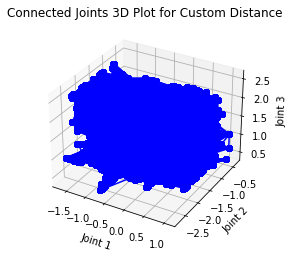

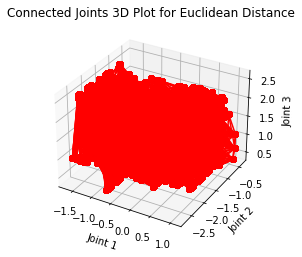

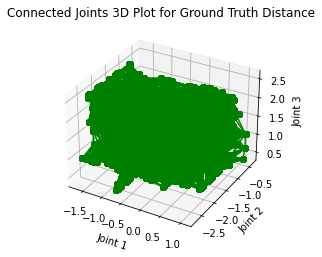

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f1865e5cdc0> (for post_execute):


KeyboardInterrupt: 

In [98]:
plot_connected_joints_3d(custom_roadmap, 'b', 'Custom Distance', '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/custom_roadmap_n3_joint_angles.png')
plot_connected_joints_3d(euclidean_roadmap, 'r', 'Euclidean Distance', '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/euclidean_roadmap_n3_joint_angles.png')
plot_connected_joints_3d(gt_roadmap, 'g', 'Ground Truth Distance', '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/gt_roadmap_n3_joint_angles.png')

# Plot for all roadmaps together
roadmaps = [custom_roadmap, euclidean_roadmap, gt_roadmap]
labels = ['Custom Distance', 'Euclidean Distance', 'Ground Truth Distance']
plot_connected_joints_3d_all(roadmaps, labels, 'all_roadmaps_joint_angles.png')

common_edge_custom = find_common_edges(custom_roadmap, gt_roadmap)
common_edge_euclidean = find_common_edges(custom_roadmap, gt_roadmap)

print(common_edge_custom, common_edge_euclidean)

# Print graph statistics
print_graph_statistics(custom_roadmap, "Custom PRM")
print_graph_statistics(euclidean_roadmap, "Euclidean PRM")
print_graph_statistics(gt_roadmap, "Joint Space PRM")

# Calculate joint angle distances for edges in each roadmap
custom_joint_distances = calculate_joint_angle_distances(custom_roadmap)
euclidean_joint_distances = calculate_joint_angle_distances(euclidean_roadmap)
joint_space_joint_distances = calculate_joint_angle_distances(gt_roadmap)

# Plot histograms for joint angle distances
distance_list = [custom_joint_distances, euclidean_joint_distances, joint_space_joint_distances]
labels = ['Custom PRM', 'Euclidean PRM', 'Joint Space PRM']
colors = ['blue', 'green', 'orange']
output_prefix = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/joint_angle_distances'
plot_joint_distance_histograms(distance_list, labels, colors, output_prefix)

In [ ]:
custom_graph_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/custom_roadmap_angle_fresh.pkl'
custom_tree_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/custom_tree_angle_fresh.pkl'
euclidean_g_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/euclidean_roadmap_fresh.pkl'
euclidean_tree_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/euclidean_tree_fresh.pkl'
gt_graph_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/joint_space_roadmap_angle_fresh.pkl'
gt_tree_path = '/home/jc-merlab/Pictures/Dl_Exps/sim_vs/servoing/configurations_and_goals/joint_space_tree_angle_fresh.pkl'

In [56]:
def save_graph(custom_graph, custom_tree, euclidean_graph, euclidean_tree, \
                gt_graph, gt_tree, custom_graph_path, custom_tree_path, \
                euclidean_g_path, euclidean_tree_path, gt_graph_path, gt_tree_path):
    
    with open(custom_graph_path, 'wb') as f:
        pickle.dump(custom_graph, f)
    with open(custom_tree_path, 'wb') as f:
        pickle.dump(custom_tree, f)
    print(f"Graph saved to {custom_graph_path}")
    print(f"BallTree saved to {custom_tree_path}")

    with open(euclidean_g_path, 'wb') as f:
        pickle.dump(euclidean_graph, f)
    with open(euclidean_tree_path, 'wb') as f:
        pickle.dump(euclidean_tree, f)
    print(f"Graph saved to {euclidean_g_path}")
    print(f"KDTree saved to {euclidean_tree_path}")

    with open(gt_graph_path, 'wb') as f:
        pickle.dump(gt_graph, f)
    with open(gt_tree_path, 'wb') as f:
        pickle.dump(gt_tree, f)
    print(f"Graph saved to {gt_graph_path}")
    print(f"KDTree with joint distance saved to {gt_tree_path}")
    

save_graph(custom_roadmap, custom_tree, euclidean_roadmap, euclidean_tree, \
                gt_roadmap, gt_tree, custom_graph_path, custom_tree_path, \
                euclidean_g_path, euclidean_tree_path, gt_graph_path, gt_tree_path)

NameError: name 'save_graph' is not defined